In [1]:
import pandas as pd
import lecilab_behavior_analysis.utils as utils
import lecilab_behavior_analysis.plots as plots
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import lecilab_behavior_analysis.df_transforms as dft
from sklearn.linear_model import LogisticRegression
import seaborn as sns
import statsmodels.api as sm
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler


import autograd.numpy.random as npr
# npr.seed(0)
import ssm
from ssm.util import find_permutation
from ssm.plots import gradient_cmap, white_to_color_cmap

# %load_ext autoreload
# %autoreload 2


/home/kudongdong/anaconda3/envs/kudongdong/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings('ignore')


# Data Import

In [3]:
# load data from cluster
tv_projects = utils.get_server_projects()
print(tv_projects)

['auditory_escape_data', 'cate_task_data', 'COT_cannula_data', 'COT_test_data', 'dual2AFC_iDisco_data', 'empty-project_data', 'visual_and_COT_data']


In [4]:
# project = "visual_and_COT_data"
project = "COT_cannula_data"


## single mouse data import

In [5]:
# see the available animals
animals = utils.get_animals_in_project(project)
print(animals)
# download the data for a specific animal
mouse = "NUO009"
local_path = Path(utils.get_outpath()) / Path(project) / Path("sessions") / Path(mouse)
# create the directory if it doesn't exist
local_path.mkdir(parents=True, exist_ok=True)
# download the session data
utils.rsync_cluster_data(
    project_name=project,
    file_path="sessions/{}/{}.csv".format(mouse, mouse),
    local_path=str(local_path),
    credentials=utils.get_idibaps_cluster_credentials(),
)
# load the data
df = pd.read_csv(local_path / Path(f'{mouse}.csv'), sep=";")

['NUO001', 'NUO002', 'NUO003', 'NUO004', 'NUO005', 'NUO006', 'NUO007', 'NUO008', 'NUO009', 'NUO010', 'NUO011', 'NUO012']


receiving incremental file list
NUO009.csv

sent 119,796 bytes  received 498,106 bytes  42,613.93 bytes/sec
total size is 295,532,338  speedup is 478.28


In [6]:
df_test_multi = df[df['current_training_stage'] == 'TwoAFC_multisensory_easy']
df_test_multi_vis = df_test_multi[df_test_multi['stimulus_modality'] == 'visual']
df_test_multi_vis = dft.parameters_for_fit(df_test_multi_vis)
df_test_multi_aud = df_test_multi[df_test_multi['stimulus_modality'] == 'auditory']
df_test_multi_aud = dft.parameters_for_fit(df_test_multi_aud)
df_test_multi = pd.concat([df_test_multi_vis, df_test_multi_aud]).sort_index()

## multiple mice data import

In [126]:
# run this if you want to pull data from several animals
# acv_animals = [f"ACV{str(i).zfill(3)}" for i in range(1, 11)]
# nuo_animals = [f"NUO{str(i).zfill(3)}" for i in range(1, 13)]

#ACV mice 2afc multisensory hard stage data
acv_animals = ["ACV002", "ACV004", "ACV008", "ACV010"]

df_dic = {}
for mouse in acv_animals:
    local_path = Path(utils.get_outpath()) / Path(project) / Path("sessions") / Path(mouse)
    # create the directory if it doesn't exist
    local_path.mkdir(parents=True, exist_ok=True)
    # download the session data
    utils.rsync_cluster_data(
        project_name=project,
        file_path="sessions/{}/{}.csv".format(mouse, mouse),
        local_path=str(local_path),
        credentials=utils.get_idibaps_cluster_credentials(),
    )
    # load the data
    df_single = pd.read_csv(local_path / Path(f'{mouse}.csv'), sep=";")
    df_dic[mouse] = df_single


receiving incremental file list

sent 20 bytes  received 74 bytes  17.09 bytes/sec
total size is 495,635,722  speedup is 5,272,720.45


receiving incremental file list

sent 20 bytes  received 74 bytes  26.86 bytes/sec
total size is 453,793,098  speedup is 4,827,586.15


receiving incremental file list

sent 20 bytes  received 73 bytes  16.91 bytes/sec
total size is 466,592,375  speedup is 5,017,122.31


receiving incremental file list

sent 20 bytes  received 74 bytes  17.09 bytes/sec
total size is 501,401,118  speedup is 5,334,054.45


In [127]:
df_dic_hard_vis = {}
df_dic_hard_aud = {}
df_test_visual = pd.DataFrame()
df_test_auditory = pd.DataFrame()
for mouse in df_dic:
    df_dic[mouse] = dft.analyze_df(df_dic[mouse])
    df_dic_hard_vis[mouse] = df_dic[mouse][df_dic[mouse]["current_training_stage"] == "TwoAFC_visual_hard"]
    df_dic_hard_vis[mouse] = dft.parameters_for_fit(df_dic_hard_vis[mouse])
    df_test_visual = pd.concat([df_test_visual, df_dic_hard_vis[mouse]], ignore_index=True)
    df_dic_hard_aud[mouse] = df_dic[mouse][df_dic[mouse]["current_training_stage"] == "TwoAFC_auditory_hard"]
    df_dic_hard_aud[mouse] = dft.parameters_for_fit(df_dic_hard_aud[mouse])
    df_test_auditory = pd.concat([df_test_auditory, df_dic_hard_aud[mouse]], ignore_index=True)

In [130]:
df_dic_hard_multi_vis = {}
df_dic_hard_multi_aud = {}
df_test_visual_multi = pd.DataFrame()
df_test_auditory_multi = pd.DataFrame()
for mouse in df_dic:
    df_dic[mouse] = dft.analyze_df(df_dic[mouse])
    df_dic_hard_multi_vis[mouse] = df_dic[mouse][(df_dic[mouse]["current_training_stage"] == "TwoAFC_multisensory_hard") & (df_dic[mouse]['stimulus_modality'] == 'visual')]
    df_dic_hard_multi_vis[mouse] = dft.parameters_for_fit(df_dic_hard_multi_vis[mouse])
    df_test_visual_multi = pd.concat([df_test_visual_multi, df_dic_hard_multi_vis[mouse]], ignore_index=True)
    df_dic_hard_multi_aud[mouse] = df_dic[mouse][(df_dic[mouse]["current_training_stage"] == "TwoAFC_multisensory_hard") & (df_dic[mouse]['stimulus_modality'] == 'auditory')]
    df_dic_hard_multi_aud[mouse] = dft.parameters_for_fit(df_dic_hard_multi_aud[mouse])
    df_test_auditory_multi = pd.concat([df_test_auditory_multi, df_dic_hard_multi_aud[mouse]], ignore_index=True)

In [7]:
df_dic_vis = {}
df_dic_aud = {}
df_all_visual = pd.DataFrame()
df_all_auditory = pd.DataFrame()
for mouse in df_dic:
    df_dic[mouse] = dft.analyze_df(df_dic[mouse])
    df_dic_vis[mouse] = df_dic[mouse][(df_dic[mouse]["stimulus_modality"].str.contains("visual", na=False)) &
                                      (df_dic[mouse]["task"] != "Habituation")]
    df_dic_vis[mouse] = dft.parameters_for_fit(df_dic_vis[mouse])
    df_all_visual = pd.concat([df_all_visual, df_dic_vis[mouse]], ignore_index=True)
    df_dic_aud[mouse] = df_dic[mouse][(df_dic[mouse]["stimulus_modality"].str.contains("auditory", na=False)) &
                                      (df_dic[mouse]["task"] != "Habituation")]
    df_dic_aud[mouse] = dft.parameters_for_fit(df_dic_aud[mouse])
    df_all_auditory = pd.concat([df_all_auditory, df_dic_aud[mouse]], ignore_index=True)

In [ ]:
for mouse in df_dic:
    if 'TwoAFC_multisensory_hard' in df_dic[mouse]['current_training_stage'].unique():
        print(mouse)

ACV002
ACV004
ACV008
ACV010


# psychometric curve test

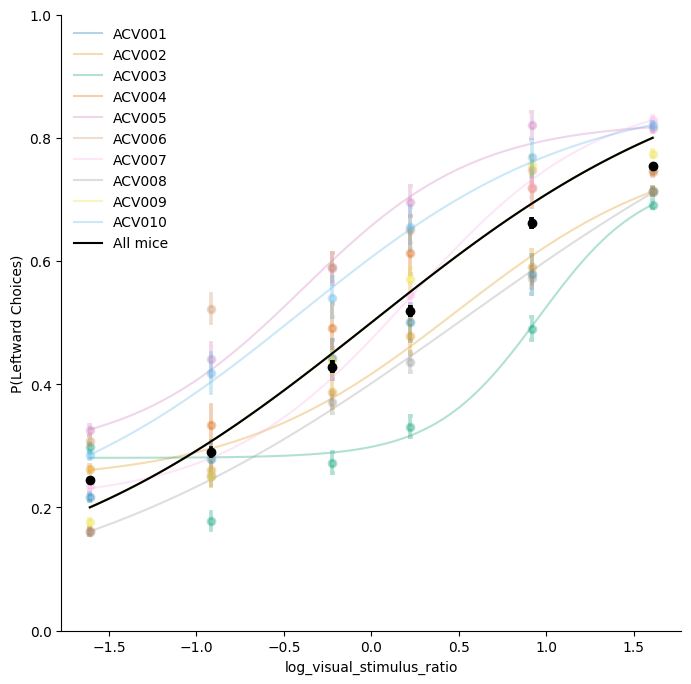

In [20]:
plt.figure(figsize=(8, 8))
for df_name, df, color in zip(df_dic_vis.keys(), df_dic_vis.values(), sns.color_palette("colorblind", len(df_dic_vis))):
    plots.psychometric_plot(df, x='visual_stimulus_ratio', y='first_choice_numeric', point_kwargs={'color': color, 'label' : '', 'alpha': 0.3}, line_kwargs={'color': color, 'label': df_name, 'alpha': 0.3})
plots.psychometric_plot(df_all_visual, x = 'visual_stimulus_ratio', y = 'first_choice_numeric', point_kwargs={'color': 'black', 'label' : ''}, line_kwargs={'color': 'black', 'label': 'All mice'})
plt.show()

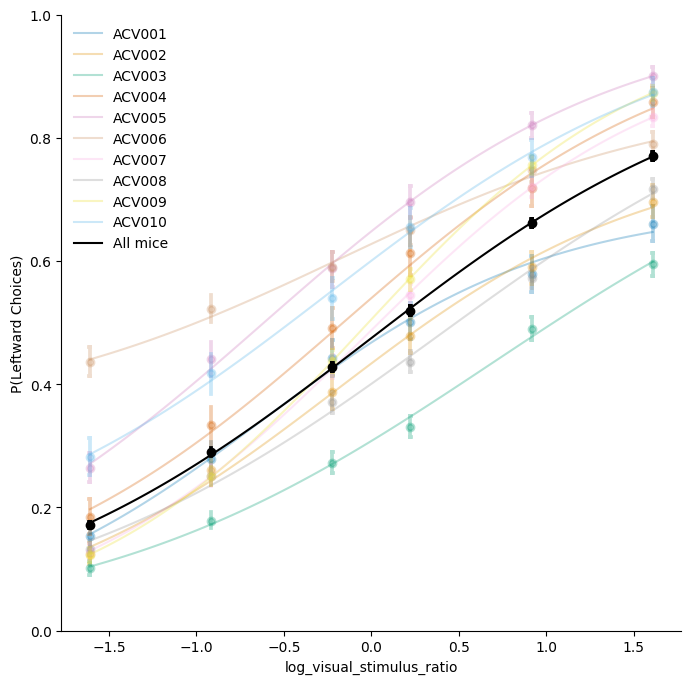

In [21]:
plt.figure(figsize=(8, 8))
for df_name, df, color in zip(df_dic_hard_vis.keys(), df_dic_hard_vis.values(), sns.color_palette("colorblind", len(df_dic_hard_vis))):
    plots.psychometric_plot(df, x='visual_stimulus_ratio', y='first_choice_numeric', point_kwargs={'color': color, 'label' : '', 'alpha': 0.3}, line_kwargs={'color': color, 'label': df_name, 'alpha': 0.3})
plots.psychometric_plot(df_test_visual, x = 'visual_stimulus_ratio', y = 'first_choice_numeric', point_kwargs={'color': 'black', 'label' : ''}, line_kwargs={'color': 'black', 'label': 'All mice'})
plt.show()

In [22]:
def rescale_to_range(x, new_min=0, new_max=1):
    x = np.array(x, dtype=float)
    old_min, old_max = np.min(x), np.max(x)
    x_scaled = (x - old_min) / (old_max - old_min) * (new_max - new_min) + new_min
    return x_scaled

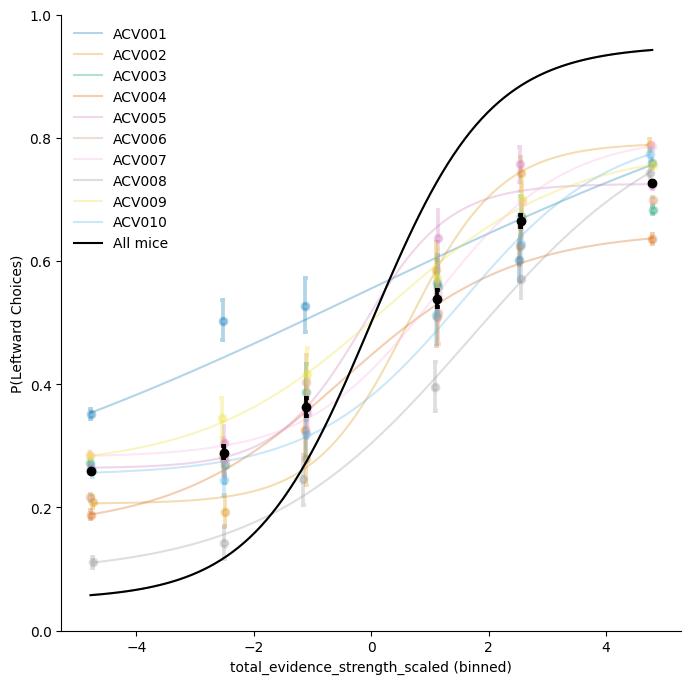

In [25]:
plt.figure(figsize=(8, 8))
for df_name, df, color in zip(df_dic_aud.keys(), df_dic_aud.values(), sns.color_palette("colorblind", len(df_dic_aud))):
    df['total_evidence_strength_scaled'] = rescale_to_range(df['total_evidence_strength'], new_min=df_all_visual['visual_stimulus_ratio'].min(), new_max=df_all_visual['visual_stimulus_ratio'].max())
    plots.psychometric_plot(df, x='total_evidence_strength_scaled', y='first_choice_numeric', valueType='continue', point_kwargs={'color': color, 'label' : '', 'alpha': 0.3}, line_kwargs={'color': color, 'label': df_name, 'alpha': 0.3})
df_all_auditory['total_evidence_strength_scaled'] = rescale_to_range(df_all_auditory['total_evidence_strength'], new_min=df_all_visual['visual_stimulus_ratio'].min(), new_max=df_all_visual['visual_stimulus_ratio'].max())
plots.psychometric_plot(df_all_auditory, x = 'total_evidence_strength_scaled', y = 'first_choice_numeric', valueType='continue', point_kwargs={'color': 'black', 'label' : ''}, line_kwargs={'color': 'black', 'label': 'All mice'})
plt.show()

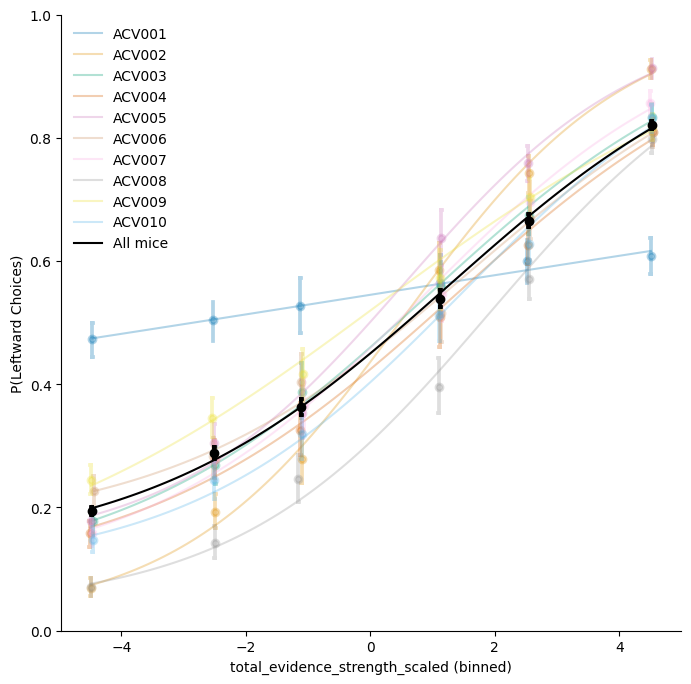

In [26]:
plt.figure(figsize=(8, 8))
for df_name, df, color in zip(df_dic_hard_aud.keys(), df_dic_hard_aud.values(), sns.color_palette("colorblind", len(df_dic_hard_aud))):
    df['total_evidence_strength_scaled'] = rescale_to_range(df['total_evidence_strength'], new_min=df_test_visual['visual_stimulus_ratio'].min(), new_max=df_test_visual['visual_stimulus_ratio'].max())
    plots.psychometric_plot(df, x='total_evidence_strength_scaled', y='first_choice_numeric', valueType='continue', point_kwargs={'color': color, 'label' : '', 'alpha': 0.3}, line_kwargs={'color': color, 'label': df_name, 'alpha': 0.3})
df_test_auditory['total_evidence_strength_scaled'] = rescale_to_range(df_test_auditory['total_evidence_strength'], new_min=df_test_visual['visual_stimulus_ratio'].min(), new_max=df_test_visual['visual_stimulus_ratio'].max())
plots.psychometric_plot(df_test_auditory, x = 'total_evidence_strength_scaled', y = 'first_choice_numeric', valueType='continue', point_kwargs={'color': 'black', 'label' : ''}, line_kwargs={'color': 'black', 'label': 'All mice'})
plt.show()

## psychometric curve in different stimuls intensity

In [8]:
df_test_vis = df_dic_vis['NUO001']

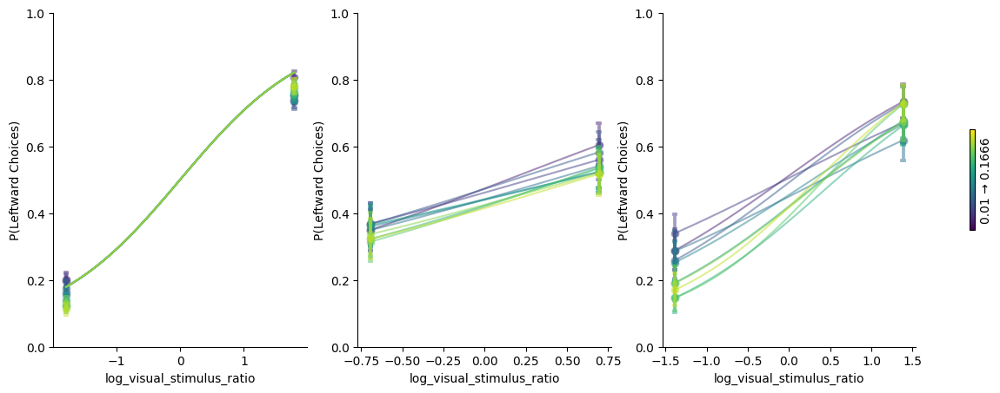

In [89]:
# self.settings.side_port_wrong_intensities_extremes = [0.01, 0.1666]
bins = np.linspace(0.01, 0.1666, num=11)
labels = [f"{round(bins[i], 4)}-{round(bins[i+1], 4)}" for i in range(len(bins)-1)]
df_test_vis["wrong_bright_bin"] = pd.cut(df_test_vis["wrong_bright"], bins=bins, labels=labels)
fig, ax = plt.subplots(1, 3, figsize=(16, 5))
colors = sns.color_palette("viridis", len(labels))
for label, color in zip(labels, colors):
    for i, difficulty in enumerate(df_test_vis['difficulty'].unique()):
        df_test_vis_difficulty = df_test_vis[df_test_vis['difficulty'] == difficulty]
        df_test_vis_bin = df_test_vis_difficulty[df_test_vis_difficulty["wrong_bright_bin"] == label]
        plots.psychometric_plot(df_test_vis_bin, x='visual_stimulus_ratio', y='first_choice_numeric', ax=ax[i], point_kwargs={'label': None, 'color': color, 'alpha': 0.5}, line_kwargs={'label': None, 'color': color, 'alpha': 0.5})
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=sns.color_palette("viridis", as_cmap=True)), ax=ax, orientation='vertical', shrink=0.3)
cbar.set_ticks([])
cbar.set_label('0.01 → 0.1666')

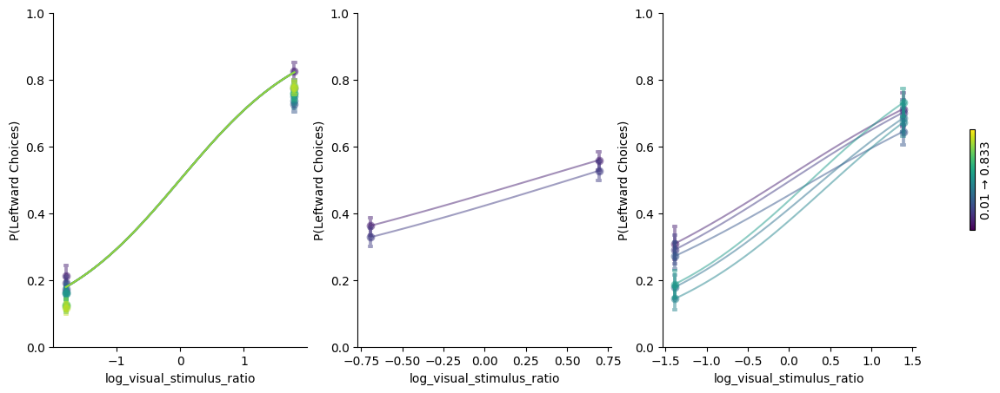

In [98]:
# self.settings.side_port_wrong_intensities_extremes = [0.01, 0.1666]
bins = np.linspace(0.01, 0.833, num=11)
labels = [f"{round(bins[i], 4)}-{round(bins[i+1], 4)}" for i in range(len(bins)-1)]
df_test_vis["viStim_diff_bin"] = pd.cut(df_test_vis["visual_stimulus_diff"].abs(), bins=bins, labels=labels)
fig, ax = plt.subplots(1, 3, figsize=(16, 5))
colors = sns.color_palette("viridis", len(labels))
for i, difficulty in enumerate(df_test_vis['difficulty'].unique()):
    df_test_vis_difficulty = df_test_vis[df_test_vis['difficulty'] == difficulty]
    for label, color in zip(labels, colors):
        df_test_vis_bin = df_test_vis_difficulty[df_test_vis_difficulty["viStim_diff_bin"] == label]
        if len(df_test_vis_bin) != 0:
            plots.psychometric_plot(df_test_vis_bin, x='visual_stimulus_ratio', y='first_choice_numeric', ax=ax[i], point_kwargs={'label': None, 'color': color, 'alpha': 0.5}, line_kwargs={'label': None, 'color': color, 'alpha': 0.5})
        else:
            pass
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=sns.color_palette("viridis", as_cmap=True)), ax=ax, orientation='vertical', shrink=0.3)
cbar.set_ticks([])
cbar.set_label('0.01 → 0.833')

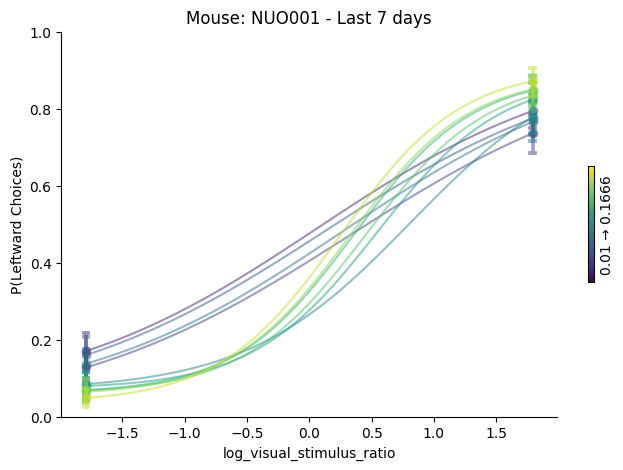

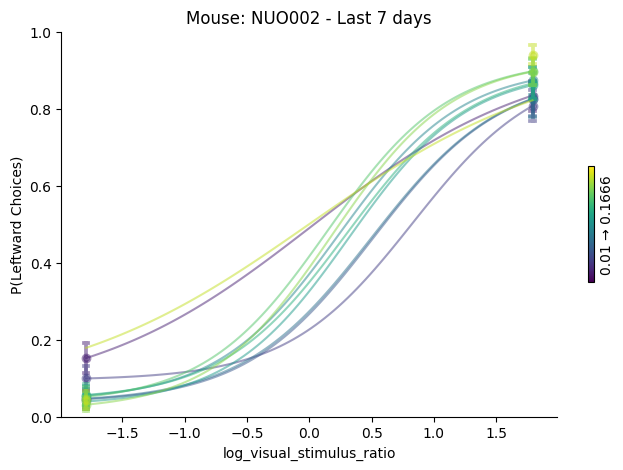

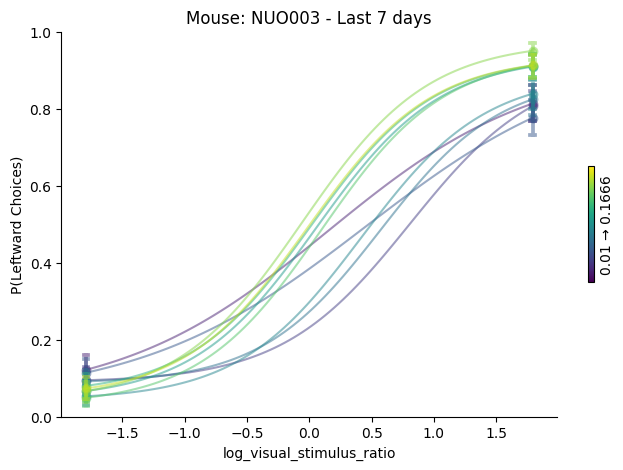

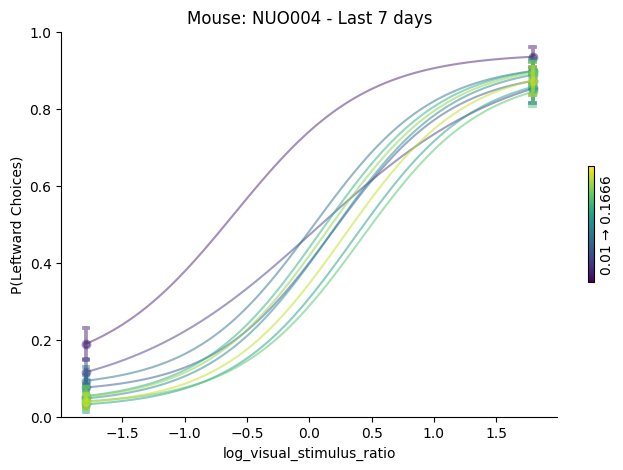

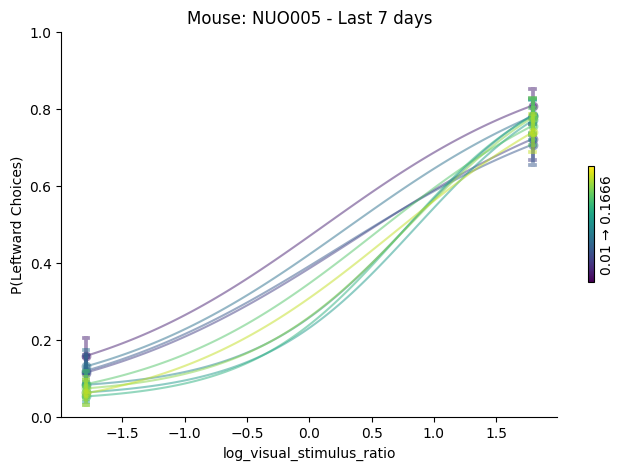

...

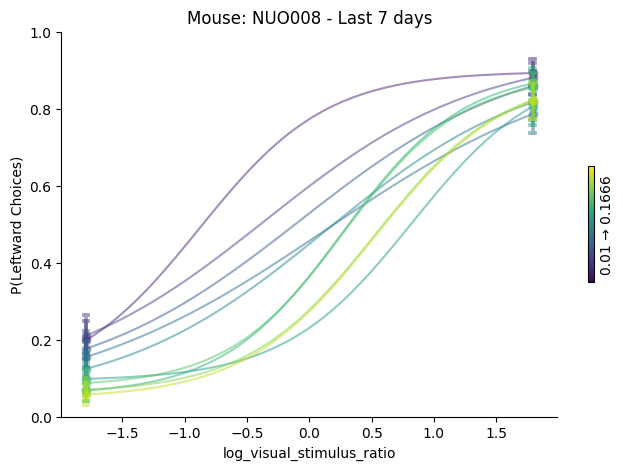

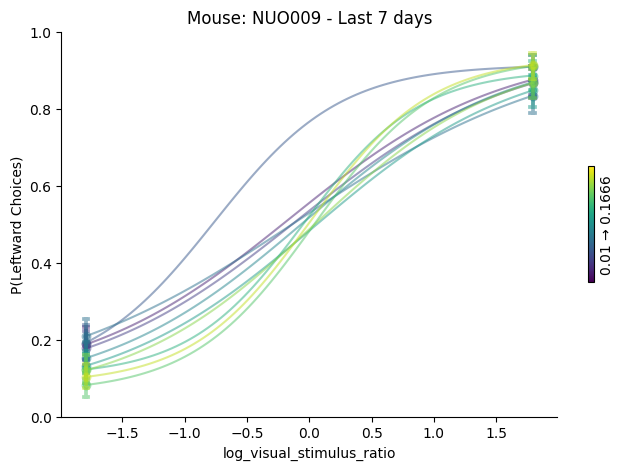

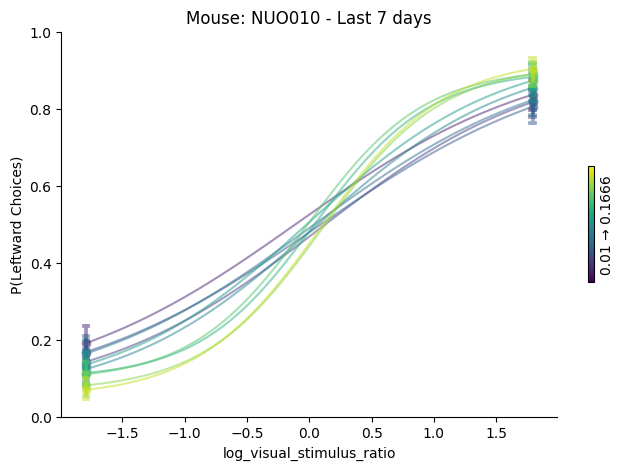

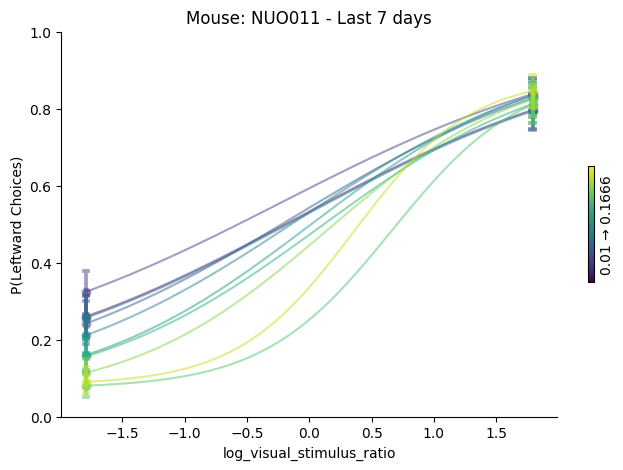

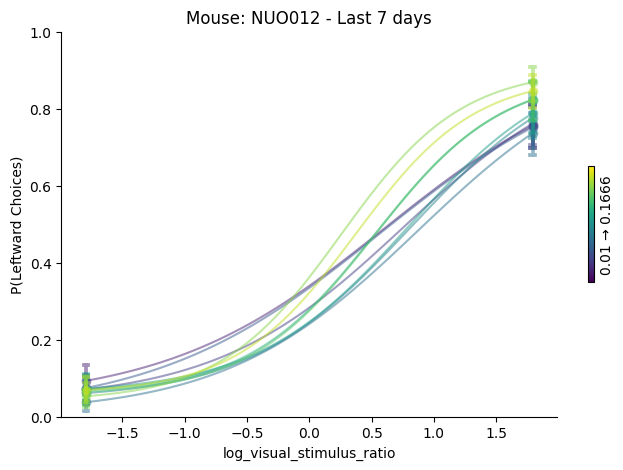

In [109]:
for mouse in df_dic_vis:
    df_test_vis = df_dic_vis[mouse]
    df_test_vis["year_month_day"] = pd.to_datetime(df_test_vis["year_month_day"])
    latest_day = df_test_vis["year_month_day"].max()
    df_test_vis_recent = df_test_vis[df_test_vis["year_month_day"] >= latest_day - pd.Timedelta(days=7)]
    # self.settings.side_port_wrong_intensities_extremes = [0.01, 0.1666]
    bins = np.linspace(0.01, 0.1666, num=11)
    labels = [f"{round(bins[i], 4)}-{round(bins[i+1], 4)}" for i in range(len(bins)-1)]
    df_test_vis_recent["wrong_bright_bin"] = pd.cut(df_test_vis_recent["wrong_bright"], bins=bins, labels=labels)
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    colors = sns.color_palette("viridis", len(labels))
    for label, color in zip(labels, colors):
        df_test_vis_bin = df_test_vis_recent[df_test_vis_recent["wrong_bright_bin"] == label]
        plots.psychometric_plot(df_test_vis_bin, x='visual_stimulus_ratio', y='first_choice_numeric', ax=ax, point_kwargs={'label': None, 'color': color, 'alpha': 0.5}, line_kwargs={'label': None, 'color': color, 'alpha': 0.5})
    cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=sns.color_palette("viridis", as_cmap=True)), ax=ax, orientation='vertical', shrink=0.3)
    cbar.set_ticks([])
    cbar.set_label('0.01 → 0.1666')
    plt.title(f'Mouse: {mouse} - Last 7 days')
    fig.savefig(f'/home/kudongdong/data/LeciLab/temporary_plots/psychometric_wrong_bright_{mouse}_last7days.png')

In [116]:
lapse_left_list_vis = []
lapse_right_list_vis = []
beta_list_vis = []
x0_list_vis = []
for mouse in df_dic_hard_vis:
    y, params = utils.psychometric_curve_fitting_params(df_dic_hard_vis[mouse], x = 'visual_stimulus_ratio', y = 'first_choice_numeric')
    (lapse_left, lapse_right, beta, x0) = params
    lapse_left_list_vis.append(lapse_left)
    lapse_right_list_vis.append(lapse_right)
    beta_list_vis.append(beta)
    x0_list_vis.append(x0)
    
lapse_left_list_aud = []
lapse_right_list_aud = []
beta_list_aud = []
x0_list_aud = []
for mouse in df_dic_hard_aud:
    df_dic_hard_aud[mouse]['total_evidence_strength_scaled'] = rescale_to_range(df_dic_hard_aud[mouse]['total_evidence_strength'], new_min=df_test_visual['visual_stimulus_ratio'].min(), new_max=df_test_visual['visual_stimulus_ratio'].max())
    y, params = utils.psychometric_curve_fitting_params(df_dic_hard_aud[mouse], x = 'total_evidence_strength_scaled', y = 'first_choice_numeric', valueType='continue', bins=6)
    (lapse_left, lapse_right, beta, x0) = params
    lapse_left_list_aud.append(lapse_left)
    lapse_right_list_aud.append(lapse_right)
    beta_list_aud.append(beta)
    x0_list_aud.append(x0)

In [117]:
params_vis = pd.DataFrame({
            'lapse_left': lapse_left_list_vis,
            'lapse_right': lapse_right_list_vis,
            'beta': beta_list_vis,
            'x0': x0_list_vis
            })
params_vis['condition'] = 'Visual'

params_aud = pd.DataFrame({
            'lapse_left': lapse_left_list_aud,
            'lapse_right': lapse_right_list_aud,
            'beta': beta_list_aud,
            'x0': x0_list_aud
            })
params_aud['condition'] = 'Auditory'

params_df = pd.concat([params_vis, params_aud], ignore_index=True)

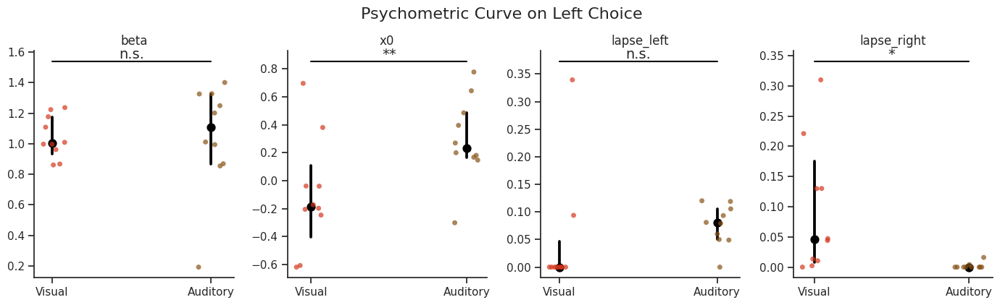

In [118]:
plots.plot_param_comparison(
    df=params_df,
    params=['beta', 'x0', 'lapse_left', 'lapse_right'],
    conditions=['Visual', 'Auditory'],
    test='paired_t',
    title='Psychometric Curve on Left Choice',
    palette=["#D4361D", "#875215"]
)

In [124]:
df_test_visual['visual_stimulus']

0            (0.5162206099313748, 0.10324412198627496)
1           (0.24108079718080433, 0.19286463774464346)
2            (0.1748277674827346, 0.13986221398618767)
3           (0.12039353652573954, 0.09631482922059163)
4            (0.9353103854384837, 0.18706207708769673)
                              ...                     
113210       (0.1226834305255923, 0.09814674442047384)
113211       (0.8123942243510562, 0.16247884487021125)
113212    (0.061877192774476626, 0.012375438554895325)
113213      (0.47025688519105663, 0.09405137703821133)
113214       (0.2636083197283661, 0.05272166394567322)
Name: visual_stimulus, Length: 113215, dtype: object

In [119]:
lapse_hard_list_vis = []
lapse_easy_list_vis = []
beta_list_vis = []
x0_list_vis = []
for mouse in df_dic_hard_vis:
    y, params = utils.psychometric_curve_fitting_params(df_dic_hard_vis[mouse], x = 'abs_visual_stimulus_ratio', y = 'correct_numeric')
    (lapse_hard, lapse_easy, beta, x0) = params
    lapse_hard_list_vis.append(lapse_hard)
    lapse_easy_list_vis.append(lapse_easy)
    beta_list_vis.append(beta)
    x0_list_vis.append(x0)

lapse_hard_list_aud = []
lapse_easy_list_aud = []
beta_list_aud = []
x0_list_aud = []
for mouse in df_dic_hard_aud:
    df_dic_hard_aud[mouse]['total_evidence_strength_scaled'] = rescale_to_range(df_dic_hard_aud[mouse]['total_evidence_strength'], new_min=df_test_visual['visual_stimulus_ratio'].min(), new_max=df_test_visual['visual_stimulus_ratio'].max())
    df_dic_hard_aud[mouse]['abs_total_evidence_strength_scaled'] = df_dic_hard_aud[mouse]['total_evidence_strength_scaled'].abs()
    y, params = utils.psychometric_curve_fitting_params(df_dic_hard_aud[mouse], x = 'abs_total_evidence_strength_scaled', y = 'correct_numeric', valueType='continue', bins=3)
    (lapse_hard, lapse_easy, beta, x0) = params
    lapse_hard_list_aud.append(lapse_hard)
    lapse_easy_list_aud.append(lapse_easy)
    beta_list_aud.append(beta)
    x0_list_aud.append(x0)

In [120]:
params_vis = pd.DataFrame({
            'lapse_hard': lapse_hard_list_vis,
            'lapse_easy': lapse_easy_list_vis,
            'beta': beta_list_vis,
            'x0': x0_list_vis
            })
params_vis['condition'] = 'Visual'

params_aud = pd.DataFrame({
            'lapse_hard': lapse_hard_list_aud,
            'lapse_easy': lapse_easy_list_aud,
            'beta': beta_list_aud,
            'x0': x0_list_aud
            })
params_aud['condition'] = 'Auditory'

params_df = pd.concat([params_vis, params_aud], ignore_index=True)

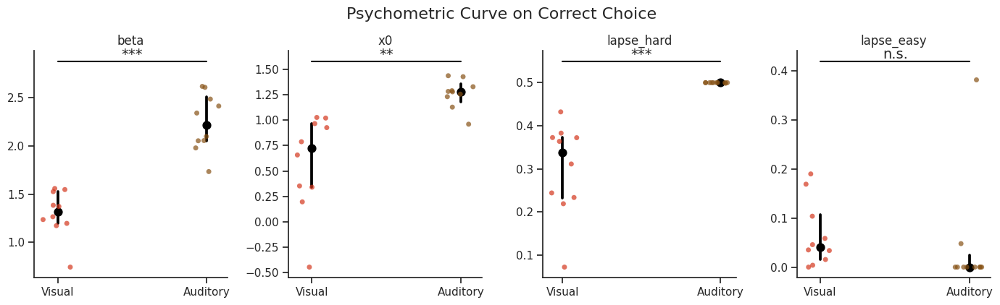

In [121]:
plots.plot_param_comparison(
    df=params_df,
    params=['beta', 'x0', 'lapse_hard', 'lapse_easy'],
    conditions=['Visual', 'Auditory'],
    test='paired_t',
    title='Psychometric Curve on Correct Choice',
    palette=["#D4361D", "#875215"]
)

# Correct wrong psychometric curve

Text(0.5, 1.0, 'Right Choice Previous multimodality hard')

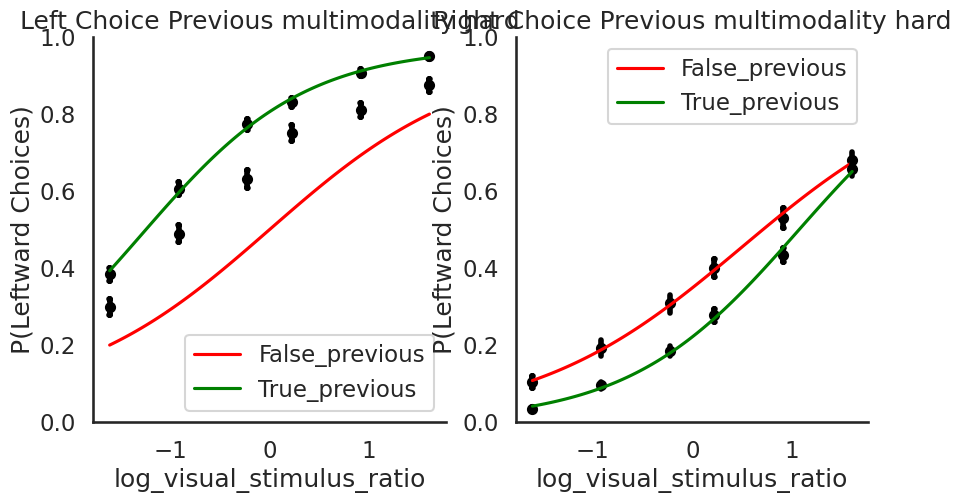

In [131]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
for i, linecolor in zip(df_test_visual_multi[df_test_visual_multi['previous_port_before_stimulus'] == 'left'].groupby('previous_correct_numeric'), ['red', 'green']):
    plots.psychometric_plot(i[1], x = 'visual_stimulus_ratio', y = 'first_choice_numeric',
                            line_kwargs={'color': linecolor,
                                         'label': 'True_previous' if i[0] == 1 else 'False_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[0])

for i, linecolor in zip(df_test_visual_multi[df_test_visual_multi['previous_port_before_stimulus'] == 'right'].groupby('previous_correct_numeric'), ['red', 'green']):
    plots.psychometric_plot(i[1], x = 'visual_stimulus_ratio', y = 'first_choice_numeric',
                            line_kwargs={'color': linecolor,
                                         'label': 'True_previous' if i[0] == 1 else 'False_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[1])
ax[0].legend()
ax[0].set_title("Left Choice Previous multimodality hard")
ax[1].legend()
ax[1].set_title("Right Choice Previous multimodality hard")

Text(0.5, 1.0, 'Right Choice Previous multimodality hard')

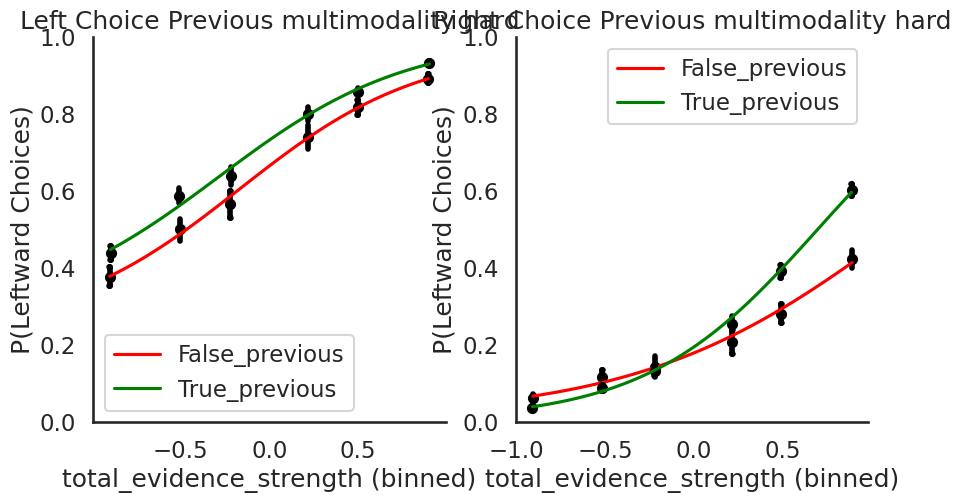

In [135]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
for i, linecolor in zip(df_test_auditory_multi[df_test_auditory_multi['previous_port_before_stimulus'] == 'left'].groupby('previous_correct_numeric'), ['red', 'green']):
    plots.psychometric_plot(i[1], x = 'total_evidence_strength', y = 'first_choice_numeric', valueType='continue',
                            line_kwargs={'color': linecolor,
                                         'label': 'True_previous' if i[0] == 1 else 'False_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[0])

for i, linecolor in zip(df_test_auditory_multi[df_test_auditory_multi['previous_port_before_stimulus'] == 'right'].groupby('previous_correct_numeric'), ['red', 'green']):
    plots.psychometric_plot(i[1], x = 'total_evidence_strength', y = 'first_choice_numeric', valueType='continue',
                            line_kwargs={'color': linecolor,
                                         'label': 'True_previous' if i[0] == 1 else 'False_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[1])
ax[0].legend()
ax[0].set_title("Left Choice Previous multimodality hard")
ax[1].legend()
ax[1].set_title("Right Choice Previous multimodality hard")

Text(0.5, 1.0, 'Incorrect Choice Previous multimodality hard')

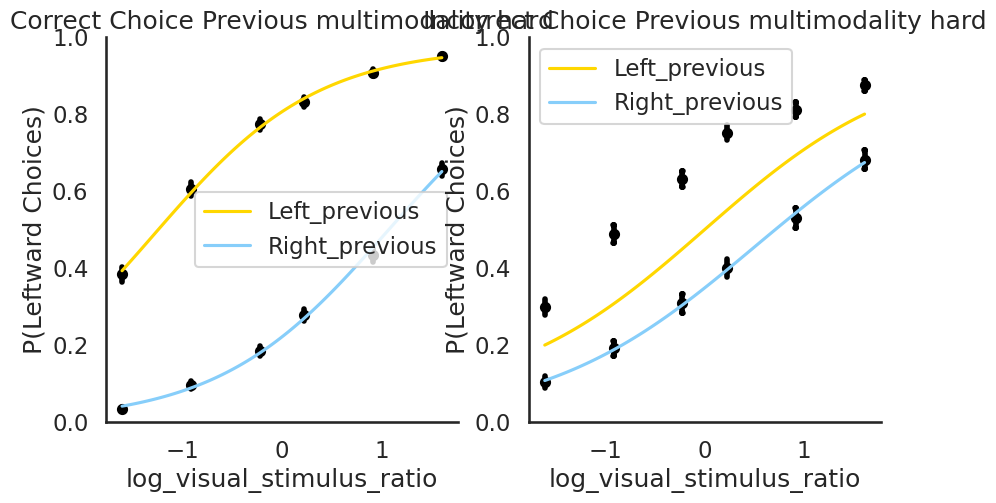

In [136]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
for i, linecolor in zip(df_test_visual_multi[df_test_visual_multi['previous_correct_numeric'] == 1].groupby('previous_port_before_stimulus'), ['gold', 'lightskyblue']):
    plots.psychometric_plot(df = i[1], x = 'visual_stimulus_ratio', y = 'first_choice_numeric', 
                            line_kwargs={'color': linecolor,
                                         'label': 'Left_previous' if i[0] == 'left' else 'Right_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[0])

for i, linecolor in zip(df_test_visual_multi[df_test_visual_multi['previous_correct_numeric'] == 0].groupby('previous_port_before_stimulus'), ['gold', 'lightskyblue']):
    plots.psychometric_plot(df = i[1], x = 'visual_stimulus_ratio', y = 'first_choice_numeric', 
                            line_kwargs={'color': linecolor,
                                         'label': 'Left_previous' if i[0] == 'left' else 'Right_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[1])
ax[0].legend()
ax[0].set_title("Correct Choice Previous multimodality hard")
ax[1].legend()
ax[1].set_title("Incorrect Choice Previous multimodality hard")

Text(0.5, 1.0, 'Incorrect Choice Previous multimodality hard')

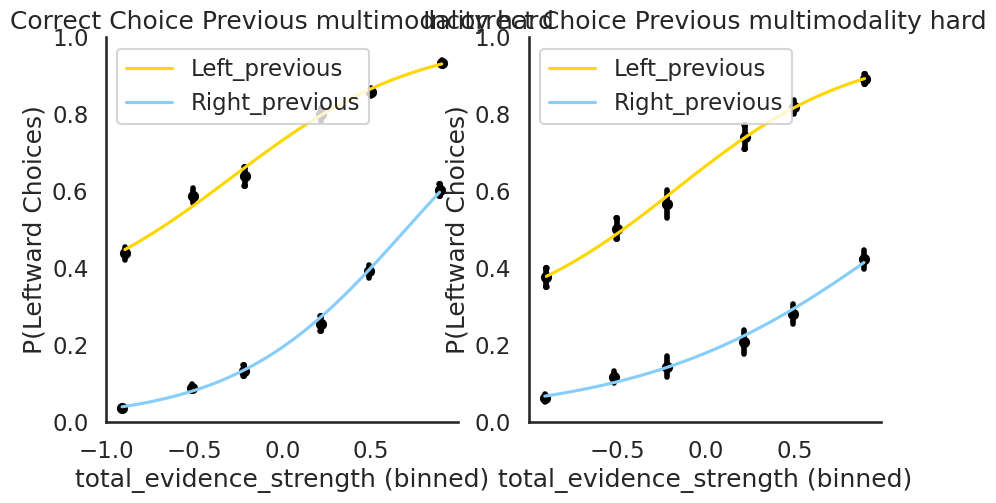

In [137]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
for i, linecolor in zip(df_test_auditory_multi[df_test_auditory_multi['previous_correct_numeric'] == 1].groupby('previous_port_before_stimulus'), ['gold', 'lightskyblue']):
    plots.psychometric_plot(i[1], x = 'total_evidence_strength', y = 'first_choice_numeric', valueType='continue',
                            line_kwargs={'color': linecolor,
                                         'label': 'Left_previous' if i[0] == 'left' else 'Right_previous'}, 
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[0])
    
for i, linecolor in zip(df_test_auditory_multi[df_test_auditory_multi['previous_correct_numeric'] == 0].groupby('previous_port_before_stimulus'), ['gold', 'lightskyblue']):
    plots.psychometric_plot(i[1], x = 'total_evidence_strength', y = 'first_choice_numeric', valueType='continue',
                            line_kwargs={'color': linecolor,
                                         'label': 'Left_previous' if i[0] == 'left' else 'Right_previous'},
                            point_kwargs={'color': 'black', 'label': None},
                            ax=ax[1])
ax[0].legend()
ax[0].set_title("Correct Choice Previous multimodality hard")
ax[1].legend()
ax[1].set_title("Incorrect Choice Previous multimodality hard")

# Matrix format

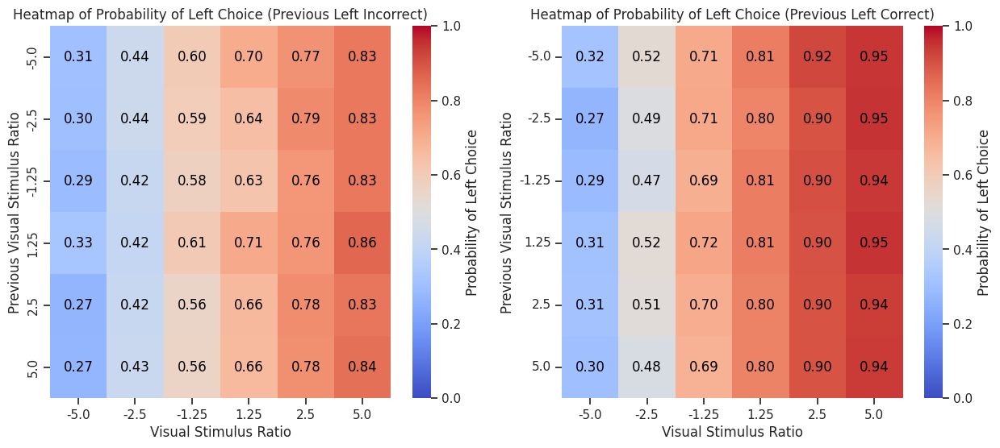

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
for i in df_test_visual[(df_test_visual['previous_port_before_stimulus'] == 'left')].groupby('previous_correct_numeric'):
    df_preleft = i[1]
    df_preleft['visual_stimulus_ratio'] = df_preleft['visual_stimulus_ratio'].apply(lambda x: round(x, 2))
    for mouse in df_preleft['subject'].unique():
        for session in df_preleft[df_preleft.subject == mouse]['session'].unique():
            df_mouse_session = df_preleft[np.logical_and(df_preleft['subject'] == mouse, df_preleft['session'] == session)]
            df_mouse_session['previous_visual_stimulus_ratio'] = df_mouse_session['visual_stimulus_ratio'].shift(1, fill_value=np.nan)
            df_preleft.loc[df_mouse_session.index, 'previous_visual_stimulus_ratio'] = df_mouse_session['previous_visual_stimulus_ratio']
    pivot_table = df_preleft.pivot_table(
        index='previous_visual_stimulus_ratio',
        columns='visual_stimulus_ratio',
        values='first_choice_numeric',
        aggfunc='mean',
        observed=True
    )
    # plot the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Probability of Left Choice'}, vmin=0, vmax=1, annot_kws={"color": "black"}, ax=axes[i[0]])
    axes[i[0]].set_xlabel("Visual Stimulus Ratio")
    axes[i[0]].set_ylabel("Previous Visual Stimulus Ratio")
    axes[i[0]].set_title("Heatmap of Probability of Left Choice (Previous Left {})".format('Correct' if i[0] == 1 else 'Incorrect'))
# rotate the y-axis labels
plt.yticks(rotation=0)
plt.show()

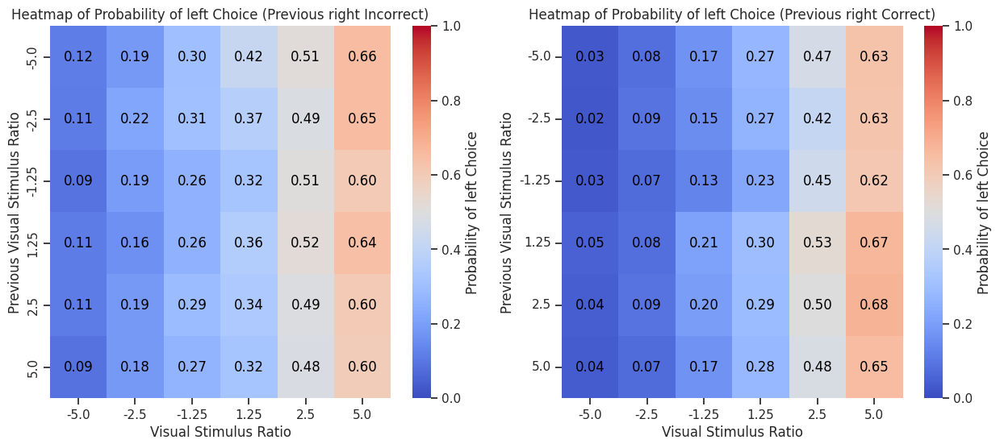

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
for i in df_test_visual[(df_test_visual['previous_port_before_stimulus'] == 'right')].groupby('previous_correct_numeric'):
    df_preright = i[1]
    df_preright['visual_stimulus_ratio'] = df_preright['visual_stimulus_ratio'].apply(lambda x: round(x, 2))
    for mouse in df_preright['subject'].unique():
        for session in df_preright[df_preright.subject == mouse]['session'].unique():
            df_mouse_session = df_preright[np.logical_and(df_preright['subject'] == mouse, df_preright['session'] == session)]
            df_mouse_session['previous_visual_stimulus_ratio'] = df_mouse_session['visual_stimulus_ratio'].shift(1, fill_value=np.nan)
            df_preright.loc[df_mouse_session.index, 'previous_visual_stimulus_ratio'] = df_mouse_session['previous_visual_stimulus_ratio']
    pivot_table = df_preright.pivot_table(
        index='previous_visual_stimulus_ratio',
        columns='visual_stimulus_ratio',
        values='first_choice_numeric',
        aggfunc='mean',
        observed=True
    )
    # plot the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Probability of left Choice'}, vmin=0, vmax=1, annot_kws={"color": "black"}, ax=axes[i[0]])
    axes[i[0]].set_xlabel("Visual Stimulus Ratio")
    axes[i[0]].set_ylabel("Previous Visual Stimulus Ratio")
    axes[i[0]].set_title("Heatmap of Probability of left Choice (Previous right {})".format('Correct' if i[0] == 1 else 'Incorrect'))
# rotate the y-axis labels
plt.yticks(rotation=0)
plt.show()

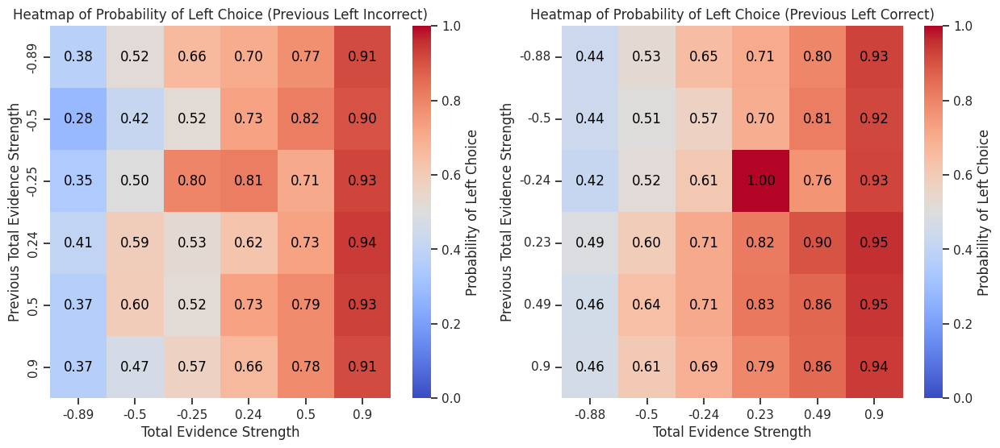

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
for i in df_test_auditory[(df_test_auditory['previous_port_before_stimulus'] == 'left')].groupby('previous_correct_numeric'):
    df_preleft = i[1]
    bins=6
    bin_groups = pd.cut(df_preleft['total_evidence_strength'], bins=bins)
    labels = df_preleft['total_evidence_strength'].groupby(bin_groups).mean()
    df_preleft['total_evidence_strength_binned'] = pd.cut(df_preleft['total_evidence_strength'], bins=bins, labels=labels).astype(float)
    df_preleft['total_evidence_strength_binned'] = df_preleft['total_evidence_strength_binned'].apply(lambda x: round(x, 2))
    for mouse in df_preleft['subject'].unique():
        for session in df_preleft[df_preleft.subject == mouse]['session'].unique():
            df_mouse_session = df_preleft[np.logical_and(df_preleft['subject'] == mouse, df_preleft['session'] == session)]
            df_mouse_session['previous_total_evidence_strength_binned'] = df_mouse_session['total_evidence_strength_binned'].shift(1, fill_value=np.nan)
            df_preleft.loc[df_mouse_session.index, 'previous_total_evidence_strength_binned'] = df_mouse_session['previous_total_evidence_strength_binned']
    pivot_table = df_preleft.pivot_table(
        index='previous_total_evidence_strength_binned',
        columns='total_evidence_strength_binned',
        values='first_choice_numeric',
        aggfunc='mean',
        observed=True
    )
    # plot the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Probability of Left Choice'}, vmin=0, vmax=1, annot_kws={"color": "black"}, ax=axes[i[0]])
    axes[i[0]].set_xlabel("Total Evidence Strength")
    axes[i[0]].set_ylabel("Previous Total Evidence Strength")
    axes[i[0]].set_title("Heatmap of Probability of Left Choice (Previous Left {})".format('Correct' if i[0] == 1 else 'Incorrect'))
# rotate the y-axis labels
plt.yticks(rotation=0)
plt.show()

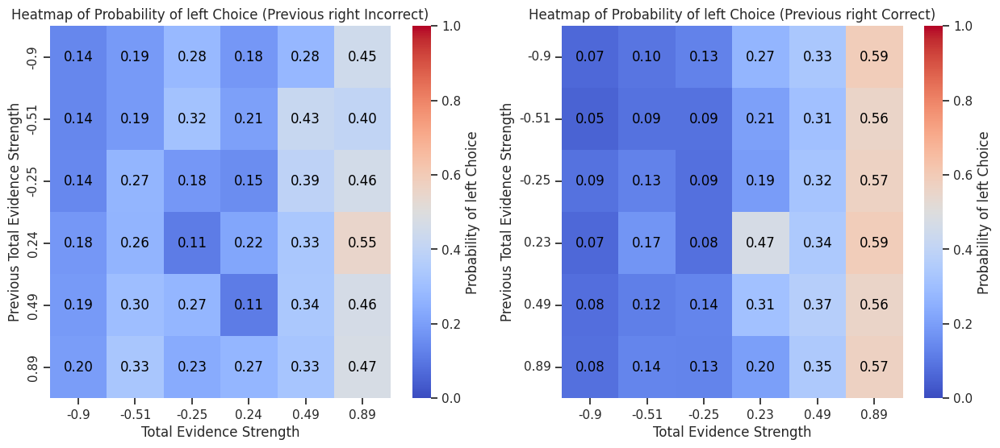

In [58]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
for i in df_test_auditory[(df_test_auditory['previous_port_before_stimulus'] == 'right')].groupby('previous_correct_numeric'):
    df_preright = i[1]
    bins=6
    bin_groups = pd.cut(df_preright['total_evidence_strength'], bins=bins)
    labels = df_preright['total_evidence_strength'].groupby(bin_groups).mean()
    df_preright['total_evidence_strength_binned'] = pd.cut(df_preright['total_evidence_strength'], bins=bins, labels=labels).astype(float)
    df_preright['total_evidence_strength_binned'] = df_preright['total_evidence_strength_binned'].apply(lambda x: round(x, 2))
    for mouse in df_preright['subject'].unique():
        for session in df_preright[df_preright.subject == mouse]['session'].unique():
            df_mouse_session = df_preright[np.logical_and(df_preright['subject'] == mouse, df_preright['session'] == session)]
            df_mouse_session['previous_total_evidence_strength_binned'] = df_mouse_session['total_evidence_strength_binned'].shift(1, fill_value=np.nan)
            df_preright.loc[df_mouse_session.index, 'previous_total_evidence_strength_binned'] = df_mouse_session['previous_total_evidence_strength_binned']
    pivot_table = df_preright.pivot_table(
        index='previous_total_evidence_strength_binned',
        columns='total_evidence_strength_binned',
        values='first_choice_numeric',
        aggfunc='mean',
        observed=True
    )
    # plot the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Probability of left Choice'}, vmin=0, vmax=1, annot_kws={"color": "black"}, ax=axes[i[0]])
    axes[i[0]].set_xlabel("Total Evidence Strength")
    axes[i[0]].set_ylabel("Previous Total Evidence Strength")
    axes[i[0]].set_title("Heatmap of Probability of left Choice (Previous right {})".format('Correct' if i[0] == 1 else 'Incorrect'))
# rotate the y-axis labels
plt.yticks(rotation=0)
plt.show()

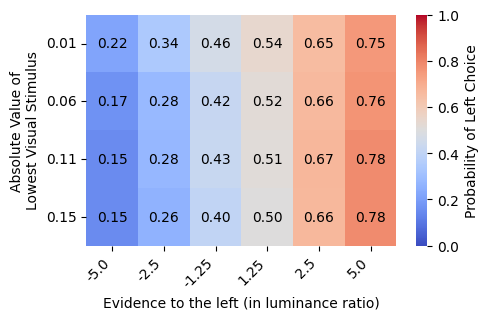

In [ ]:
# let's use the absolute value of the lowest visual stimulus as a proxy for the brightness of the visual stimulus
df_test_visual['visual_stimulus_lowest'] = df_test_visual['visual_stimulus'].apply(lambda x: abs(eval(x)[0]) if eval(x)[0] < eval(x)[1] else abs(eval(x)[1]))
# visual stimulus ratio to only two decimal places
df_test_visual['visual_stimulus_ratio'] = df_test_visual['visual_stimulus_ratio'].apply(lambda x: round(x, 2))
# create 10 bins for the absolute value of the lowest visual stimulus
min_value = df_test_visual['visual_stimulus_lowest'].min()
max_value = df_test_visual['visual_stimulus_lowest'].max()
bins = np.linspace(min_value, max_value, 5)
df_test_visual['visual_stimulus_lowest_binned'] = pd.cut(df_test_visual['visual_stimulus_lowest'], bins=bins, labels=[f"{b:.2f}" for b in bins[:-1]])
# create a pivot table with the visual stimulus ratio and absolute value of the lowest visual stimulus
pivot_table_abs = df_test_visual.pivot_table(
    index='visual_stimulus_lowest_binned',
    columns='visual_stimulus_ratio',
    values='first_choice_numeric',
    aggfunc='mean',
    observed=True
)
# plot the heatmap
plt.figure(figsize=(5, 3))
sns.heatmap(pivot_table_abs, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Probability of Left Choice'}, vmin=0, vmax=1, annot_kws={"color": "black"})
plt.xlabel("Evidence to the left (in luminance ratio)")
plt.ylabel("Absolute Value of\nLowest Visual Stimulus")
# plt.title("Heatmap of Probability of Left Choice")
# rotate the y-axis labels
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
# save in Desktop
# plt.savefig('/home/hmv/lab/heatmap_visual_stimulus.pdf', bbox_inches='tight')
plt.show()

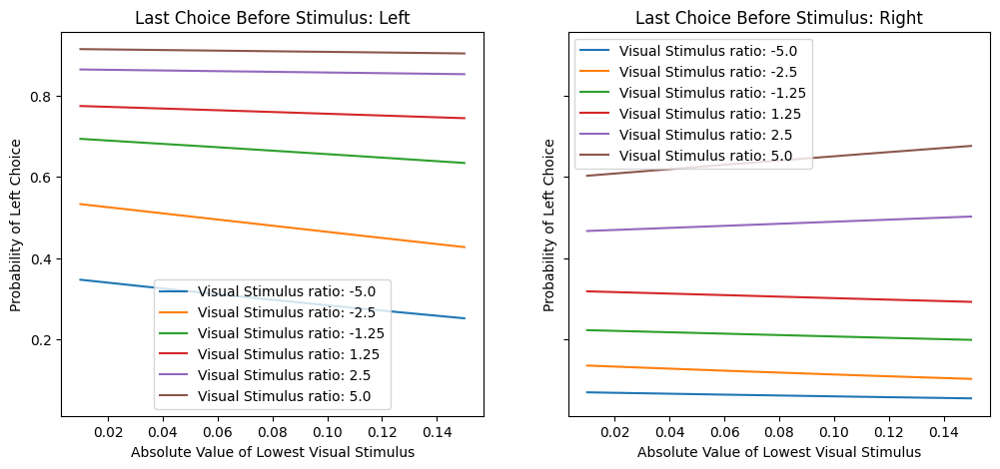

In [ ]:
# transform visual_stimulus_lowest_binned to a numeric value for plotting
df_test_visual['visual_stimulus_lowest_binned_num'] = pd.to_numeric(df_test_visual['visual_stimulus_lowest_binned'], errors='coerce')

# make two plots, one for when the animals comes from the left and one for when it comes from the right
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
# Plot for when the animal comes from the left
for ax, side in zip(axs.ravel(), ['left', 'right']):
    df_side = df_test_visual[df_test_visual['previous_port_before_stimulus'] == side]
    for i in df_side.groupby('visual_stimulus_ratio'):
        df_i = i[1].sort_values(by='visual_stimulus_lowest_binned_num')
        # drop nan
        df_i = df_i.dropna(subset=['visual_stimulus_lowest_binned_num'])
        X = df_i['visual_stimulus_lowest_binned_num'].values.reshape(-1, 1)
        y = df_i['first_choice_numeric'].values.astype(int)
        model = LogisticRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        y_prob = model.predict_proba(X)[:, 1]
        ax.plot(X, y_prob, label=f"Visual Stimulus ratio: {i[0]}")
    ax.set_xlabel("Absolute Value of Lowest Visual Stimulus")
    ax.set_ylabel("Probability of Left Choice")
    ax.legend()
    ax.set_title(f"Last Choice Before Stimulus: {side.capitalize()}")
plt.show()

# compare the model

## compare stimulus kernel model and action kernel model

In [ ]:
# divide dataset
X 

## find the optimal parameters of time kernel

In [236]:
comb_dict = utils.verify_params_time_kernel(dic = df_dic_hard_vis, y='first_choice_numeric')
sorted_items = sorted(comb_dict.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items[:5]

Optimization terminated successfully.
         Current function value: 0.674721
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.640473
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654600
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.593221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652601
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.581491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669395
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.586728
  

[((1, 1), np.float64(0.6696054821196092)),
 ((1, 4), np.float64(0.6696054821196092)),
 ((1, 5), np.float64(0.6696054821196091)),
 ((1, 6), np.float64(0.6696054821196091)),
 ((1, 7), np.float64(0.6696054821196091))]

In [245]:
comb_dict_vis_correct = utils.verify_params_time_kernel(dic = df_dic_hard_vis, y='correct_numeric', max_lag_range=range(1,100), tau_range=range(1,2))
sorted_items_vis_correct = sorted(comb_dict_vis_correct.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items_vis_correct[:5]

Optimization terminated successfully.
         Current function value: 0.650753
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.635711
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.650753
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.614303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667721
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.597374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639314
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.580070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630596
  

[((28, 1), np.float64(0.09396251828033034)),
 ((27, 1), np.float64(0.09384973101015157)),
 ((26, 1), np.float64(0.09381889076940803)),
 ((29, 1), np.float64(0.09371278713157269)),
 ((30, 1), np.float64(0.09350662222848524))]

In [237]:
comb_dict = utils.verify_params_time_kernel(dic = df_dic_hard_aud, y='first_choice_numeric')
sorted_items = sorted(comb_dict.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items[:5]

Optimization terminated successfully.
         Current function value: 0.667147
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677769
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.662403
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.657293
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.670904
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.632293
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.668709
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.663507
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.617549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676244
  

[((1, 1), np.float64(0.4912211182840647)),
 ((1, 3), np.float64(0.4912211182840647)),
 ((1, 4), np.float64(0.4912211182840647)),
 ((1, 5), np.float64(0.4912211182840647)),
 ((1, 6), np.float64(0.4912211182840647))]

In [246]:
comb_dict_aud_correct = utils.verify_params_time_kernel(dic = df_dic_hard_aud, y='correct_numeric', max_lag_range=range(1,100), tau_range=range(1,2))
sorted_items_aud_correct = sorted(comb_dict_aud_correct.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items_aud_correct[:5]

Optimization terminated successfully.
         Current function value: 0.686810
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.460174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581834
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.530288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566422
  

[((96, 1), np.float64(0.13394129509700112)),
 ((99, 1), np.float64(0.13390445384288524)),
 ((94, 1), np.float64(0.1338912598589828)),
 ((95, 1), np.float64(0.13388465549950532)),
 ((97, 1), np.float64(0.13388368377952076))]

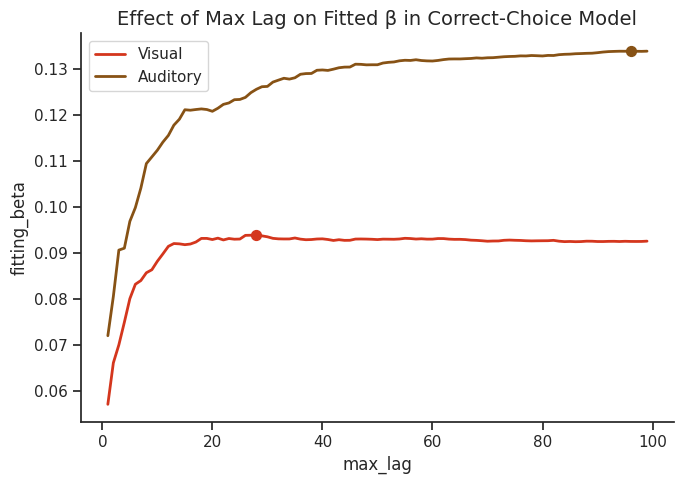

In [284]:
x_vis, y_vis = zip(*sorted(comb_dict_vis_correct.items()))
x_aud, y_aud = zip(*sorted(comb_dict_aud_correct.items()))

x_peak_vis = max(comb_dict_vis_correct, key=comb_dict_vis_correct.get)
y_peak_vis = comb_dict_vis_correct[x_peak_vis]

x_peak_aud = max(comb_dict_aud_correct, key=comb_dict_aud_correct.get)
y_peak_aud = comb_dict_aud_correct[x_peak_aud]

plt.figure(figsize=(7,5))
plt.plot([x[0] for x in x_vis], y_vis, color="#D4361D", label='Visual', linewidth=2)
plt.scatter(x_peak_vis[0], y_peak_vis, color='#D4361D', s=50, zorder=3)

plt.plot([x[0] for x in x_aud], y_aud, color="#875215", label='Auditory', linewidth=2)
plt.scatter(x_peak_aud[0], y_peak_aud, color='#875215', s=50, zorder=3)

plt.xlabel('max_lag', fontsize=12)
plt.ylabel('fitting_beta', fontsize=12)
plt.title('Effect of Max Lag on Fitted β in Correct-Choice Model', fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
max_lag_vis_correct = x_peak_vis[0]
max_lag_aud_correct = x_peak_aud[0]

df_test_visual = pd.DataFrame()
for mouse in df_dic_hard_vis:
    df_dic_hard_vis[mouse] = dft.get_time_kernel_impact(df_dic_hard_vis[mouse], y='correct_numeric', max_lag=max_lag_vis_correct, tau=1)
    df_test_visual = pd.concat([df_test_visual, df_dic_hard_vis[mouse]], ignore_index=True)

df_test_auditory = pd.DataFrame()
for mouse in df_dic_hard_aud:
    df_dic_hard_aud[mouse] = dft.get_time_kernel_impact(df_dic_hard_aud[mouse], y='correct_numeric', max_lag=max_lag_aud_correct, tau=1)
    df_test_auditory = pd.concat([df_test_auditory, df_dic_hard_aud[mouse]], ignore_index=True)

## get performance

In [ ]:
df_test_visual = pd.DataFrame()
df_test_auditory = pd.DataFrame()
for mouse in df_dic_vis:
    for session in df_dic_vis[mouse]['session'].unique():
        df_mouse_session = df_dic_vis[mouse][df_dic_vis[mouse]['session'] == session]
        df_mouse_session = dft.get_performance_through_trials(df_mouse_session)
        df_dic_vis[mouse].loc[df_mouse_session.index, 'performance_w'] = df_mouse_session['performance_w'].values
    df_test_visual = pd.concat([df_test_visual, df_dic_vis[mouse]], ignore_index=True)
for mouse in df_dic_aud:
    for session in df_dic_aud[mouse]['session'].unique():
        df_mouse_session = df_dic_aud[mouse][df_dic_aud[mouse]['session'] == session]
        df_mouse_session = dft.get_performance_through_trials(df_mouse_session)
        df_dic_aud[mouse].loc[df_mouse_session.index, 'performance_w'] = df_mouse_session['performance_w'].values
    df_test_auditory = pd.concat([df_test_auditory, df_dic_aud[mouse]], ignore_index=True)

In [138]:
df_test_visual_multi = pd.DataFrame()
df_test_auditory_multi = pd.DataFrame()
for mouse in df_dic_hard_multi_vis:
    for session in df_dic_hard_multi_vis[mouse]['session'].unique():
        df_mouse_session = df_dic_hard_multi_vis[mouse][df_dic_hard_multi_vis[mouse]['session'] == session]
        df_mouse_session = dft.get_performance_through_trials(df_mouse_session)
        df_dic_hard_multi_vis[mouse].loc[df_mouse_session.index, 'performance_w'] = df_mouse_session['performance_w'].values
    df_test_visual_multi = pd.concat([df_test_visual_multi, df_dic_hard_multi_vis[mouse]], ignore_index=True)
for mouse in df_dic_hard_multi_aud:
    for session in df_dic_hard_multi_aud[mouse]['session'].unique():
        df_mouse_session = df_dic_hard_multi_aud[mouse][df_dic_hard_multi_aud[mouse]['session'] == session]
        df_mouse_session = dft.get_performance_through_trials(df_mouse_session)
        df_dic_hard_multi_aud[mouse].loc[df_mouse_session.index, 'performance_w'] = df_mouse_session['performance_w'].values
    df_test_auditory_multi = pd.concat([df_test_auditory_multi, df_dic_hard_multi_aud[mouse]], ignore_index=True)

In [156]:
colors = sns.color_palette("viridis", 10)

In [ ]:
for n, mouse in enumerate(df_dic_hard_multi_vis):
    for session in df_dic_hard_multi_vis[mouse]['session'].unique():
        df_mouse_session = df_dic_hard_multi_vis[mouse][df_dic_hard_multi_vis[mouse]['session'] == session]
        # df_mouse_session.groupby('difficulty')['performance_w'].mean().plot.scatter(color=colors[n], alpha=0.3)
        plt.scatter(df_mouse_session['difficulty'], df_mouse_session['performance_w'], color=colors[n], alpha=0.3, label=mouse if session == df_dic_hard_multi_vis[mouse]['session'].unique()[0] else None)

TypeError: PlotAccessor.scatter() missing 2 required positional arguments: 'x' and 'y'

In [152]:
colors = sns.color_palette("inferno", 10)

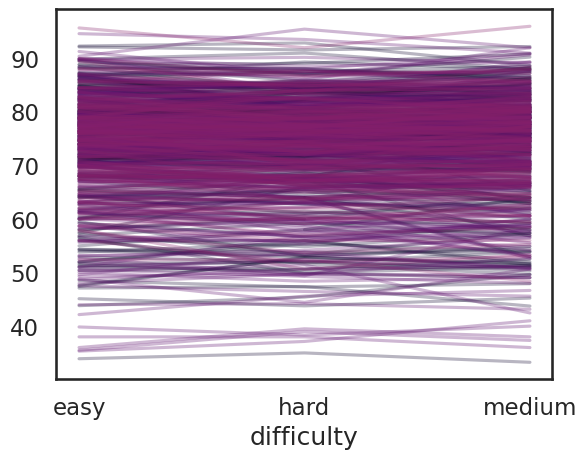

In [155]:
for n, mouse in enumerate(df_dic_hard_multi_aud):
    for session in df_dic_hard_multi_aud[mouse]['session'].unique():
        df_mouse_session = df_dic_hard_multi_aud[mouse][df_dic_hard_multi_aud[mouse]['session'] == session]
        df_mouse_session.groupby('difficulty')['performance_w'].mean().plot(color=colors[n], alpha=0.3)


In [141]:
print(df_test_visual_multi.groupby('difficulty')['performance_w'].mean())
print(df_test_auditory_multi.groupby('difficulty')['performance_w'].mean())

difficulty
easy      68.800509
hard      67.398746
medium    68.009602
Name: performance_w, dtype: float64
difficulty
easy      74.039744
hard      72.947191
medium    73.757687
Name: performance_w, dtype: float64


<Axes: xlabel='difficulty'>

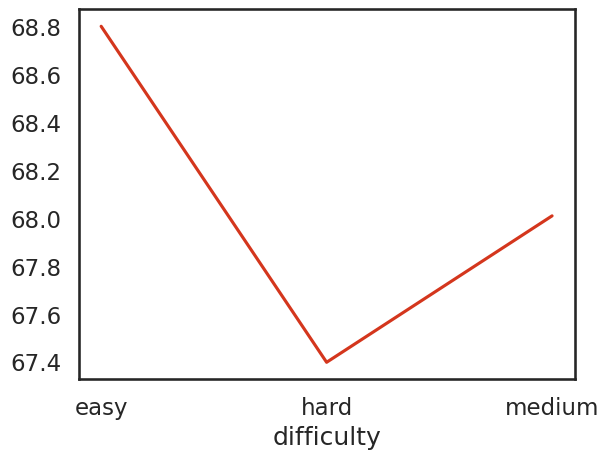

In [145]:
df_test_visual_multi.groupby('difficulty')['performance_w'].mean().plot(color="#D4361D")

In [142]:
plt.scatter(df_test_visual_multi.groupby('difficulty')['performance_w'].mean())

TypeError: scatter() missing 1 required positional argument: 'y'

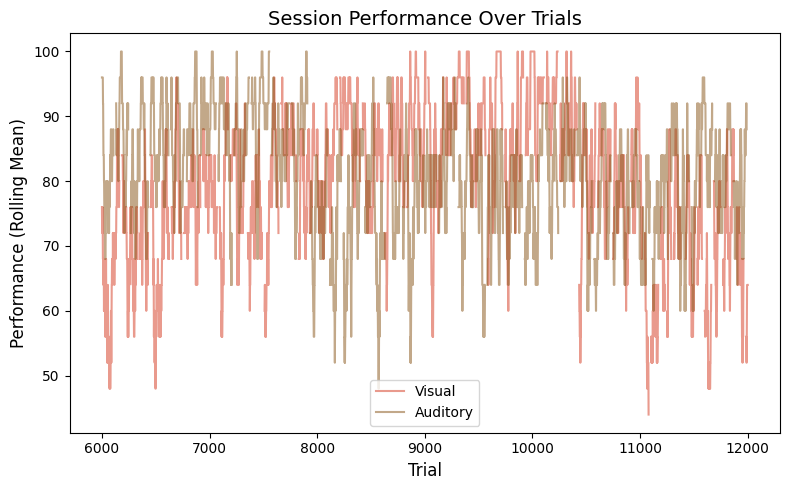

In [25]:
plt.figure(figsize=(8, 5))
zoomin_index = slice(6000, 12000)
plt.plot(df_test_visual['performance_w'].loc[zoomin_index], label='Visual', color='#D4361D', alpha=0.5)
plt.plot(df_test_auditory['performance_w'].loc[zoomin_index], label='Auditory', color='#875215', alpha=0.5)
plt.xlabel('Trial', fontsize=12)
plt.ylabel('Performance (Rolling Mean)', fontsize=12)
plt.title('Session Performance Over Trials', fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()

## HMM

### choice(0/1) as observation

In [75]:
sns.set_style("white")
sns.set_context("talk")

color_names = [
    "windows blue",
    "amber",
    "red",
    "faded green",
    "dusty purple",
    "orange"
    ]

colors = sns.xkcd_palette(color_names)
cmap = gradient_cmap(colors)

In [27]:
# some animals only have one of the states
def make_full_perm(sorted_state, K): 
    used = list(sorted_state.astype(int))
    missing = [k for k in range(K) if k not in used]
    return np.array(used + missing, dtype=int)


In [ ]:
num_states = 2

### single session simple HMM

In [47]:
def fit_best_hmm(obs, K, D, n_restarts=20, num_em_iters=100, observations="gaussian"):
    best_hmm, best_ll = None, -np.inf

    for r in range(n_restarts):
        hmm = ssm.HMM(K, D, observations=observations)
        hmm.fit(obs, method="em", num_em_iters=num_em_iters)
        ll = hmm.log_probability(obs)
        if ll > best_ll:
            best_ll = ll
            best_hmm = hmm
    return best_hmm, best_ll


#### bernoulli observation

LP: -191.5: 100%|██████████| 100/100 [00:00<00:00, 472.99it/s]


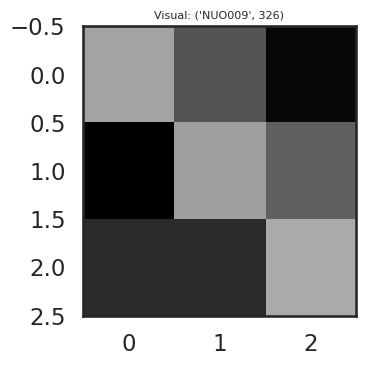

In [73]:
vis_session = 326
num_em_iters = 100
K = 3     # states number
D = 1      # each observation is 2-dimensional (correctness 0/1
mouse = 'NUO009'
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
df_mouse_session = df_dic_vis[mouse][df_dic_vis[mouse]['session'] == vis_session]
obs_vis = df_mouse_session['first_choice_numeric'].to_numpy().astype(int).reshape(-1, 1)
# fit HMM with multiple restarts to avoid local minima
hmm_vis, hmm_lls_vis = fit_best_hmm(obs_vis, K, D, num_em_iters=num_em_iters, observations="bernoulli")
hmm_z_vis_unorder = hmm_vis.most_likely_states(obs_vis)
# order by mean performance of each state
sorted_state = df_mouse_session.groupby(hmm_z_vis_unorder)['performance_w'].mean().sort_values().index.to_numpy()
hmm_vis.permute(sorted_state)
hmm_z_vis = hmm_vis.most_likely_states(obs_vis)
df_mouse_session['hmm_states'] = hmm_z_vis

transition_mat_vis = hmm_vis.transitions.transition_matrix
im = ax.imshow(transition_mat_vis, vmin=0, vmax=1, aspect="auto", cmap="gray")
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)

plt.tight_layout()
plt.show()

Text(0.5, 0, 'Trial')

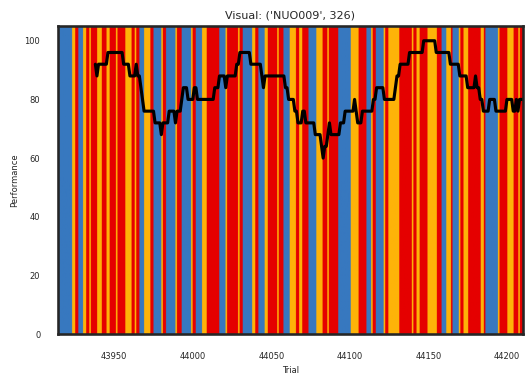

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))    
lim_vis = 1.05 * df_mouse_session['performance_w'].max()
ax.imshow(
    df_mouse_session['hmm_states'].to_numpy()[None, :],
    aspect="auto",
    cmap=cmap,
    vmin=0,
    vmax=len(colors) - 1,
    extent=[df_mouse_session.index.min(), df_mouse_session.index.max(), 0, lim_vis]
)
ax.plot(df_mouse_session['performance_w'], '-k')
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.set_ylabel('Performance', fontsize=6)
ax.set_xlabel('Trial', fontsize=6)

### input-driven HMM 

In [287]:
vis_session = df_dic_vis[mouse]['session'].unique()[-5:]
# vis_session = [326]
mouse = 'NUO009'
df_mouse_session = df_dic_vis[mouse][df_dic_vis[mouse]['session'].isin(vis_session)]
df_mouse_session = dft.calculate_time_between_trials_and_reaction_time(df_mouse_session)
df_mouse_session = df_mouse_session.dropna(subset=['reaction_time', 'previous_correct_numeric', 'visual_stimulus_diff'])
# Now create a new HMM and fit it to the data with EM
N_iters = 100
num_states = 2    # number of discrete states
obs_dim = 1    # data dimension
input_dim = 3    # input dimension
num_categories = 2    # number of output types/categories
hmm_vis = ssm.HMM(num_states, obs_dim, input_dim, 
          observations="bernoulli", 
          transitions="inputdriven")
obs_vis = df_mouse_session['first_choice_numeric'].to_numpy().astype(int).reshape(-1, 1)
inpt_vis = np.column_stack([
    df_mouse_session['visual_stimulus_diff'].to_list(),
    df_mouse_session['reaction_time'].to_list(),
    df_mouse_session['previous_correct_numeric'].to_list()
    ])
# Fit
hmm_vis_lps = hmm_vis.fit(obs_vis, input=inpt_vis, method="em", num_iters=N_iters)

LP: -846.2: 100%|██████████| 100/100 [00:02<00:00, 45.59it/s]


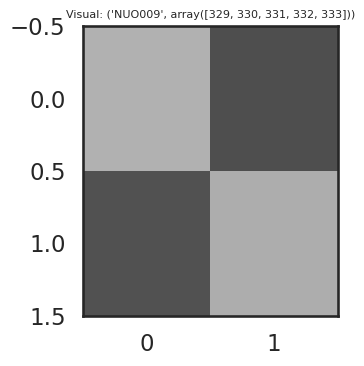

In [288]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
hmm_z_vis_unorder = hmm_vis.most_likely_states(obs_vis, input=inpt_vis)
# order by mean performance of each state
sorted_state = df_mouse_session.groupby(hmm_z_vis_unorder)['performance_w'].mean().sort_values().index.to_numpy()
hmm_vis.permute(sorted_state)
hmm_z_vis = hmm_vis.most_likely_states(obs_vis, input=inpt_vis)

transition_mat_vis = hmm_vis.transitions.transition_matrix
im = ax.imshow(transition_mat_vis, vmin=0, vmax=1, aspect="auto", cmap="gray")
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)

plt.tight_layout()
plt.show()

In [294]:
Ez, _, _ = hmm_vis.expected_states(obs_vis, input=inpt_vis)
z_soft = np.full(len(Ez), -1)  # -1 = uncertain
z_soft[Ez[:,0] > 0.8] = 0
z_soft[Ez[:,1] > 0.8] = 1

Text(0.5, 0, 'Trial')

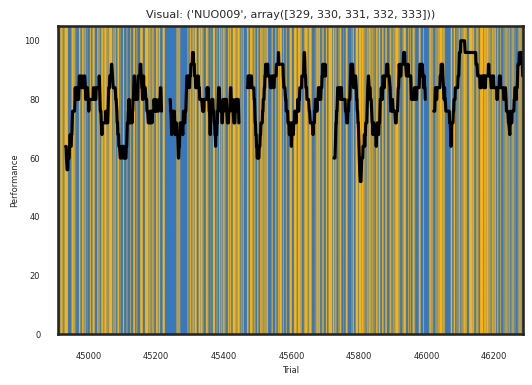

In [295]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))    
lim_vis = 1.05 * df_mouse_session['performance_w'].max()

ax.imshow(
    z_soft[None, :],
    aspect="auto",
    cmap=cmap,
    vmin=0,
    vmax=len(colors) - 1,
    extent=[df_mouse_session.index.min(), df_mouse_session.index.max(), 0, lim_vis]
)
ax.plot(df_mouse_session['performance_w'], '-k')
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.set_ylabel('Performance', fontsize=6)
ax.set_xlabel('Trial', fontsize=6)

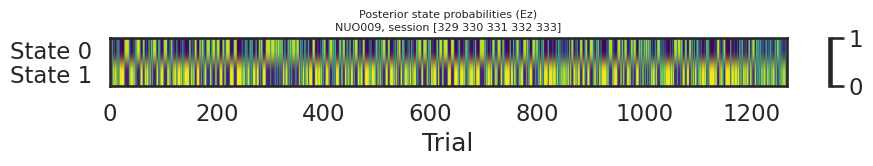

In [291]:
fig, ax = plt.subplots(1, 1, figsize=(10, 2))

im = ax.imshow(
    Ez.T,  
    aspect="auto",
    cmap="viridis", 
    vmin=0,
    vmax=1
)

ax.set_yticks(range(Ez.shape[1]))
ax.set_yticklabels([f"State {k}" for k in range(Ez.shape[1])])
ax.set_xlabel("Trial")
ax.set_title(f"Posterior state probabilities (Ez)\n{mouse}, session {vis_session}", fontsize=8)

cbar = plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.show()


### input-driven HMM more sessions

In [220]:
vis_session = 326
mouse = 'NUO009'
df_mouse_session = df_dic_vis[mouse][df_dic_vis[mouse]['session'].isin(df_dic_vis[mouse]['session'].unique()[:10])]
df_mouse_session = dft.calculate_time_between_trials_and_reaction_time(df_mouse_session)
df_mouse_session = df_mouse_session.dropna(subset=['reaction_time', 'previous_correct_numeric', 'visual_stimulus_diff'])
# Now create a new HMM and fit it to the data with EM
N_iters = 100
num_states = 2    # number of discrete states
obs_dim = 1    # data dimension
input_dim = 3    # input dimension
num_categories = 2    # number of output types/categories
hmm_vis = ssm.HMM(num_states, obs_dim, input_dim, 
          observations="bernoulli", 
          transitions="inputdriven")
obs_vis = df_mouse_session['first_choice_numeric'].to_numpy().astype(int).reshape(-1, 1)
inpt_vis = np.column_stack([
    df_mouse_session['visual_stimulus_diff'].to_list(),
    df_mouse_session['reaction_time'].to_list(),
    df_mouse_session['previous_correct_numeric'].to_list()
    ])
# Fit
hmm_vis_lps = hmm_vis.fit(obs_vis, input=inpt_vis, method="em", num_iters=N_iters)

LP: -193.4: 100%|██████████| 100/100 [00:00<00:00, 189.95it/s]


#### gaussian observation

LP: -215.0:   0%|          | 0/100 [00:00<?, ?it/s]

LP: 2270.2: 100%|██████████| 100/100 [00:00<00:00, 154.31it/s]


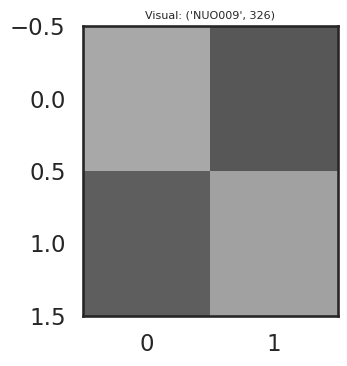

In [ ]:
vis_session = 326
aud_session = 290
num_em_iters = 100
K = 2     # states number
D = 1      # each observation is 2-dimensional (correctness 0/1
mouse = 'NUO009'
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
df_mouse_session = df_dic_vis[mouse][df_dic_vis[mouse]['session'] == vis_session]
# df_mouse_session = dft.calculate_time_between_trials_and_reaction_time(df_mouse_session)
# df_mouse_session = df_mouse_session.dropna(subset=['reaction_time'])
obs_vis = np.column_stack([
    df_mouse_session['first_choice_numeric'].to_list()
    ])
# # normalize the observations, or the HMM will just use the reaction time to separate states
# obs_vis = (obs_vis - obs_vis.mean(axis=0)) / obs_vis.std(axis=0)
# fit HMM with multiple restarts to avoid local minima
hmm_vis, hmm_lls_vis = fit_best_hmm(obs_vis, K, D, num_em_iters=num_em_iters)
hmm_z_vis_unorder = hmm_vis.most_likely_states(obs_vis)
# order by mean performance of each state
sorted_state = df_mouse_session.groupby(hmm_z_vis_unorder)['performance_w'].mean().sort_values().index.to_numpy()
hmm_vis.permute(sorted_state)
hmm_z_vis = hmm_vis.most_likely_states(obs_vis)
df_mouse_session['hmm_states'] = hmm_z_vis

transition_mat_vis = hmm_vis.transitions.transition_matrix
im = ax.imshow(transition_mat_vis, vmin=0, vmax=1, aspect="auto", cmap="gray")
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)


# df_mouse_session = df_dic_aud[mouse][df_dic_aud[mouse]['session'] == aud_session]
# df_mouse_session = dft.calculate_time_between_trials_and_reaction_time(df_mouse_session)
# df_mouse_session = df_mouse_session.dropna(subset=['reaction_time'])
# obs_aud = np.column_stack([
#     df_mouse_session['first_choice_numeric'].to_list(),
#     # df_mouse_session['reaction_time'].to_list(),
#     ])
# # normalize the observations, or the HMM will just use the reaction time to separate states
# obs_aud = (obs_aud - obs_aud.mean(axis=0)) / obs_aud.std(axis=0)
# # fit HMM with multiple restarts to avoid local minima
# hmm_aud, hmm_lls_aud = fit_best_hmm(obs_aud, K, D, num_em_iters=num_em_iters)
# hmm_z_aud_unorder = hmm_aud.most_likely_states(obs_aud)
# # order by mean performance of each state
# sorted_state = df_mouse_session.groupby(hmm_z_aud_unorder)['performance_w'].mean().sort_values().index.to_numpy()
# hmm_aud.permute(sorted_state)
# hmm_z_aud = hmm_aud.most_likely_states(obs_aud)
# df_mouse_session['hmm_states'] = hmm_z_aud 
# transition_mat_aud = hmm_aud.transitions.transition_matrix
# im = ax[1].imshow(transition_mat_aud, vmin=0, vmax=1, aspect="auto", cmap="gray")
# ax[1].set_title(f'Auditory: {mouse, aud_session}', fontsize=8)
plt.tight_layout()
plt.show()

Text(0.5, 0, 'Trial')

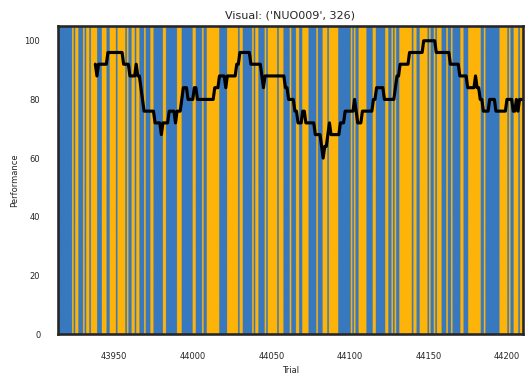

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))    
lim_vis = 1.05 * df_mouse_session['performance_w'].max()
ax.imshow(
    df_mouse_session['hmm_states'].to_numpy()[None, :],
    aspect="auto",
    cmap=cmap,
    vmin=0,
    vmax=len(colors) - 1,
    extent=[df_mouse_session.index.min(), df_mouse_session.index.max(), 0, lim_vis]
)
ax.plot(df_mouse_session['performance_w'], '-k')
ax.set_title(f'Visual: {mouse, vis_session}', fontsize=8)
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.set_ylabel('Performance', fontsize=6)
ax.set_xlabel('Trial', fontsize=6)

### GLM-HMM

In [13]:
sns.set_style("white")
sns.set_context("talk")

color_names = [
    "windows blue",
    "amber",
    "red",
    "faded green",
    "dusty purple",
    "orange"
    ]

colors = sns.xkcd_palette(color_names)
cmap = gradient_cmap(colors)

In [14]:
def fit_best_glmhmm(obs, 
                    inputs,
                    num_states = 3,        # number of discrete states
                    obs_dim = 1,           # number of observed dimensions
                    num_categories = 2,    # number of categories for output
                    input_dim = 2,         # input dimensions 
                    n_restarts = 10,        # number of EM iterations
                    N_iters = 100,         # number of EM iterations
                    prior_sigma=2,
                    prior_alpha=2,
                    kappa=1
                    ):
    
    best_hmm, best_ll = None, -np.inf

    for r in range(n_restarts):
        map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
             observation_kwargs=dict(C=num_categories,prior_sigma=prior_sigma),
             transitions="sticky", 
             transition_kwargs=dict(alpha=prior_alpha,kappa=kappa),
             )
        hmm_lls = map_glmhmm.fit(obs, inputs=inputs, method="em", num_iters=N_iters, tolerance=10**-4)
        ll = map_glmhmm.log_probability(obs, inputs=inputs)
        if ll > best_ll:
            best_ll = ll
            best_hmm = map_glmhmm
            best_hmm_lls = hmm_lls
    return best_hmm, best_ll, best_hmm_lls

In [15]:
def fit_glmhmm(obs, 
                inputs,
                num_states = 3,        # number of discrete states
                obs_dim = 1,           # number of observed dimensions
                num_categories = 2,    # number of categories for output
                input_dim = 2,         # input dimensions 
                N_iters = 100,         # number of EM iterations
                prior_sigma=2,
                prior_alpha=2,
                kappa=1
                ):
    
    map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
            observation_kwargs=dict(C=num_categories,prior_sigma=prior_sigma),
            transitions="sticky", 
            transition_kwargs=dict(alpha=prior_alpha,kappa=kappa),
            )
    hmm_lls = map_glmhmm.fit(obs, inputs=inputs, method="em", num_iters=N_iters, tolerance=10**-4)
    ll = map_glmhmm.log_probability(obs, inputs=inputs)
    return map_glmhmm, ll, hmm_lls

In [24]:
def build_glmhmm_inputs_by_session(
    df: pd.DataFrame,
    y_col="first_choice_numeric",
    stim_col=["visual_stimulus_ratio"],
):
    """
    Returns:
        datas: list of (T_i, 1)
        inpts: list of (T_i, M)
    """
    datas, inpts = [], []

    stim_col = [c for c in stim_col if c != "bias"]

    for sess, df_sess in df.groupby('session'):
        df_sess = df_sess[stim_col + [y_col]].dropna()

        y = df_sess[y_col].to_numpy(dtype=int).reshape(-1, 1)
        X = df_sess[stim_col].to_numpy(dtype=float)

        if "bias" in stim_col:
            X = np.column_stack([X, np.ones(len(X))])

        datas.append(y)
        inpts.append(X)

    return datas, inpts


In [17]:
def plot_transition_matrix(map_glmhmm, title="", ax=None, cmap="gray", fontsize=8):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    A = map_glmhmm.transitions.transition_matrix
    im = ax.imshow(A, vmin=0, vmax=1, aspect="auto", cmap=cmap)

    ax.set_title(title, fontsize=fontsize)
    ax.set_xlabel("State t")
    ax.set_ylabel("State t-1")

    K = A.shape[0]
    for i in range(K):
        for j in range(K):
            val = A[i, j]
            ax.text(j, i, f"{val:.2f}", ha="center", va="center",
                    color="black" if val > 0.5 else "white",
                    fontsize=fontsize)

    plt.tight_layout()
    return ax, im


In [18]:
def get_posterior_probs_concat(map_glmhmm, datas, inpts) -> np.ndarray:
    """Return posterior_probs_con with shape (N_total, K)."""
    post_prob_list = [map_glmhmm.expected_states(data=d, input=x)[0] for d, x in zip(datas, inpts)]
    return post_prob_list

def add_df_glmhmm_state(df: pd.DataFrame, post_prob_list: list[np.ndarray]):
    """MAP state per time point."""
    posterior_probs_con = np.concatenate(post_prob_list, axis=0)
    df['glmhmm_state'] = np.argmax(posterior_probs_con, axis=1)
    return df

In [19]:
def plot_posteriors_with_performance(df: pd.DataFrame, post_prob_list: list[np.ndarray], colors, ax=None, lw=2, perf_scale=0.01):
    posterior_probs_con = np.concatenate(post_prob_list, axis=0)
    K = posterior_probs_con.shape[1]
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(20, 2.5), dpi=80)

    for k in range(K):
        ax.plot(posterior_probs_con[:, k], label=f"State {k+1}", lw=lw, color=colors[k])

    ax.plot(np.asarray(df['performance_w']) * perf_scale, "-k", label="Performance", alpha=0.7)

    ax.set_ylim(-0.01, 1.01)
    ax.set_yticks([0, 0.5, 1])
    ax.set_xlabel("trial #")
    ax.set_ylabel("p(state)")
    ax.legend(frameon=False)
    return ax


In [20]:
def plot_param_by_state(hmm, df: pd.DataFrame, X, y, state_col="glmhmm_state", marker='o', linestyle='-', ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    df_param_states = pd.DataFrame([])
    for state in range(hmm.K):
        df_session_state = df[df[state_col] == state]
        df_session_state = dft.calculate_time_between_trials_and_reaction_time(df_session_state)
        if len(df_session_state) > 1:
            _, logit_model_multi = utils.logi_model_fit(df_session_state, 
                                    X=X,
                                    y=y,)
            df_param_states[state] = logit_model_multi.params
    df_param_states.drop('const', inplace=True)
    for state in df_param_states.columns:
        ax.plot(
            df_param_states.index,
            df_param_states[state],
            marker=marker,
            linestyle=linestyle,
            color=colors[state],
            label=f"State {state}"
        )

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_ylabel("Weights")
    ax.legend(title="State", frameon=False)
    return ax

In [21]:
def plot_psychometric_by_state(df, map_glmhmm, colors, x="visual_stimulus_ratio", y="first_choice_numeric", state_col="glmhmm_state", ax=None, valueType = "discrete", 
                               point_kwargs=None, line_kwargs=None, log = True):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8, 6))

    for state in range(map_glmhmm.K):
        df_s = df[df[state_col] == state].copy()
        if len(df_s) == 0:
            continue
        plots.psychometric_plot(
            df_s, x=x, y=y, ax=ax, valueType=valueType, log=log,
            point_kwargs={"color": colors[state], "label": "", **(point_kwargs or {})},
            line_kwargs={"color": colors[state], "label": {"state " + str(state)}, **(line_kwargs or {})}
        )
    ax.legend(frameon=False)
    return ax


In [16]:
for session in df_test_multi['session'].unique():
        df_mouse_session = df_test_multi[df_test_multi['session'] == session]
        df_mouse_session = dft.get_performance_through_trials(df_mouse_session)
        df_test_multi.loc[df_mouse_session.index, 'performance_w'] = df_mouse_session['performance_w'].values

In [17]:
df_test_multi['difficulty_numeric'] = df_test_multi['difficulty'].map({'easy': 3, 'medium': 2, 'hard': 1})
df_test_multi['difficulty_numeric'] = df_test_multi.apply(
            lambda row: row["difficulty_numeric"] if row['correct_side'] == 'left' else -row["difficulty_numeric"],
            axis=1
        )

In [96]:
sample_sessions = []
for session in df_test_multi['session'].unique():
    if (df_test_multi[df_test_multi['session'] == session]['performance_w'].mean()>80):
        sample_sessions.append(session)
    else:
        pass

In [ ]:
df_test_multi.dropna(subset=['difficulty_numeric', 'first_choice_numeric'], inplace=True)
df_test_multi_session = df_test_multi[df_test_multi['session'].isin(sample_sessions)]
datas, inpts = build_glmhmm_inputs_by_session(
    df_test_multi_session,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col=["difficulty_numeric"],
)
# Fit GLM-HMM with MAP estimation:
map_glmhmm, ll, hmm_lls = fit_glmhmm(datas, inpts, num_states=3, obs_dim=1, input_dim=2, kappa=15, prior_sigma=2)

LP: -788.0: 100%|██████████| 100/100 [00:23<00:00,  4.35it/s]


Optimization terminated successfully.
         Current function value: 0.126780
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.144789
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.136445
         Iterations 10


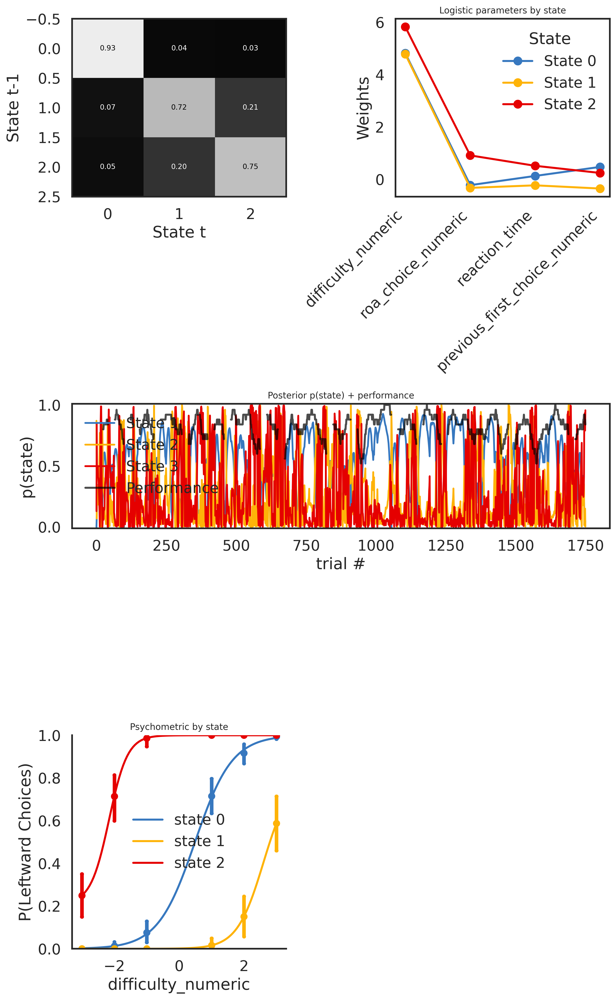

In [99]:
from matplotlib.gridspec import GridSpec

# ===== 创建大 figure 和 layout =====
fig = plt.figure(figsize=(10, 16), dpi=300)
gs = GridSpec(
    nrows=3, ncols=2, figure=fig,
    height_ratios=[1.0, 0.7, 1.2],   # 第二行是长条，扁一点
    width_ratios=[1.0, 1.0]
)

ax_trans = fig.add_subplot(gs[0, 0])   # 转移矩阵
ax_param = fig.add_subplot(gs[0, 1])   # 参数
ax_post  = fig.add_subplot(gs[1, :])   # posterior（跨两列）
ax_psy   = fig.add_subplot(gs[2, 0])   # psychometric（跨两列）

# ===== 1. Transition matrix =====
plot_transition_matrix(map_glmhmm, title="", ax=ax_trans, cmap="gray", fontsize=8)

# ===== 2. Posterior probabilities（长条）=====
post_prob_list = get_posterior_probs_concat(map_glmhmm, datas, inpts)
df_test_multi_session = add_df_glmhmm_state(df_test_multi_session, post_prob_list)
plot_posteriors_with_performance(df_test_multi_session, post_prob_list, colors, ax=ax_post)
ax_post.set_title("Posterior p(state) + performance", fontsize=10)

# ===== 3. Param by state =====
plot_param_by_state(
    map_glmhmm,
    df_test_multi_session,
    X=['difficulty_numeric',
       "roa_choice_numeric",
       "reaction_time",
       "previous_first_choice_numeric"],
    y='first_choice_numeric',
    ax=ax_param
)
ax_param.set_title("Logistic parameters by state", fontsize=10)

# ===== 4. Psychometric curves =====
plot_psychometric_by_state(
    df_test_multi_session,
    map_glmhmm,
    colors,
    x="difficulty_numeric",
    y="first_choice_numeric",
    ax=ax_psy, 
    log=False
)
ax_psy.set_title("Psychometric by state", fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
# find the optimal number of states by comparing the log-likelihood of models with different number of states
sessions = df_test_multi['session'].unique()[-1]
df_test_multi_session = df_test_multi[df_test_multi['session'].isin(sample_sessions)]
datas, inpts = build_glmhmm_inputs_by_session(
    df_test_multi_session,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col=["difficulty_numeric", "bias", ""],
)
state_range = range(2, 6)
model_results = []
for num_states in state_range:
    map_glmhmm, ll, hmm_lls = fit_glmhmm(datas, inpts, num_states=num_states, obs_dim=1, input_dim=2, kappa=15, prior_sigma=2)
    model_results.append((num_states, ll))
# plot the log-likelihood for different number of states
plt.figure(figsize=(6, 4))
plt.plot([r[0] for r in model_results], [r[1] for r in model_results], marker='o')
plt.xlabel("Number of states")
plt.ylabel("Log-likelihood")
plt.title("Model selection for GLM-HMM")
plt.xticks(state_range)
plt.show()

In [112]:
df_test_multi_session_vis = df_test_multi_session[df_test_multi_session['stimulus_modality'] == 'visual'].sample(n=500, random_state=42)
df_test_multi_session_aud = df_test_multi_session[df_test_multi_session['stimulus_modality'] == 'auditory'].sample(n=500, random_state=42)
df_test_multi_session_vis.shape

(500, 99)

In [115]:
counts = pd.DataFrame([])
counts['visual'] = df_test_multi_session_vis.groupby('glmhmm_state').size()
counts['auditory'] = df_test_multi_session_aud.groupby('glmhmm_state').size()
counts

,visual,auditory
glmhmm_state,,
0,154,299
1,125,98
2,221,103


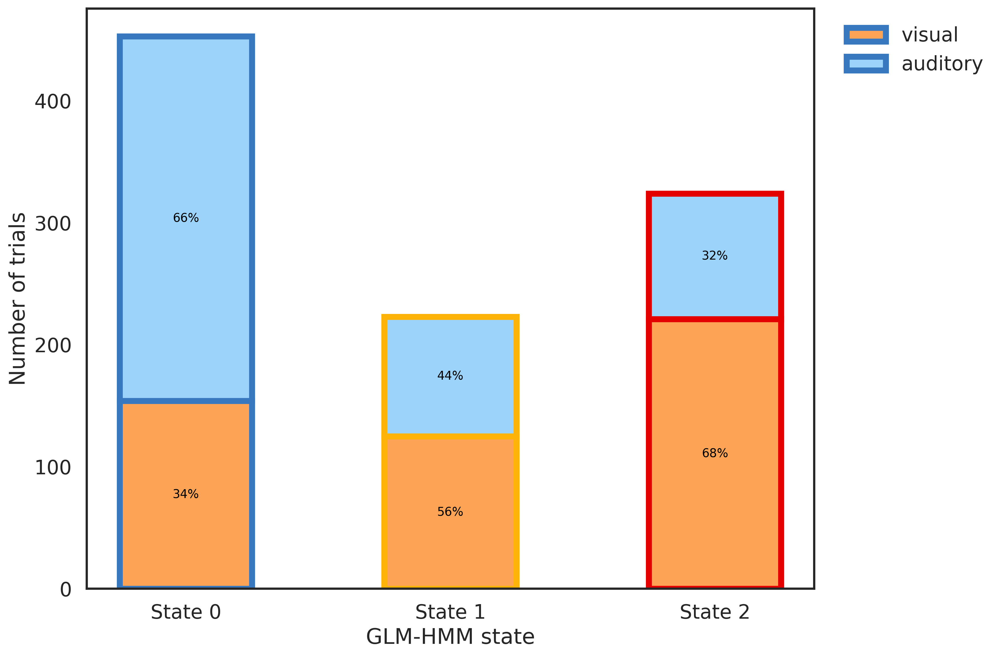

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df = df_test_multi_session.copy()

state_col = "glmhmm_state"
mod_col = "stimulus_modality"

# 2) 同时算比例（仅用于标注百分比）
props = counts.div(counts.sum(axis=1), axis=0)

# 3) modality 顺序（按你想显示的顺序）
modalities = counts.columns.tolist()

# 4) 颜色（你可以替换成自己论文用的颜色）
palette = {
    "auditory": "#9bd3fb",  # 蓝
    "visual":   "#fca355",  # 橙
}

fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

x = np.arange(len(counts.index))
bottom = np.zeros(len(x))
n = 0
for m in modalities:
    h = counts[m].to_numpy()

    bars = ax.bar(
        x,
        h,
        width=0.5,
        bottom=bottom,
        color=palette.get(m, None),
        edgecolor=colors,
        linewidth=5,
        label=m
    )

    # 5) 在每个堆叠块中标百分比
    for i, (bar, count_val) in enumerate(zip(bars, h)):
        if count_val == 0:
            continue

        pct = props.loc[counts.index[i], m] * 100

        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bottom[i] + count_val / 2,
            f"{pct:.0f}%",
            ha="center",
            va="center",
            fontsize=10,
            color="black"
        )

    bottom += h

# 6) 轴与样式
ax.set_xticks(x)
ax.set_xticklabels([f"State {s}" for s in counts.index])
ax.set_ylabel("Number of trials")
ax.set_xlabel("GLM-HMM state")

ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

fig.savefig('/home/kudongdong/data/LeciLab/temporary_plots/glmhmm_multisensory_psychometric_proportion.svg', format='svg')


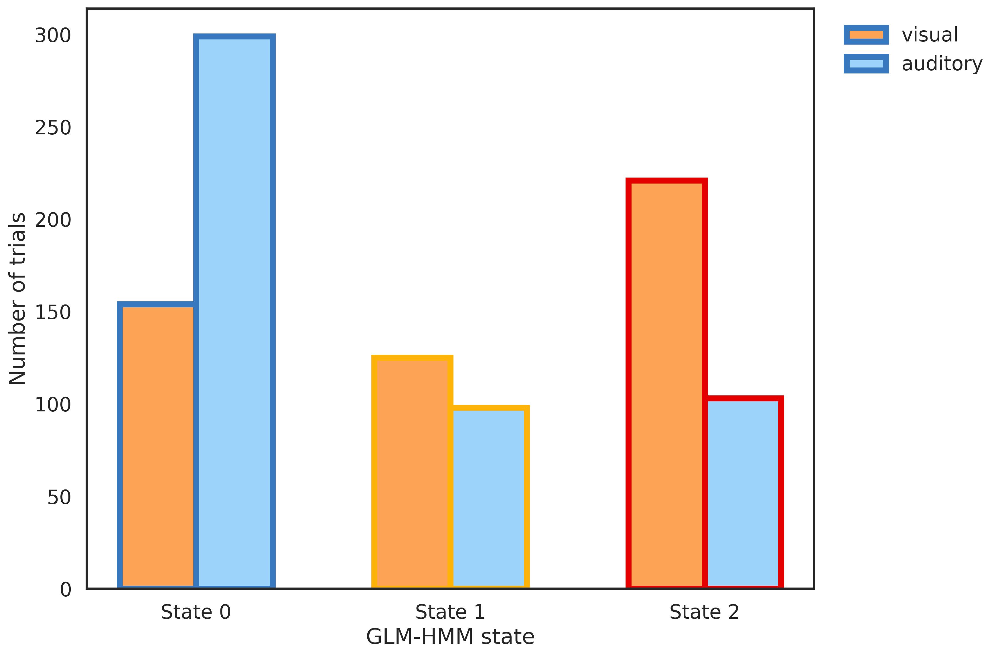

In [122]:
df = df_test_multi_session.copy()

state_col = "glmhmm_state"
mod_col = "stimulus_modality"

# 2) 同时算比例（仅用于标注百分比）
props = counts.div(counts.sum(axis=1), axis=0)

# 3) modality 顺序（按你想显示的顺序）
modalities = counts.columns.tolist()

# 4) 颜色（你可以替换成自己论文用的颜色）
palette = {
    "auditory": "#9bd3fb",  # 蓝
    "visual":   "#fca355",  # 橙
}

fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

x = np.arange(len(counts.index))
w = 0.3  # bar width

h = counts[m].to_numpy()

ax.bar(
    x - w/2,
    counts['visual'].to_numpy(),
    width=w,
    color=palette.get('visual', None),
    edgecolor=colors,
    linewidth=5,
    label='visual'
)
ax.bar(
    x + w/2,
    counts['auditory'].to_numpy(),
    width=w,
    color=palette.get('auditory', None),
    edgecolor=colors,
    linewidth=5,
    label='auditory'
)

# 6) 轴与样式
ax.set_xticks(x)
ax.set_xticklabels([f"State {s}" for s in counts.index])
ax.set_ylabel("Number of trials")
ax.set_xlabel("GLM-HMM state")

ax.legend(frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

fig.savefig('/home/kudongdong/data/LeciLab/temporary_plots/glmhmm_multisensory_psychometric_proportion.svg', format='svg')


In [ ]:
for modality in ['visual', 'auditory']:
    df_preright = df_test_visual if modality == 'visual' else df_test_auditory
    

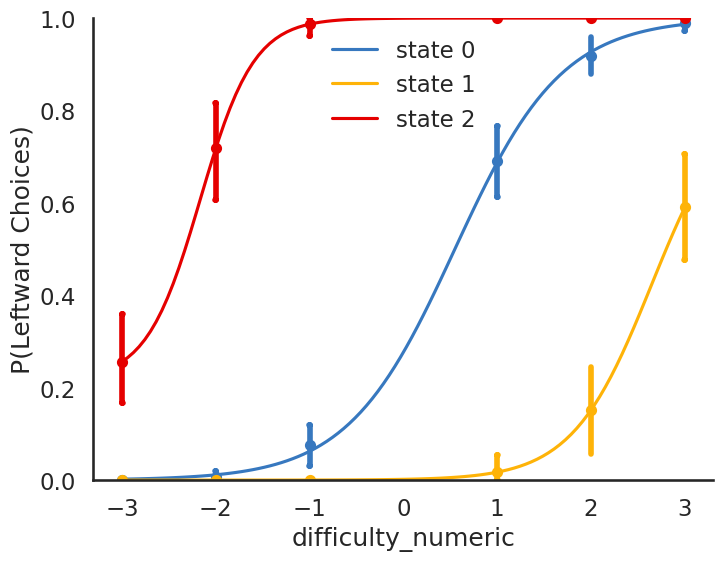

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
plot_psychometric_by_state(
    df_test_multi_session,
    map_glmhmm,
    colors,
    x="difficulty_numeric",
    y="first_choice_numeric",
    ax=ax, 
    log=False
)
fig.savefig('/home/kudongdong/data/LeciLab/temporary_plots/glmhmm_multisensory_psychometric.svg', format='svg', )

In [40]:
df_test_multi_vis = df_test_multi[df_test_multi['stimulus_modality'] == 'visual']
df_test_multi_aud = df_test_multi[df_test_multi['stimulus_modality'] == 'auditory']
sample_sessions = []
for session in df_test_multi['session'].unique():
    if (df_test_multi_vis[df_test_multi_vis['session'] == session]['performance_w'].mean()>75) & (df_test_multi_aud[df_test_multi_aud['session'] == session]['performance_w'].mean()>75):
        sample_sessions.append(session)
    else:
        pass
df_test_multi_vis = df_test_multi_vis[df_test_multi_vis['session'].isin(sample_sessions)]
df_test_multi_aud = df_test_multi_aud[df_test_multi_aud['session'].isin(sample_sessions)]

In [50]:

datas_vis, inpts_vis = build_glmhmm_inputs_by_session(
    df_test_multi_vis,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col="difficulty_numeric",
)
datas_aud, inpts_aud = build_glmhmm_inputs_by_session(
    df_test_multi_aud,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col="difficulty_numeric",  
)
# Fit GLM-HMM with MAP estimation:
map_glmhmm_vis, ll_vis, hmm_lls_vis = fit_glmhmm(datas_vis, inpts_vis, num_states=3, obs_dim=1, input_dim=2, kappa=20, prior_sigma=10)
map_glmhmm_aud, ll_aud, hmm_lls_aud = fit_glmhmm(datas_aud, inpts_aud, num_states=3, obs_dim=1, input_dim=2, kappa=20, prior_sigma=10)

LP: -906.9: 100%|██████████| 100/100 [00:34<00:00,  2.93it/s]


<Axes: xlabel='trial #', ylabel='p(state)'>

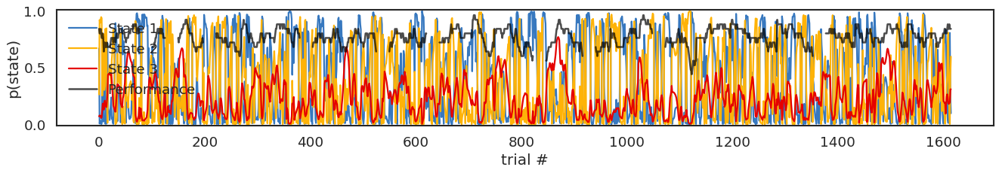

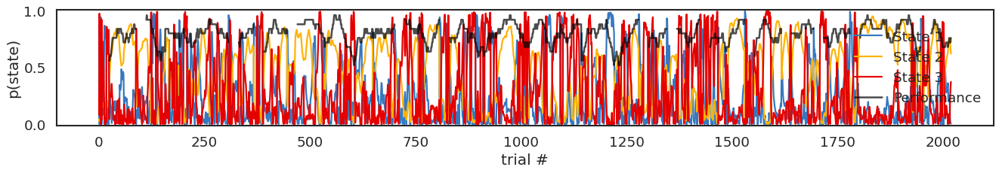

In [51]:
post_prob_list = get_posterior_probs_concat(map_glmhmm_vis, datas_vis, inpts_vis)
df_test_multi_vis = add_df_glmhmm_state(df_test_multi_vis, post_prob_list)
plot_posteriors_with_performance(df_test_multi_vis, post_prob_list, colors, ax=None) 

post_prob_list = get_posterior_probs_concat(map_glmhmm_aud, datas_aud, inpts_aud)
df_test_multi_aud = add_df_glmhmm_state(df_test_multi_aud, post_prob_list)
plot_posteriors_with_performance(df_test_multi_aud, post_prob_list, colors, ax=None)

Optimization terminated successfully.
         Current function value: 0.075247
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.018313
         Iterations 18
         Current function value: inf
         Iterations: 35


LinAlgError: Singular matrix

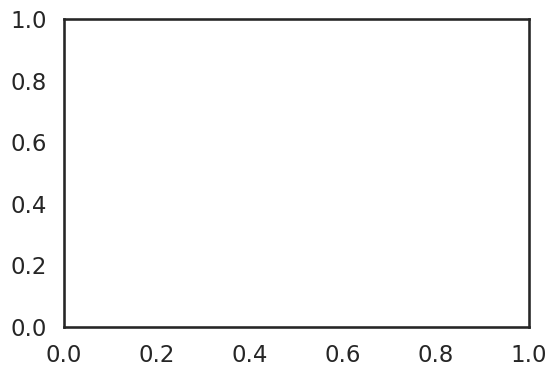

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
plot_param_by_state(map_glmhmm_vis, df_test_multi_vis, X=['difficulty_numeric',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric', ax=ax, linestyle="-")
plot_param_by_state(map_glmhmm_aud, df_test_multi_aud, X=['difficulty_numeric',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric', ax=ax, linestyle="--")

<Axes: xlabel='difficulty_numeric', ylabel='P(Leftward Choices)'>

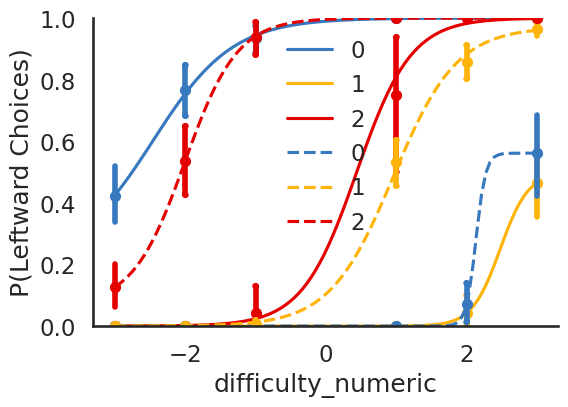

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
plot_psychometric_by_state(df_test_multi_vis, map_glmhmm_vis, colors, x="difficulty_numeric", y="first_choice_numeric", ax=ax, log=False)
plot_psychometric_by_state(df_test_multi_aud, map_glmhmm_aud, colors, x="difficulty_numeric", y="first_choice_numeric", ax=ax, log=False, line_kwargs={"linestyle":"--"})

In [ ]:
mouse = 'ACV009'
df_mouse = df_dic_vis[mouse]
df_mouse.dropna(subset=['visual_stimulus_ratio', 'first_choice_numeric'], inplace=True)
datas_vis, inpts_vis = build_glmhmm_inputs_by_session(
    df_mouse,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col="visual_stimulus_ratio",
)
# Fit GLM-HMM with MAP estimation:
map_glmhmm, ll, hmm_lls = fit_best_glmhmm(datas_vis, inpts_vis, num_states=3, obs_dim=1, input_dim=2)

Converged to LP: -36317.7:  99%|█████████▉| 99/100 [18:54<00:11, 11.46s/it]


(<Axes: xlabel='State t', ylabel='State t-1'>,
 <matplotlib.image.AxesImage at 0x7d17c87ce920>)

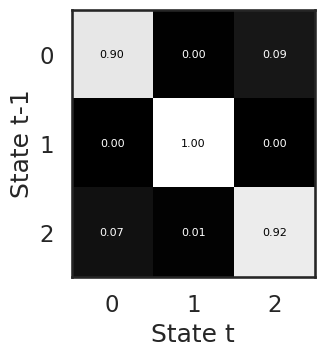

In [32]:
plot_transition_matrix(map_glmhmm, title="", ax=None, cmap="gray", fontsize=8)

<Axes: xlabel='trial #', ylabel='p(state)'>

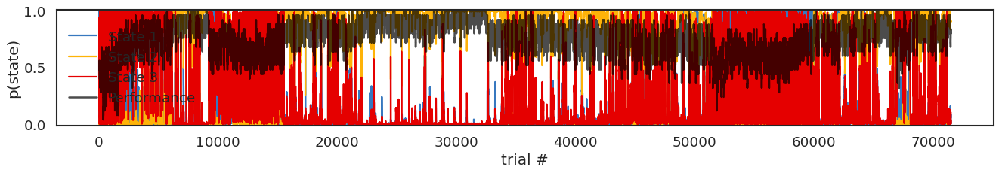

In [42]:
post_prob_list = get_posterior_probs_concat(map_glmhmm, datas_vis, inpts_vis)
df_mouse = add_df_glmhmm_state(df_mouse, post_prob_list)
plot_posteriors_with_performance(df_mouse, post_prob_list, colors, ax=None)

Optimization terminated successfully.
         Current function value: 0.346597
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.342069
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.419698
         Iterations 7


<Axes: ylabel='Weights'>

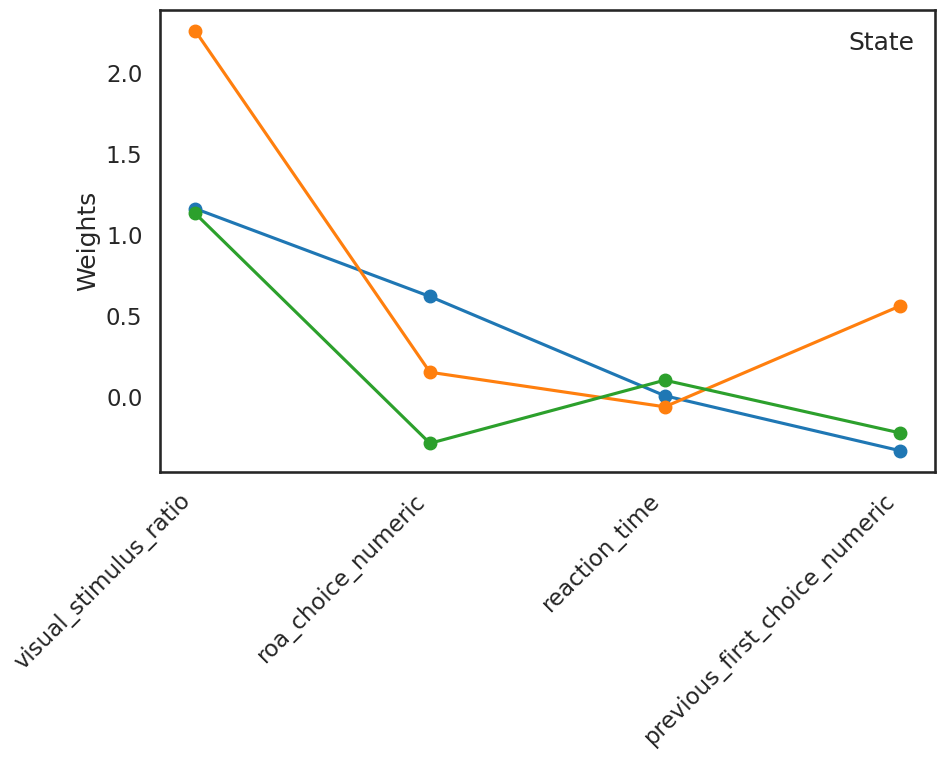

In [44]:
plot_param_by_state(map_glmhmm, df_mouse, X=['visual_stimulus_ratio',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric', ax=None)

<Axes: xlabel='log_visual_stimulus_ratio', ylabel='P(Leftward Choices)'>

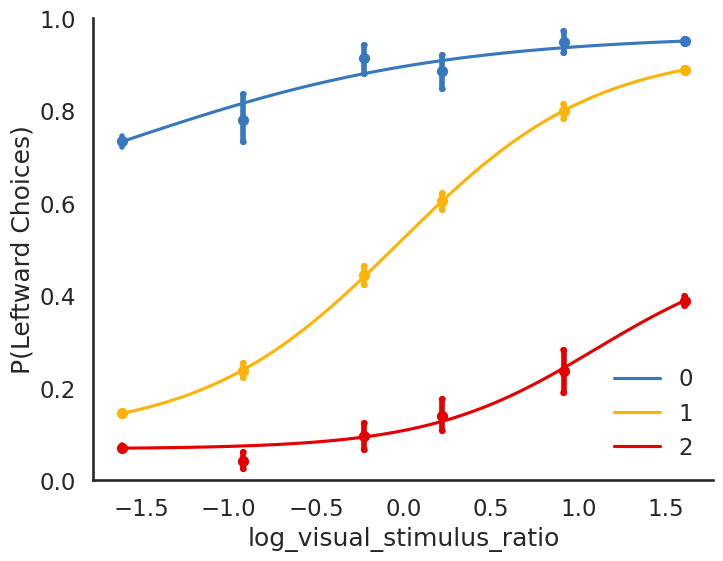

In [45]:
plot_psychometric_by_state(df_mouse, map_glmhmm, colors, x="visual_stimulus_ratio", y="first_choice_numeric", ax=None)

In [ ]:
from matplotlib.gridspec import GridSpec

# ===== 创建大 figure 和 layout =====
fig = plt.figure(figsize=(14, 10), dpi=300)
gs = GridSpec(
    nrows=3, ncols=2, figure=fig,
    height_ratios=[1.0, 0.45, 1.2],   # 第二行是长条，扁一点
    width_ratios=[1.0, 1.0]
)

ax_trans = fig.add_subplot(gs[0, 0])   # 转移矩阵
ax_param = fig.add_subplot(gs[0, 1])   # 参数
ax_post  = fig.add_subplot(gs[1, :])   # posterior（跨两列）
ax_psy   = fig.add_subplot(gs[2, 0])   # psychometric

# ===== 1. Transition matrix =====
plot_transition_matrix(
    map_glmhmm,
    title=f"{mouse}",
    ax=ax_trans,
    cmap="gray",
    fontsize=8
)

# ===== 2. Param by state =====
plot_param_by_state(
    map_glmhmm,
    df_mouse,
    X=['visual_stimulus_ratio',
       "roa_choice_numeric",
       "reaction_time",
       "previous_first_choice_numeric"],
    y='first_choice_numeric',
    ax=ax_param
)
ax_param.set_title("Logistic parameters by state", fontsize=10)

# ===== 3. Posterior probabilities（长条）=====
plot_posteriors_with_performance(
    df_mouse,
    post_prob_list,
    colors,
    ax=ax_post
)
ax_post.set_title("Posterior p(state) + performance", fontsize=10)

# ===== 4. Psychometric curves =====
plot_psychometric_by_state(
    df_mouse,
    map_glmhmm,
    colors,
    x="visual_stimulus_ratio",
    y="first_choice_numeric",
    ax=ax_psy
)
ax_psy.set_title("Psychometric by state", fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
from matplotlib.gridspec import GridSpec

def plot_glmhmm_pipeline_figure(
    map_glmhmm,
    df_mouse,
    post_prob_list,
    colors,
    X,
    y="first_choice_numeric",
    stim_x="visual_stimulus_ratio",
    title_prefix="",
    figsize=(14, 10),
    dpi=200,
):
    """
    Layout:
      Row 0: [transition matrix] [param-by-state]
      Row 1: [posterior strip spanning both columns]  (long bar)
      Row 2: [psychometric by state spanning both columns] (or keep 2 cols if you prefer)
    """

    fig = plt.figure(figsize=figsize, dpi=dpi, constrained_layout=True)
    gs = GridSpec(
        nrows=3, ncols=2, figure=fig,
        height_ratios=[1.0, 0.45, 1.2],  # 中间长条更扁
        width_ratios=[1.0, 1.0]
    )

    ax_A   = fig.add_subplot(gs[0, 0])   # transition matrix
    ax_B   = fig.add_subplot(gs[0, 1])   # param plot
    ax_C   = fig.add_subplot(gs[1, :])   # posterior strip (span)
    ax_D   = fig.add_subplot(gs[2, :])   # psychometric (span)

    # 1) Transition matrix
    plot_transition_matrix(
        map_glmhmm,
        title=f"{title_prefix} Transition matrix",
        ax=ax_A, cmap="gray", fontsize=8
    )

    # 2) Param-by-state
    plot_param_by_state(
        map_glmhmm,
        df_mouse,
        X=X, y=y,
        ax=ax_B
    )
    ax_B.set_title(f"{title_prefix} Logistic params by state", fontsize=10)

    # 3) Posterior strip (long bar)
    plot_posteriors_with_performance(
        df_mouse,
        post_prob_list,
        colors,
        ax=ax_C
    )
    ax_C.set_title(f"{title_prefix} Posterior p(state) + performance", fontsize=10)

    # 4) Psychometric by state
    plot_psychometric_by_state(
        df_mouse,
        map_glmhmm,
        colors,
        x=stim_x,
        y=y,
        ax=ax_D
    )
    ax_D.set_title(f"{title_prefix} Psychometric by state", fontsize=10)

    return fig

In [53]:
mouse = 'ACV009'
df_mouse_aud = df_dic_aud[mouse]
df_mouse_aud.dropna(subset=['total_evidence_strength', 'first_choice_numeric'], inplace=True)
datas_aud, inpts_aud = build_glmhmm_inputs_by_session(
    df_mouse_aud,
    session_col="session",
    y_col="first_choice_numeric",
    stim_col="total_evidence_strength",
)
# Fit GLM-HMM with MAP estimation:
map_glmhmm_aud, ll_aud, hmm_lls_aud = fit_glmhmm(datas_aud, inpts_aud, num_states=3, obs_dim=1, input_dim=2)

LP: -34377.1: 100%|██████████| 100/100 [23:57<00:00, 14.38s/it]


(<Axes: xlabel='State t', ylabel='State t-1'>,
 <matplotlib.image.AxesImage at 0x7d17aac38fa0>)

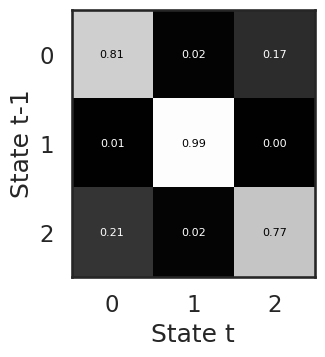

In [54]:
plot_transition_matrix(map_glmhmm_aud, title="", ax=None, cmap="gray", fontsize=8)

<Axes: xlabel='trial #', ylabel='p(state)'>

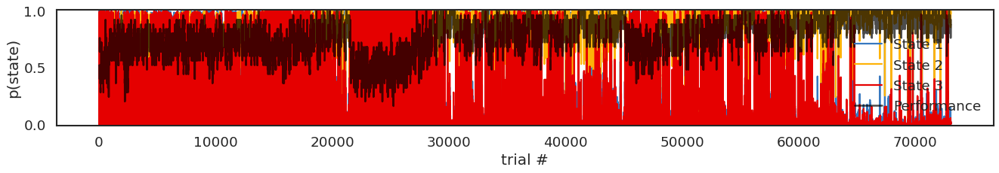

In [55]:
post_prob_list = get_posterior_probs_concat(map_glmhmm_aud, datas_aud, inpts_aud)
df_mouse_aud = add_df_glmhmm_state(df_mouse_aud, post_prob_list)
plot_posteriors_with_performance(df_mouse_aud, post_prob_list, colors, ax=None)

Optimization terminated successfully.
         Current function value: 0.144503
         Iterations 12
Optimization terminated successfully.
         Current function value: 0.303270
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.050832
         Iterations 29


<Axes: ylabel='Weights'>

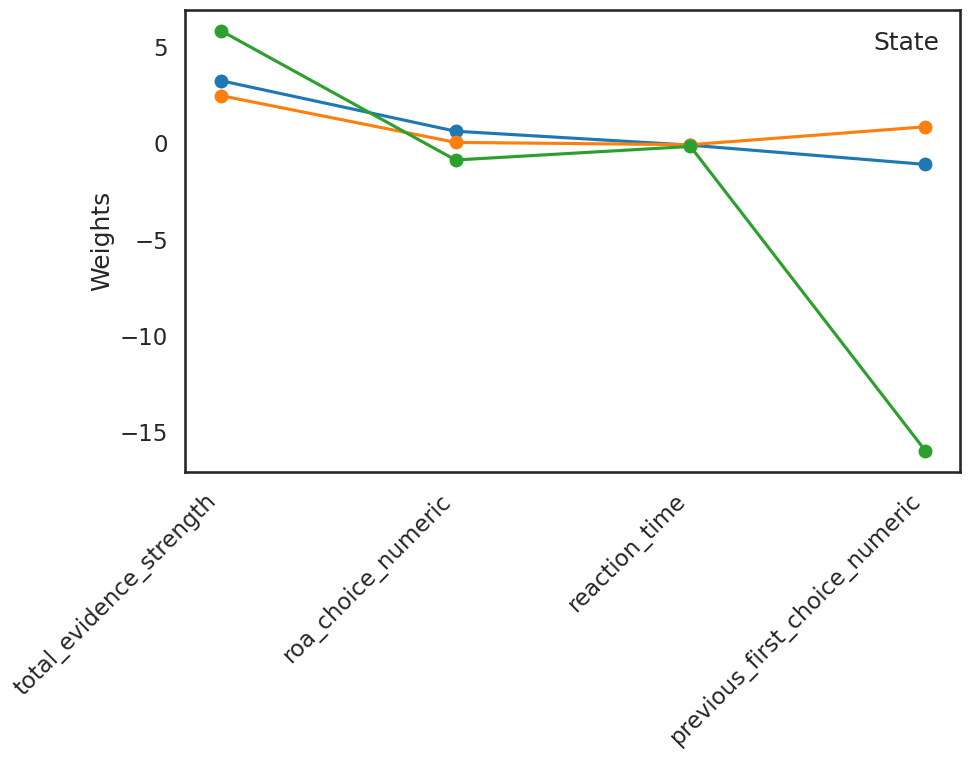

In [56]:
plot_param_by_state(map_glmhmm_aud, df_mouse_aud, X=['total_evidence_strength',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric', ax=None)

<Axes: xlabel='total_evidence_strength (binned)', ylabel='P(Leftward Choices)'>

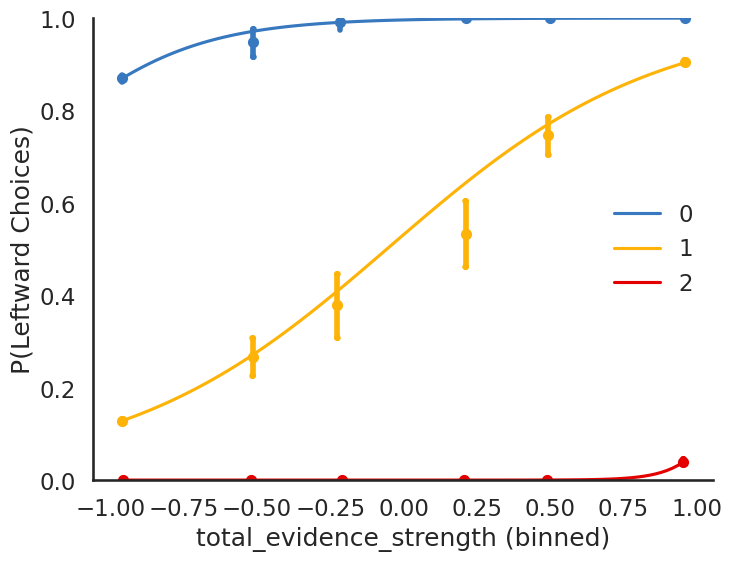

In [59]:
plot_psychometric_by_state(df_mouse_aud, map_glmhmm_aud, colors, x="total_evidence_strength", y="first_choice_numeric", ax=None, valueType="continuous")

In [16]:

mouse = 'ACV009'
df_mouse_sessions = df_dic_vis[mouse][df_dic_vis[mouse]['session'].isin(df_dic_vis[mouse]['session'].unique()[-10:])]
datas = []
inpts = []
for sess in df_mouse_sessions['session'].unique():
    df_mouse_sessions[df_mouse_sessions['session'] == sess].dropna(subset=['visual_stimulus_ratio', 'first_choice_numeric'], inplace=True)
    df_mouse_session = df_mouse_sessions[df_mouse_sessions['session'] == sess]
    obs_sess = df_mouse_session['first_choice_numeric'].to_numpy().astype(int).reshape(-1, 1)
    
    inpt_sess = np.column_stack([
        df_mouse_session['visual_stimulus_ratio'].to_list(),
        np.ones(len(df_mouse_session))  # bias term
        ])
    datas.append(obs_sess)
    inpts.append(inpt_sess)

# Fit GLM-HMM with MAP estimation:
map_glmhmm, map_ll = fit_best_glmhmm(datas, inpts, num_states=3, obs_dim=1, input_dim=2)

LP: -1892.5: 100%|██████████| 100/100 [00:19<00:00,  5.16it/s]


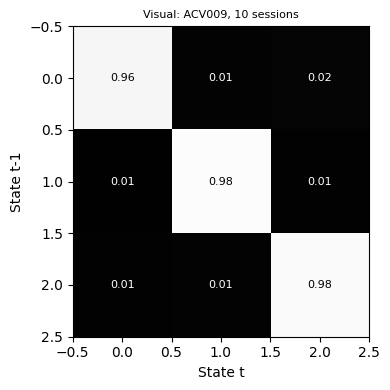

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))

A = map_glmhmm.transitions.transition_matrix  # shape (K, K)
im = ax.imshow(A, vmin=0, vmax=1, aspect="auto", cmap="gray")

ax.set_title(f'Visual: {mouse}, 10 sessions', fontsize=8)
ax.set_xlabel("State t")
ax.set_ylabel("State t-1")

K = A.shape[0]

# write the values of the transition matrix on the heatmap
for i in range(K):
    for j in range(K):
        val = A[i, j]
        ax.text(
            j, i, f"{val:.2f}",
            ha="center", va="center",
            color="black" if val > 0.5 else "white",
            fontsize=8
        )

plt.tight_layout()
plt.show()


In [18]:
# Get expected states:
posterior_probs = [map_glmhmm.expected_states(data=data, input=inpt)[0]
                for data, inpt
                in zip(datas, inpts)]
posterior_probs_con = np.concatenate(posterior_probs, axis=0)

Text(0, 0.5, 'p(state)')

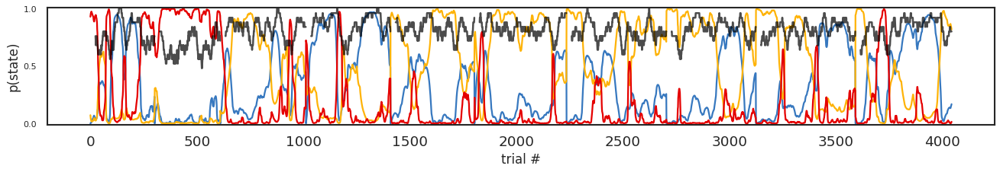

In [254]:
fig = plt.figure(figsize=(20, 2.5), dpi=80, facecolor='w', edgecolor='k')
for k in range(num_states):
    plt.plot(posterior_probs_con[:, k], label="State " + str(k + 1), lw=2,
            color=colors[k])
plt.plot(df_mouse_sessions['performance_w'].values*0.01, '-k', label='Performance', alpha=0.7)
plt.ylim((-0.01, 1.01))
plt.yticks([0, 0.5, 1], fontsize = 10)
plt.xlabel("trial #", fontsize = 15)
plt.ylabel("p(state)", fontsize = 15)

In [19]:
state_seq = np.argmax(posterior_probs_con, axis=1)
df_mouse_sessions["glmhmm_state"] = state_seq

Optimization terminated successfully.
         Current function value: 0.224937
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.291512
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.167097
         Iterations 8


([0, 1, 2, 3],
 [Text(0, 0, 'visual_stimulus_ratio'),
  Text(1, 0, 'roa_choice_numeric'),
  Text(2, 0, 'reaction_time'),
  Text(3, 0, 'previous_first_choice_numeric')])

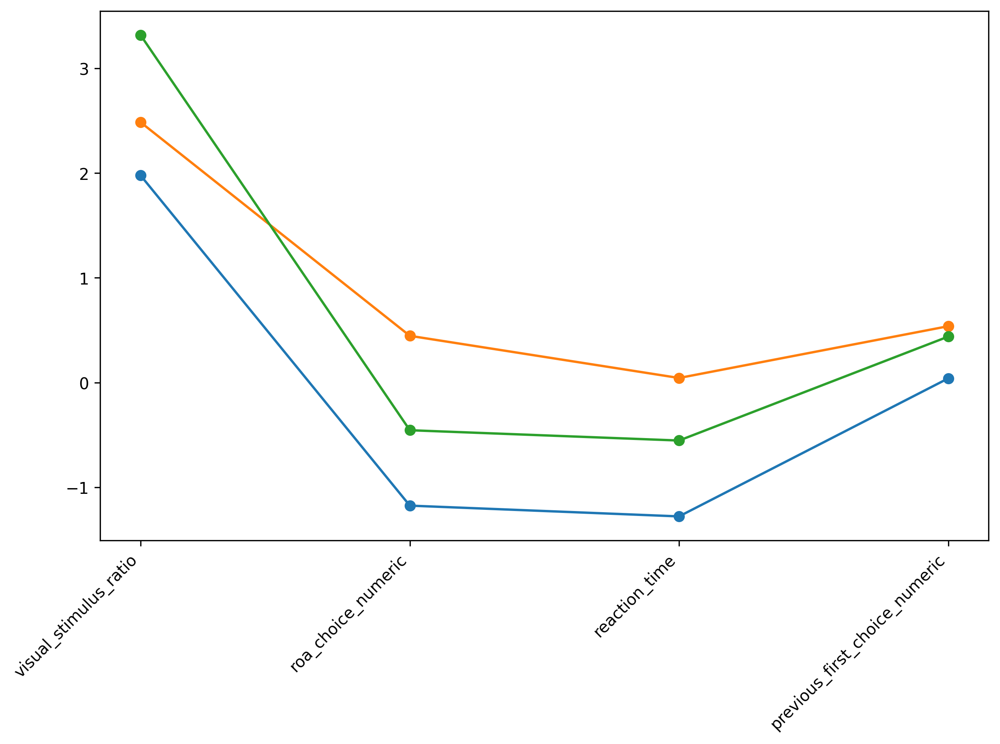

In [20]:
fig = plt.figure(figsize=(10, 6), dpi=300, facecolor='w', edgecolor='k')
df_param_states = pd.DataFrame([])
for state in range(map_glmhmm.K):
    df_session_state = df_mouse_sessions[df_mouse_sessions['glmhmm_state'] == state]
    df_session_state = dft.calculate_time_between_trials_and_reaction_time(df_session_state)
    if len(df_session_state) > 1:
        _, logit_model_multi = utils.logi_model_fit(df_session_state, 
                                X=['visual_stimulus_ratio',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric',)
        df_param_states[state] = logit_model_multi.params
df_param_states.drop('const', inplace=True)
plt.plot(df_param_states, marker='o', )
plt.xticks(rotation=45, ha='right')

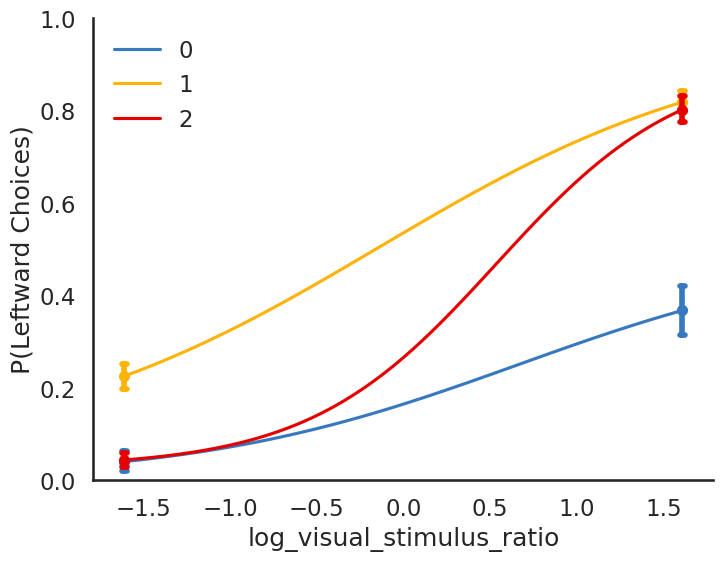

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
for state in range(map_glmhmm.K):
    df_session_state = df_mouse_sessions[df_mouse_sessions['glmhmm_state'] == state]
    if len(df_session_state) > 0:
        plots.psychometric_plot(df_session_state, x = 'visual_stimulus_ratio', y = 'first_choice_numeric', point_kwargs={'color': colors[state], 'label' : ''}, line_kwargs={'color': colors[state], 'label': state})

In [9]:

mouse = 'ACV009'
df_mouse_sessions = df_dic_aud[mouse][df_dic_aud[mouse]['session'].isin(df_dic_aud[mouse]['session'].unique()[-10:])]
datas = []
inpts = []
for sess in df_mouse_sessions['session'].unique():
    df_mouse_sessions[df_mouse_sessions['session'] == sess].dropna(subset=['total_evidence_strength', 'first_choice_numeric'], inplace=True)
    df_mouse_session = df_mouse_sessions[df_mouse_sessions['session'] == sess]
    obs_sess = df_mouse_session['first_choice_numeric'].to_numpy().astype(int).reshape(-1, 1)
    
    inpt_sess = np.column_stack([
        df_mouse_session['total_evidence_strength'].to_list(),
        np.ones(len(df_mouse_session))  # bias term
        ])
    datas.append(obs_sess)
    inpts.append(inpt_sess)

# Fit GLM-HMM with MAP estimation:
map_glmhmm, map_ll = fit_best_glmhmm(datas, inpts, num_states=3, obs_dim=1, input_dim=2)

LP: -1074.0: 100%|██████████| 100/100 [00:20<00:00,  4.90it/s]


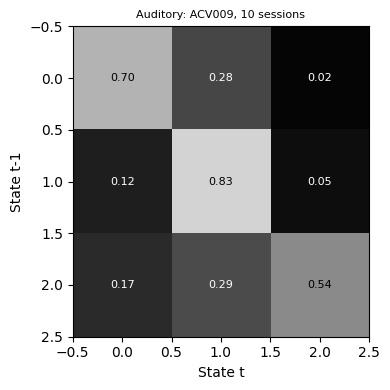

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))

A = map_glmhmm.transitions.transition_matrix  # shape (K, K)
im = ax.imshow(A, vmin=0, vmax=1, aspect="auto", cmap="gray")

ax.set_title(f'Auditory: {mouse}, 10 sessions', fontsize=8)
ax.set_xlabel("State t")
ax.set_ylabel("State t-1")

K = A.shape[0]

# write the values of the transition matrix on the heatmap
for i in range(K):
    for j in range(K):
        val = A[i, j]
        ax.text(
            j, i, f"{val:.2f}",
            ha="center", va="center",
            color="black" if val > 0.5 else "white",
            fontsize=8
        )

plt.tight_layout()
plt.show()


In [11]:
# Get expected states:
posterior_probs = [map_glmhmm.expected_states(data=data, input=inpt)[0]
                for data, inpt
                in zip(datas, inpts)]
posterior_probs_con = np.concatenate(posterior_probs, axis=0)

Text(0, 0.5, 'p(state)')

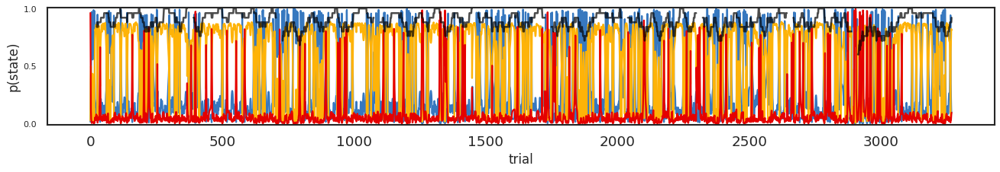

In [14]:
fig = plt.figure(figsize=(20, 2.5), dpi=80, facecolor='w', edgecolor='k')
for k in range(map_glmhmm.K):
    plt.plot(posterior_probs_con[:, k], label="State " + str(k + 1), lw=2,
            color=colors[k])
plt.plot(df_mouse_sessions['performance_w'].values*0.01, '-k', label='Performance', alpha=0.7)
plt.ylim((-0.01, 1.01))
plt.yticks([0, 0.5, 1], fontsize = 10)
plt.xlabel("trial", fontsize = 15)
plt.ylabel("p(state)", fontsize = 15)

In [15]:
state_seq = np.argmax(posterior_probs_con, axis=1)
df_mouse_sessions["glmhmm_state"] = state_seq

In [20]:
fig = plt.figure(figsize=(10, 6), dpi=300, facecolor='w', edgecolor='k')
df_param_states = pd.DataFrame([])
for state in range(map_glmhmm.K):
    df_session_state = df_mouse_sessions[df_mouse_sessions['glmhmm_state'] == state]
    df_session_state = dft.calculate_time_between_trials_and_reaction_time(df_session_state)
    if len(df_session_state) > 1:
        _, logit_model_multi = utils.logi_model_fit(df_session_state, 
                                X=['total_evidence_strength',
                                    "roa_choice_numeric",
                                    "reaction_time",
                                    "previous_first_choice_numeric"],
                                y='first_choice_numeric',)
        df_param_states[state] = logit_model_multi.params
df_param_states.drop('const', inplace=True)
plt.plot(df_param_states, marker='o', )
plt.xticks(rotation=45, ha='right')

Optimization terminated successfully.
         Current function value: 0.112509
         Iterations 13
         Current function value: 0.000000
         Iterations: 35
         Current function value: inf
         Iterations: 35


LinAlgError: Singular matrix

<Figure size 3000x1800 with 0 Axes>

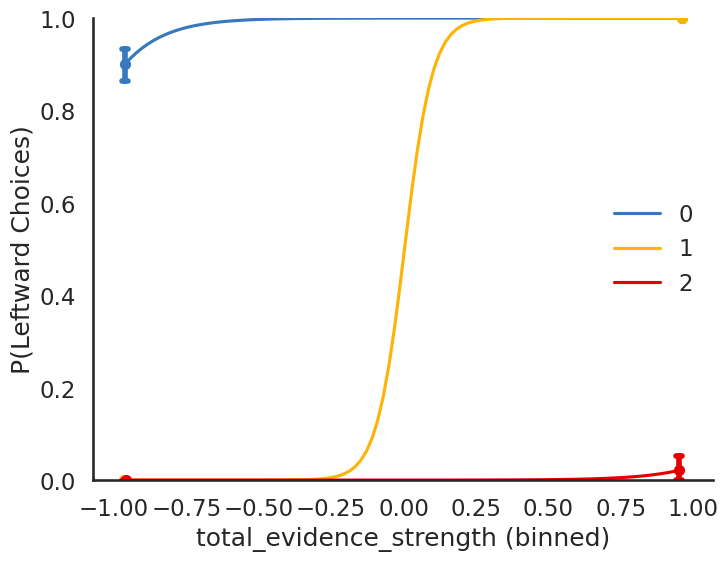

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
for state in range(map_glmhmm.K):
    df_session_state = df_mouse_sessions[df_mouse_sessions['glmhmm_state'] == state]
    if len(df_session_state) > 0:
        plots.psychometric_plot(df_session_state, x = 'total_evidence_strength', y = 'first_choice_numeric', point_kwargs={'color': colors[state], 'label' : ''}, line_kwargs={'color': colors[state], 'label': state}, valueType='continuous')

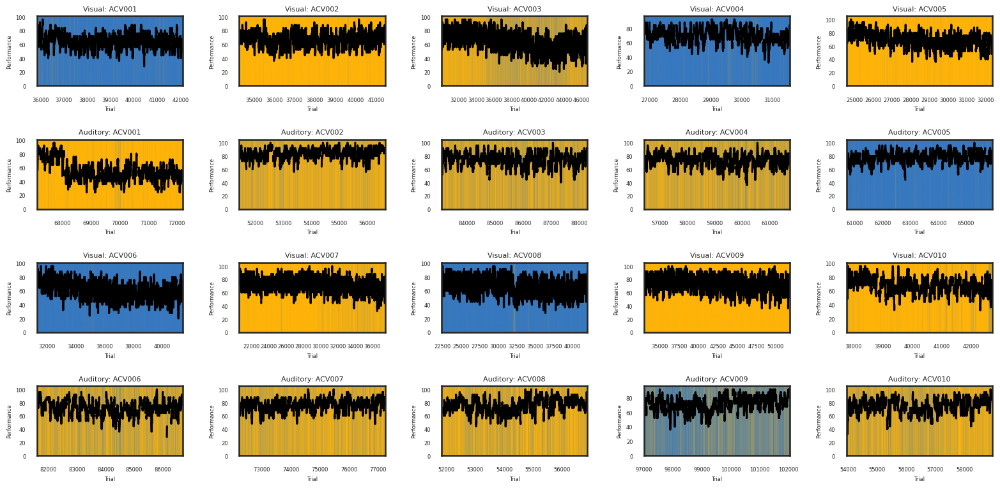

In [ ]:

fig, ax = plt.subplots(4, 5, figsize=(16, 8))
raw, col = 0, 0
for mouse in df_dic_hard_vis:
    lim_vis = 1.05 * df_dic_hard_vis[mouse]['performance_w'].max()
    ax[raw, col].imshow(
        df_dic_hard_vis[mouse]['hmm_states'].to_numpy()[None, :],
        aspect="auto",
        cmap=cmap,
        vmin=0,
        vmax=len(colors) - 1,
        extent=[df_dic_hard_vis[mouse].index.min(), df_dic_hard_vis[mouse].index.max(), 0, lim_vis]
    )
    ax[raw, col].plot(df_dic_hard_vis[mouse]['performance_w'], '-k')
    ax[raw, col].set_title(f'Visual: {mouse}', fontsize=8)
    ax[raw, col].tick_params(axis='x', labelsize=6)
    ax[raw, col].tick_params(axis='y', labelsize=6)
    ax[raw, col].set_ylabel('Performance', fontsize=6)
    ax[raw, col].set_xlabel('Trial', fontsize=6)

    lim_aud = 1.05 * df_dic_hard_aud[mouse]['performance_w'].max()
    ax[raw+1, col].imshow(
        df_dic_hard_aud[mouse]['hmm_states'].to_numpy()[None, :],
        aspect="auto",
        cmap=cmap,
        vmin=0,
        vmax=len(colors) - 1,
        extent=[df_dic_hard_aud[mouse].index.min(), df_dic_hard_aud[mouse].index.max(), 0, lim_aud]
    )
    ax[raw+1, col].plot(df_dic_hard_aud[mouse]['performance_w'], '-k')
    ax[raw+1, col].set_title(f'Auditory: {mouse}', fontsize=8)
    ax[raw+1, col].tick_params(axis='x', labelsize=6)
    ax[raw+1, col].tick_params(axis='y', labelsize=6)
    ax[raw+1, col].set_ylabel('Performance', fontsize=6)
    ax[raw+1, col].set_xlabel('Trial', fontsize=6)

    col += 1
    if col % 5 == 0:
        raw += 2
        col = 0

plt.tight_layout()
plt.show()

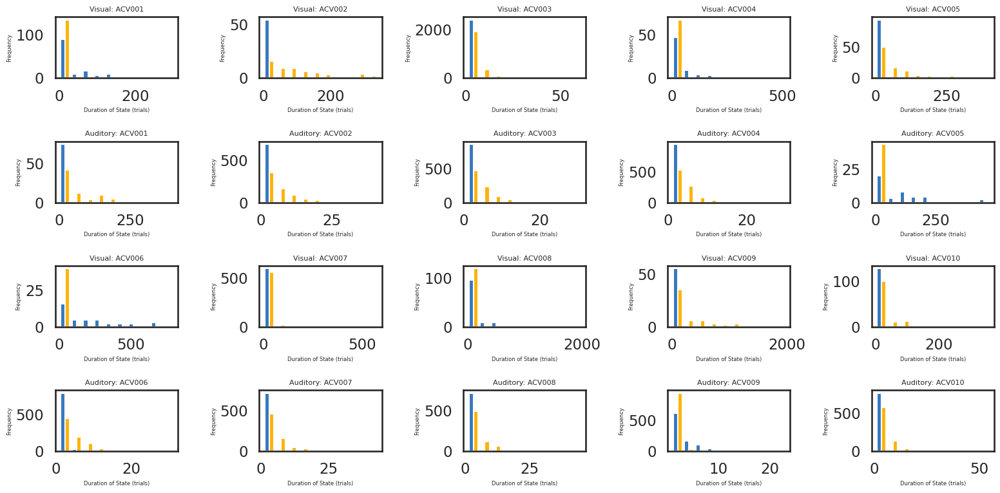

In [193]:
fig, ax = plt.subplots(4, 5, figsize=(16, 8))
raw, col = 0, 0
all_vis_state_list = np.array([])
all_vis_durations = np.array([])
all_aud_state_list = np.array([])
all_aud_durations = np.array([])
for mouse in df_dic_hard_vis:
    vis_state_list, vis_durations = ssm.util.rle(df_dic_hard_vis[mouse]['hmm_states'].to_numpy())
    all_vis_state_list = np.concatenate((all_vis_state_list, vis_state_list))
    all_vis_durations = np.concatenate((all_vis_durations, vis_durations))
    durs_stacked = []
    for s in range(num_states):
        durs_stacked.append(vis_durations[vis_state_list == s])
    ax[raw, col].hist(durs_stacked, 
                      label=['state ' + str(s) for s in range(num_states)], 
                      color=[c for c in colors[:len(durs_stacked)]])
    ax[raw, col].set_title(f'Visual: {mouse}', fontsize=8)
    ax[raw, col].set_xlabel('Duration of State (trials)', fontsize=6)
    ax[raw, col].set_ylabel('Frequency', fontsize=6)

    aud_state_list, aud_durations = ssm.util.rle(df_dic_hard_aud[mouse]['hmm_states'].to_numpy())
    all_aud_state_list = np.concatenate((all_aud_state_list, aud_state_list))
    all_aud_durations = np.concatenate((all_aud_durations, aud_durations))
    durs_stacked = []
    for s in range(num_states):
        durs_stacked.append(aud_durations[aud_state_list == s])
    ax[raw+1, col].hist(durs_stacked, 
                        label=['state ' + str(s) for s in range(num_states)], 
                        color=[c for c in colors[:len(durs_stacked)]])
    ax[raw+1, col].set_title(f'Auditory: {mouse}', fontsize=8)
    ax[raw+1, col].set_xlabel('Duration of State (trials)', fontsize=6)
    ax[raw+1, col].set_ylabel('Frequency', fontsize=6)

    col += 1
    if col % 5 == 0:
        raw += 2
        col = 0

plt.tight_layout()
plt.show()

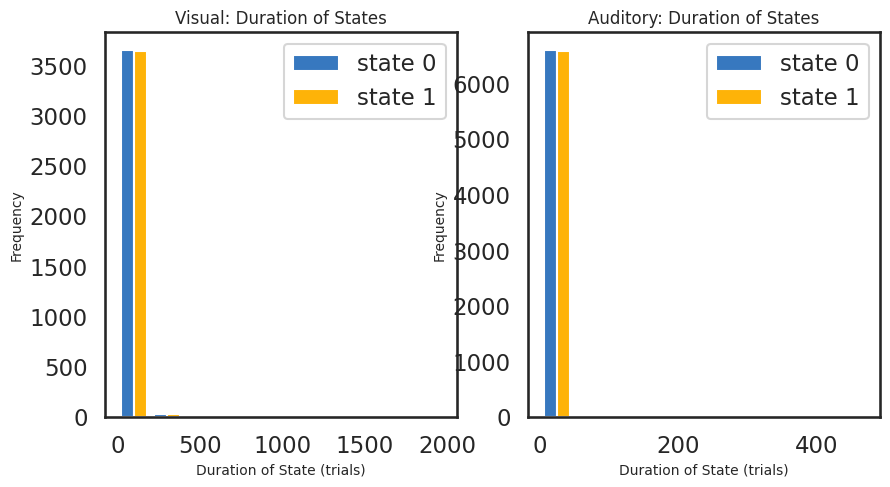

In [194]:
vis_durs_stacked = []
aud_durs_stacked = []
for s in range(num_states):
    vis_durs_stacked.append(all_vis_durations[all_vis_state_list == s])
    aud_durs_stacked.append(all_aud_durations[all_aud_state_list == s])
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(vis_durs_stacked, 
         label=['state ' + str(s) for s in range(2)], 
         color=[c for c in colors[:len(vis_durs_stacked)]])
plt.title('Visual: Duration of States', fontsize=12)
plt.xlabel('Duration of State (trials)', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()
plt.subplot(1, 2, 2)
plt.hist(aud_durs_stacked, 
         label=['state ' + str(s) for s in range(2)], 
         color=[c for c in colors[:len(aud_durs_stacked)]])     
plt.title('Auditory: Duration of States', fontsize=12)
plt.xlabel('Duration of State (trials)', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.legend()

## filter the correlated values

         Current function value: 0.566772
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.586231
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.571521
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.567277
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.576284
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.582645
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.566831
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current functio

<Figure size 400x800 with 0 Axes>

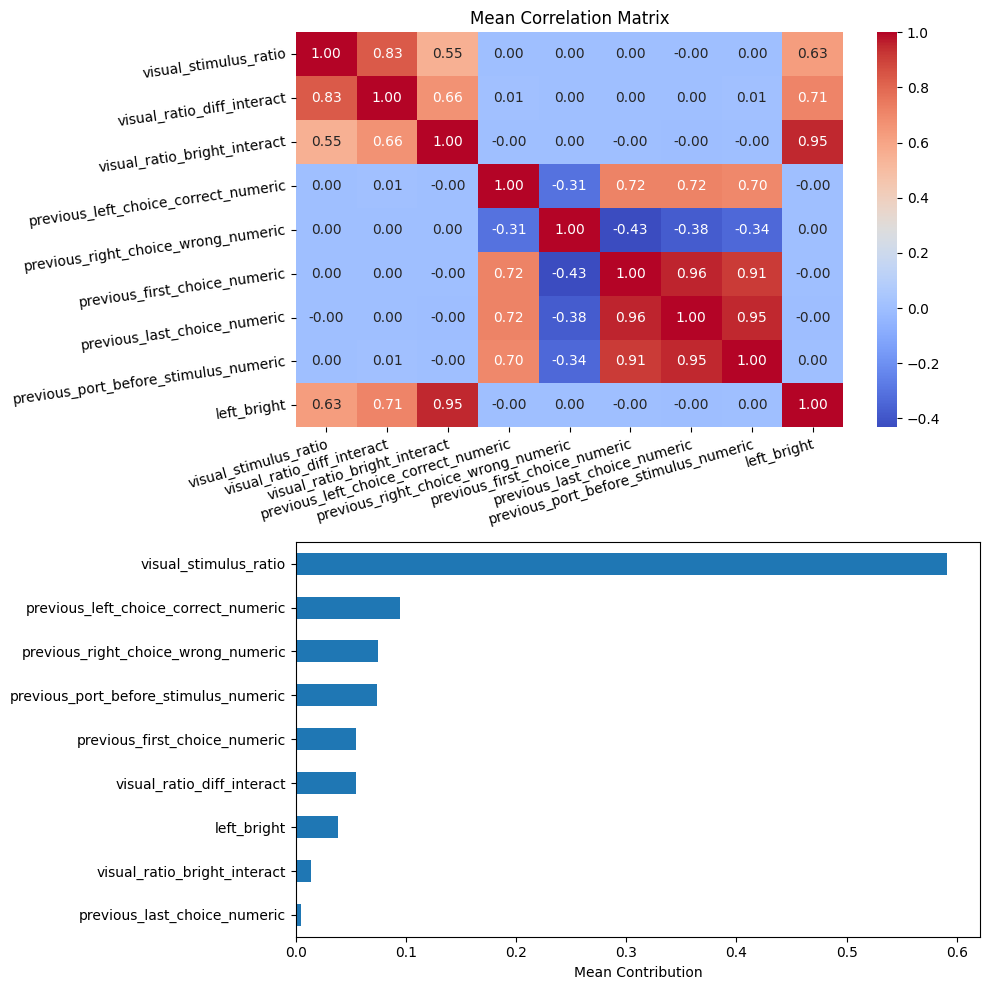

In [16]:
fig = plt.figure(figsize=(4, 8))
X = ['visual_stimulus_ratio',
    'visual_ratio_diff_interact',
    'visual_ratio_bright_interact', 
    'previous_left_choice_correct_numeric',
    'previous_right_choice_wrong_numeric',
    'previous_first_choice_numeric', 
    'previous_last_choice_numeric', 
    'previous_port_before_stimulus_numeric',
    'left_bright'
    ]
corr_mat_list, norm_contribution_df = utils.filter_variables_for_model(dic_fit=df_dic_hard_vis, X = X, y='first_choice_numeric')
plots.plot_filter_model_variables(corr_mat_list=corr_mat_list, norm_contribution_df=norm_contribution_df)
fig.savefig("/mnt/e/document/汇报/LeCi Lab/fens_abstract/variable_contribution_visual.svg")

Optimization terminated successfully.
         Current function value: 0.574372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.467612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.456375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545305
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.492306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.457453
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.501908
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.481220
  

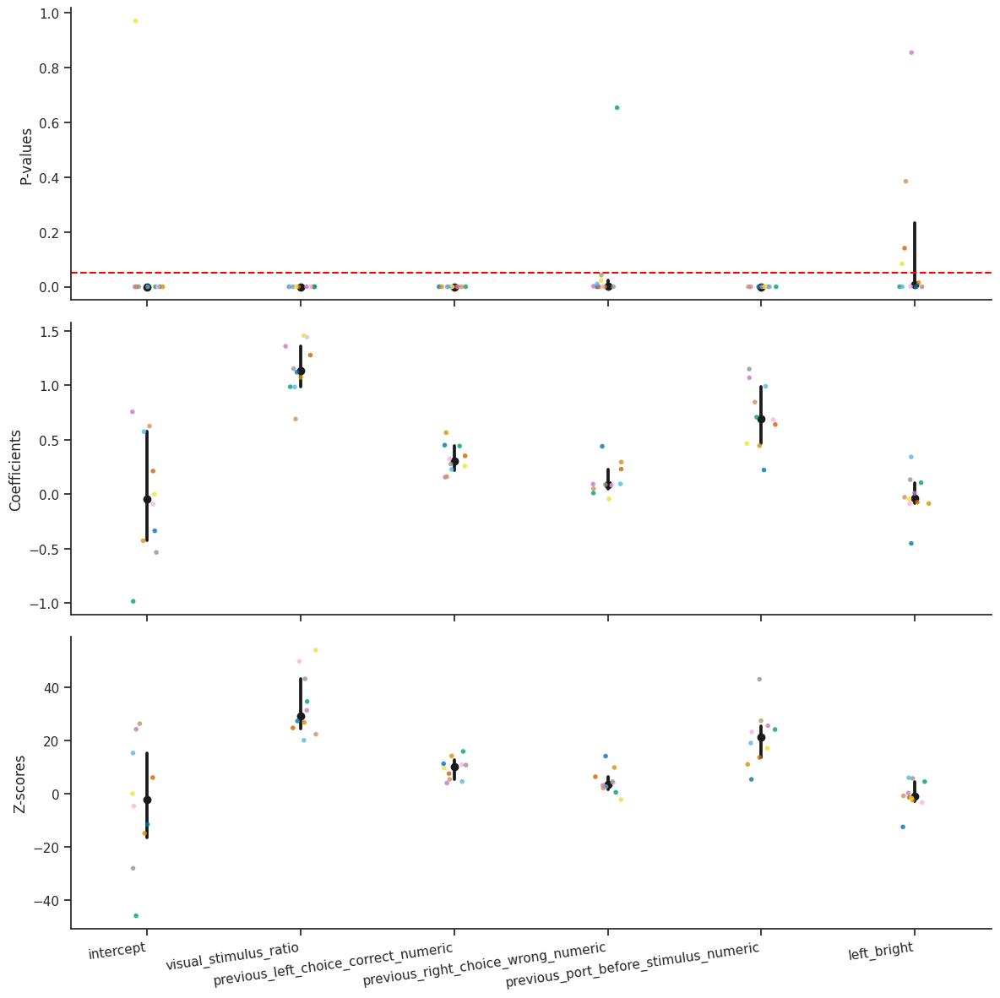

In [ ]:
X = ['visual_stimulus_ratio',
    # 'visual_ratio_diff_interact',
    # 'visual_ratio_bright_interact', 
    'previous_left_choice_correct_numeric',
    'previous_right_choice_wrong_numeric',
    # 'previous_first_choice_numeric', 
    # 'previous_last_choice_numeric', 
    'previous_port_before_stimulus_numeric',
    'left_bright'
    ]
plots.plot_model_vars_params_compare(dic_fit=df_dic_hard_vis, X=X, y='first_choice_numeric')

         Current function value: 0.630892
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.647778
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.630912
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.631556
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.630894
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.631550
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.630997
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated 

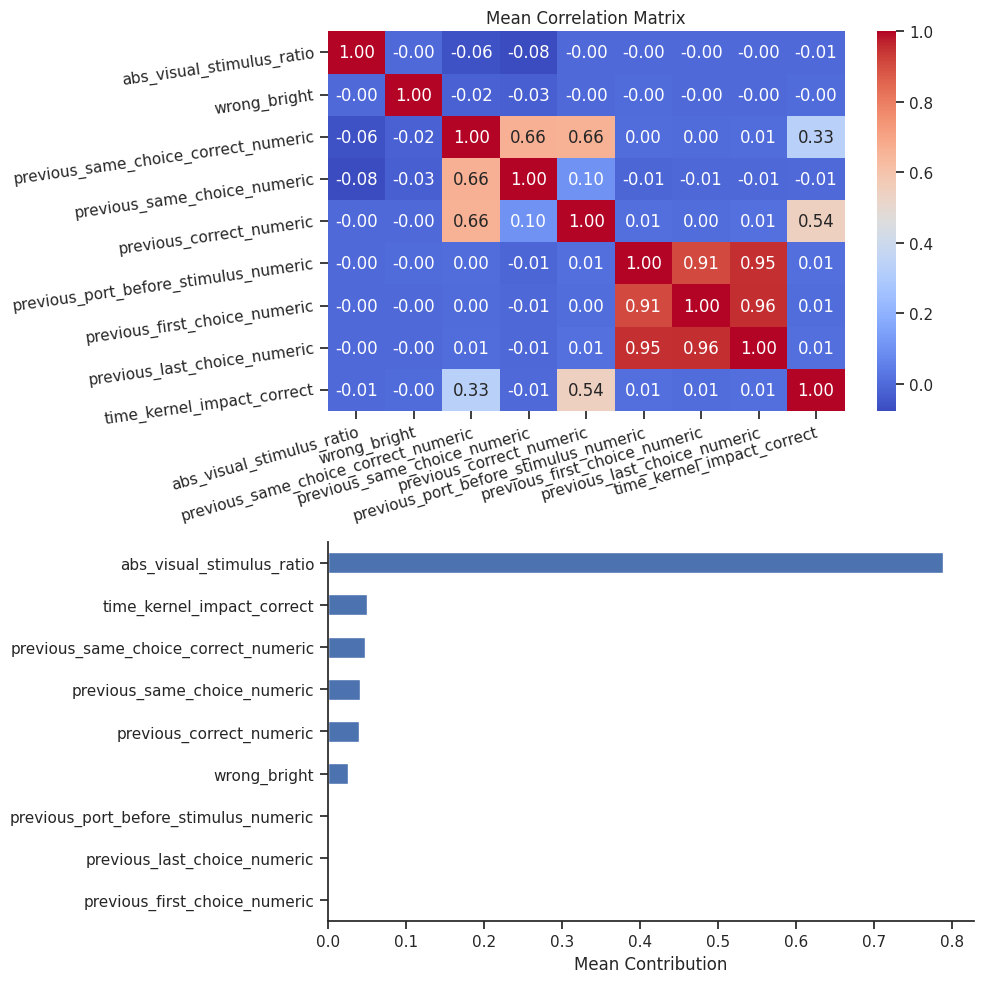

In [286]:
X = ['abs_visual_stimulus_ratio',
    'wrong_bright', 
    'previous_same_choice_correct_numeric', 
    'previous_same_choice_numeric', 
    'previous_correct_numeric', 
    'previous_port_before_stimulus_numeric', 
    'previous_first_choice_numeric', 
    'previous_last_choice_numeric', 
    'time_kernel_impact_correct'
        ]
corr_mat_list, norm_contribution_df = utils.filter_variables_for_model(dic_fit=df_dic_hard_vis, X = X, y='correct_numeric', max_lag=max_lag_vis_correct, tau=1)
plots.plot_filter_model_variables(corr_mat_list=corr_mat_list, norm_contribution_df=norm_contribution_df)

Optimization terminated successfully.
         Current function value: 0.631287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618103
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572834
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.550327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597829
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589358
  

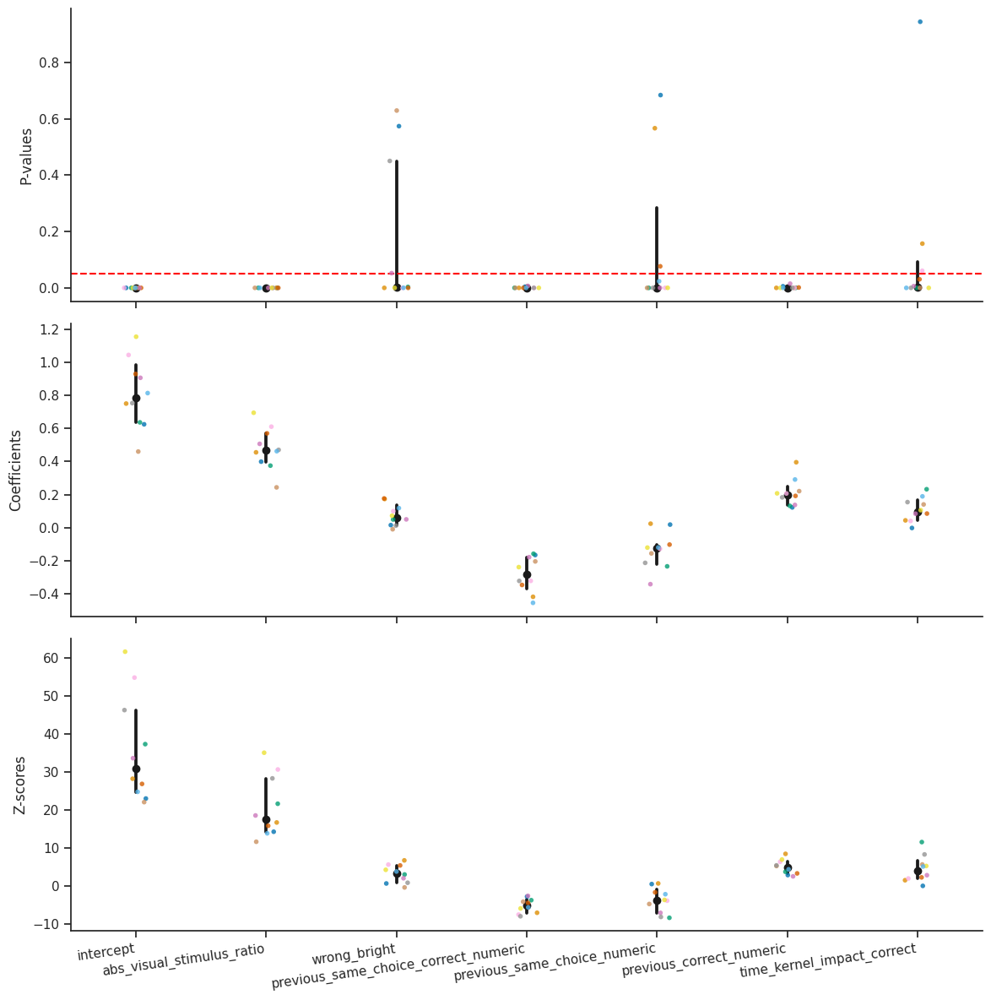

In [344]:
X = ['abs_visual_stimulus_ratio',
    'wrong_bright', 
    'previous_same_choice_correct_numeric', 
    'previous_same_choice_numeric', 
    'previous_correct_numeric', 
    # 'previous_port_before_stimulus_numeric', 
    # 'previous_first_choice_numeric', 
    # 'previous_last_choice_numeric', 
    'time_kernel_impact_correct'
        ]
plots.plot_model_vars_params_compare(dic_fit=df_dic_hard_vis, X=X, y='correct_numeric')

         Current function value: 0.631223
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.631223
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.631223
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.631226
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.633191
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.631224
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
         Current function value: 0.631228
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

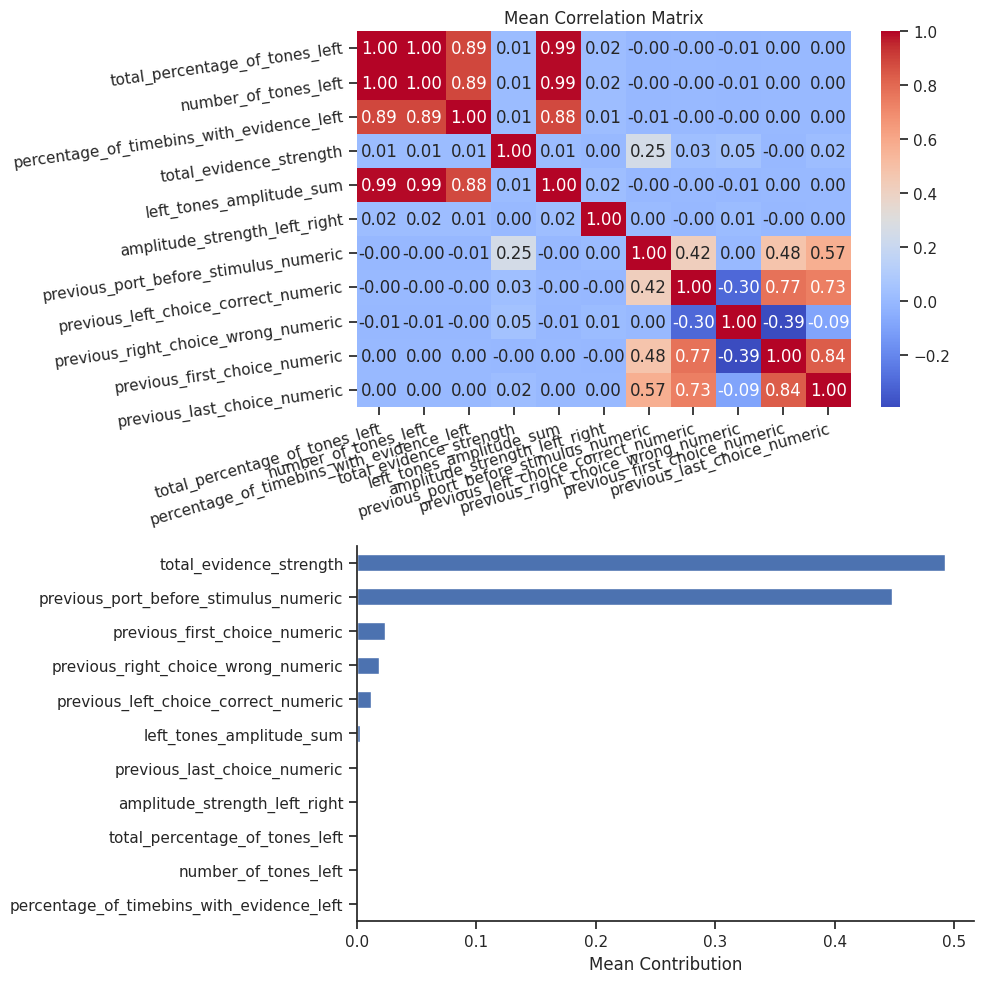

In [312]:
X = ['total_percentage_of_tones_left',
    'number_of_tones_left',
    'percentage_of_timebins_with_evidence_left', 
    'total_evidence_strength', 
    'left_tones_amplitude_sum',
    'amplitude_strength_left_right',
    'previous_port_before_stimulus_numeric',
    'previous_left_choice_correct_numeric',
    'previous_right_choice_wrong_numeric',
    'previous_first_choice_numeric', 
    'previous_last_choice_numeric'
    ]
corr_mat_list, norm_contribution_df = utils.filter_variables_for_model(dic_fit=df_dic_hard_aud, X = X, y='first_choice_numeric')
plots.plot_filter_model_variables(corr_mat_list=corr_mat_list, norm_contribution_df=norm_contribution_df)

Optimization terminated successfully.
         Current function value: 0.638068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.419861
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.372854
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.428543
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.440248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.434800
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.406386
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.456548
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.279850
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.505998
  

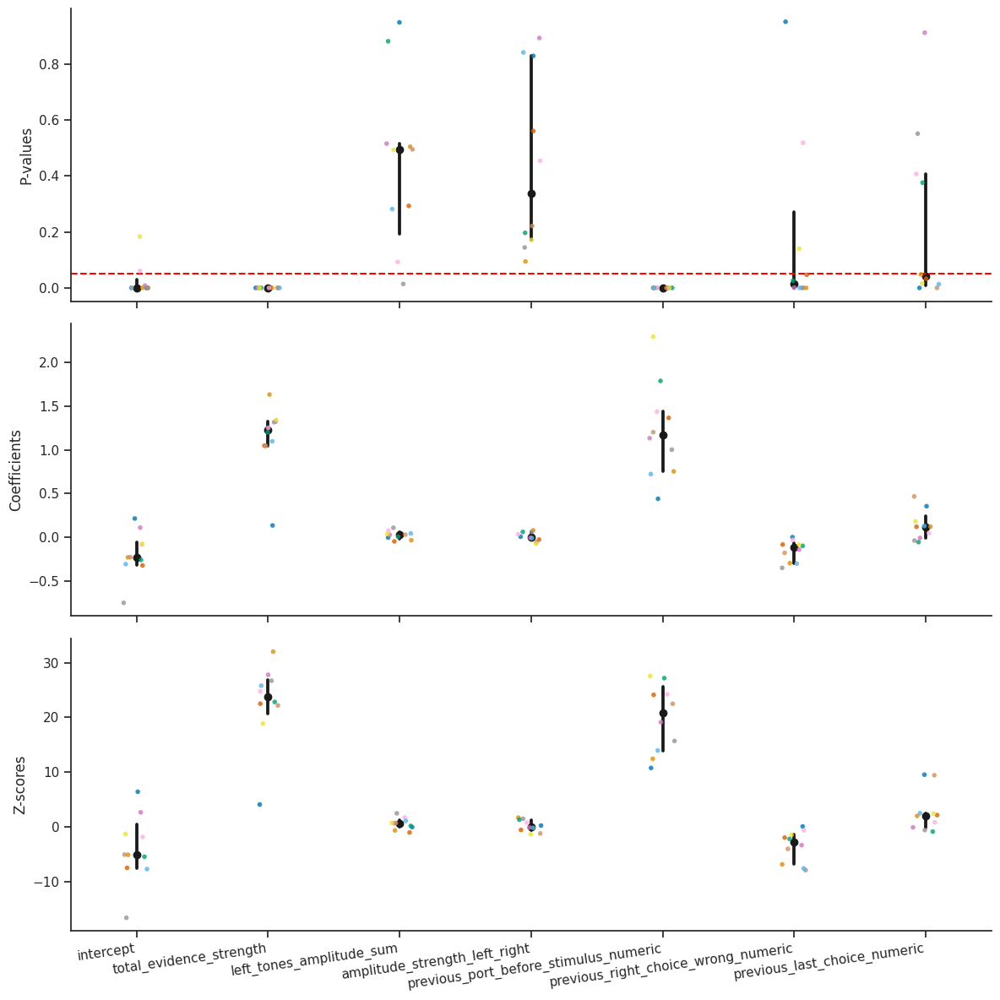

In [346]:
X = [
    # 'total_percentage_of_tones_left',
    # 'number_of_tones_left',
    # 'percentage_of_timebins_with_evidence_left', 
    'total_evidence_strength', 
    'left_tones_amplitude_sum',
    'amplitude_strength_left_right',
    'previous_port_before_stimulus_numeric',
    # 'previous_left_choice_correct_numeric',
    'previous_right_choice_wrong_numeric',
    # 'previous_first_choice_numeric', 
    'previous_last_choice_numeric'
    ]
plots.plot_model_vars_params_compare(dic_fit=df_dic_hard_aud, X=X, y='first_choice_numeric')

         Current function value: 0.666111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.666111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.666111
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.666633
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.666389
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.666111
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 0.666112
         Iterations: 35
         Functio

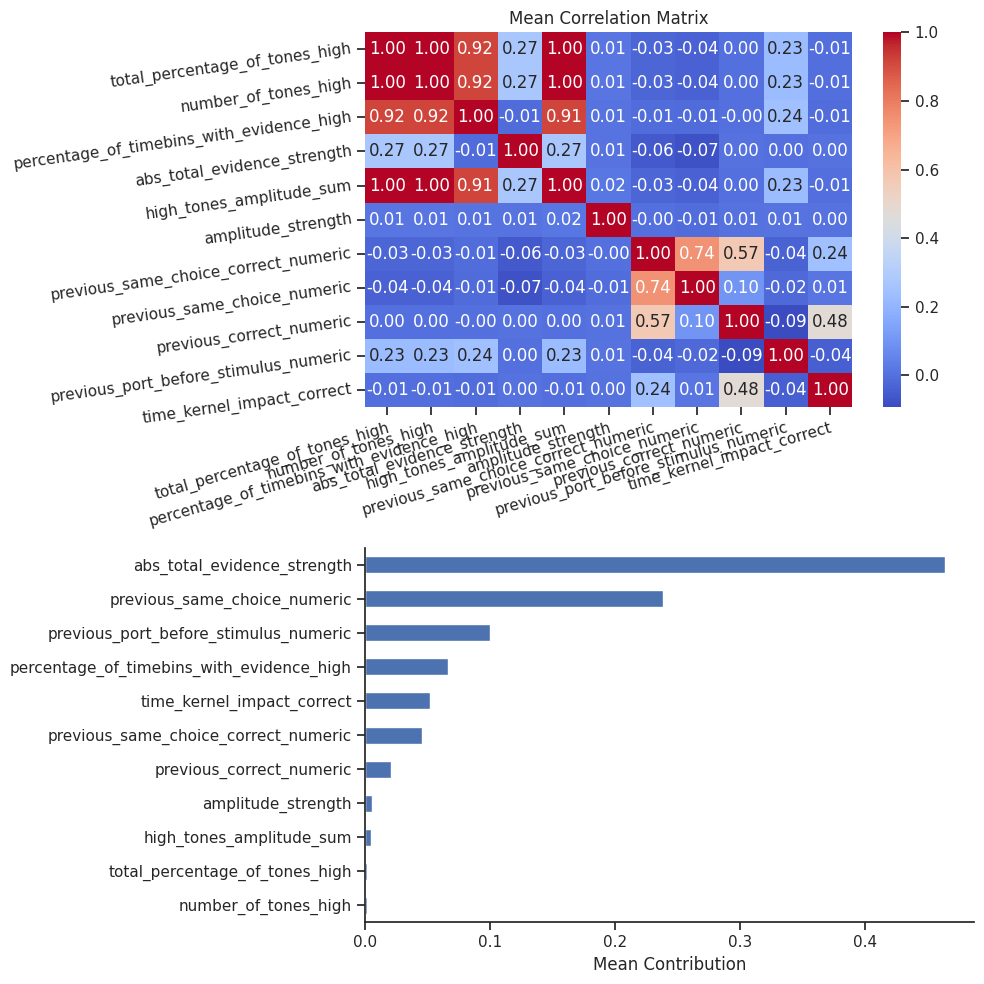

In [311]:
X = ['total_percentage_of_tones_high',
    'number_of_tones_high',
    'percentage_of_timebins_with_evidence_high', 
    'abs_total_evidence_strength', 
    'high_tones_amplitude_sum',
    'amplitude_strength',
    'previous_same_choice_correct_numeric', 
    'previous_same_choice_numeric', 
    'previous_correct_numeric', 
    'previous_port_before_stimulus_numeric', 
    'time_kernel_impact_correct'
    ]
corr_mat_list, norm_contribution_df = utils.filter_variables_for_model(dic_fit=df_dic_hard_aud, X = X, y='correct_numeric', max_lag=max_lag_aud_correct, tau=1)
plots.plot_filter_model_variables(corr_mat_list=corr_mat_list, norm_contribution_df=norm_contribution_df)

Optimization terminated successfully.
         Current function value: 0.669645
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.465956
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568432
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.524351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581424
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554236
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.523942
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559419
  

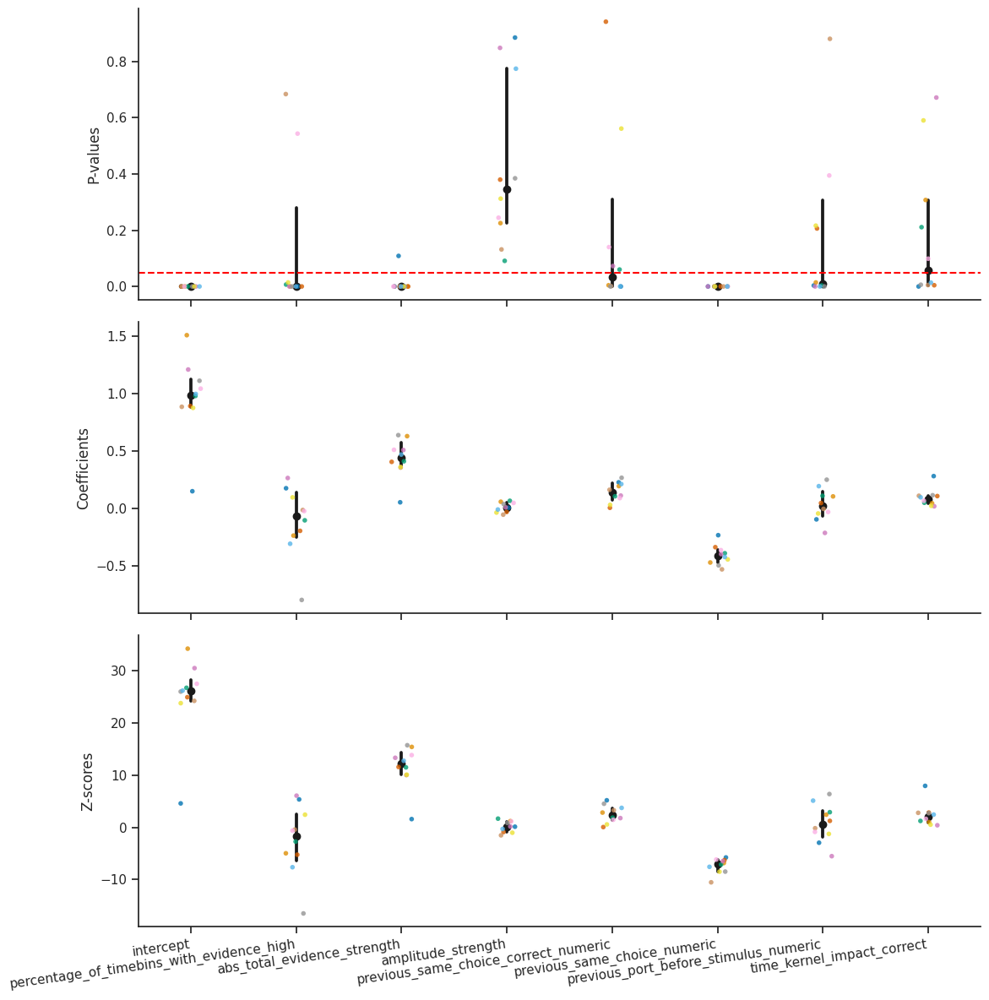

In [348]:
X = [
    # 'total_percentage_of_tones_high',
    # 'number_of_tones_high',
    'percentage_of_timebins_with_evidence_high', 
    'abs_total_evidence_strength', 
    # 'high_tones_amplitude_sum',
    'amplitude_strength',
    'previous_same_choice_correct_numeric', 
    'previous_same_choice_numeric', 
    # 'previous_correct_numeric', 
    'previous_port_before_stimulus_numeric', 
    'time_kernel_impact_correct'
    ]
plots.plot_model_vars_params_compare(dic_fit=df_dic_hard_aud, X=X, y='correct_numeric')

I kept what you did for comparison here

In [ ]:
# It is interesting to compare the effects of the relative difference between the two visual stimuli,
# and the absolute difference between them.

# Maybe what we can do is to train another logistic regression model, adding as well the absolute difference
# between the two visual stimuli, and see how it affects the probability of a left choice.
# Do you know what I mean?

for i in df_test.groupby('visual_stimulus_ratio'):
    df_i = i[1].sort_values(by='visual_stimulus_diff')
    X = df_i['visual_stimulus_diff'].values.reshape(-1, 1)
    y = df_i['left_choice'].values.astype(int)
    model = LogisticRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    y_prob = model.predict_proba(X)[:, 1]
    plt.plot(X, y_prob, label=f"Visual Stimulus ratio: {i[0]}")
    plt.legend()
plt.xlabel("Visual Stimulus Difference")
plt.ylabel("Probability of Left Choice")
plt.show()

# change with time

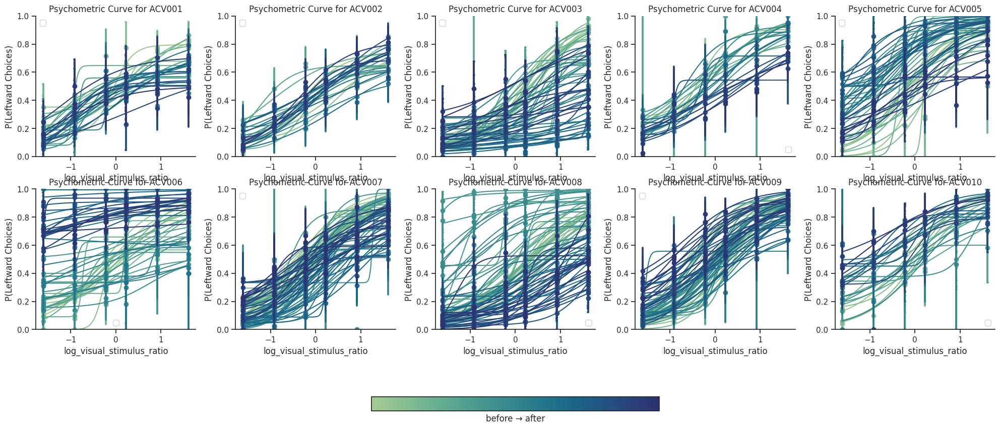

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(20, 10))
for df_name, df, n in zip(df_dic_hard_vis.keys(), df_dic_hard_vis.values(), range(len(df_dic_hard_vis))):
    row = n // 5
    col = n % 5
    for session, color in zip(df['session'].unique(), sns.color_palette("crest", len(df['session'].unique()))):
        df_session = df[df['session'] == session]
        plots.psychometric_plot(df_session, x='visual_stimulus_ratio', y='first_choice_numeric',ax=ax[row, col], point_kwargs={'color': color, 'label' : ''}, line_kwargs={'color': color, 'label': ''})
    ax[row, col].set_title(f"Psychometric Curve for {df_name}")
plt.tight_layout()
# Add a colorbar to indicate the session
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=sns.color_palette("crest", as_cmap=True)), orientation='horizontal', ax=ax, shrink=0.3)
cbar.set_ticks([])
cbar.set_label('before → after')
plt.legend()
plt.show()

In [391]:
def plot_model_param_evolution(
    df_dic: dict,
    x_col: str,
    y_col: str,
    block_size: int = 1000,
    title: str = "Model parameter evolution over trial blocks",
    figsize: tuple = (14, 4),
    palette: str = "colorblind"
):
    fig, ax = plt.subplots(1, 4, figsize=figsize)
    colors = sns.color_palette(palette, len(df_dic))

    lapse_left_dict, lapse_right_dict, slope_dict, bias_dict = {}, {}, {}, {}

    for (df_name, df), color in zip(df_dic.items(), colors):
        df = df.copy()
        df["trial_group"] = np.arange(len(df)) // block_size

        lapse_left, lapse_right, slope, bias = [], [], [], []

        for group in df["trial_group"].unique():
            df_group = df[df["trial_group"] == group]
            _, params = utils.fit_lapse_logistic_independent(df_group[x_col], df_group[y_col])
            lapse_left.append(params[0])
            lapse_right.append(params[1])
            slope.append(params[2])
            bias.append(params[3])

        lapse_left_dict[df_name] = lapse_left
        lapse_right_dict[df_name] = lapse_right
        slope_dict[df_name] = slope
        bias_dict[df_name] = bias

        for a, param, name in zip(ax, [lapse_left, lapse_right, slope, bias],
                                  ["Lapse Left", "Lapse Right", "Beta", "X0"]):
            a.plot(param, c=color, alpha=0.5)
            a.set_ylabel(name)

    lapse_left_df = pd.DataFrame({k: pd.Series(v) for k, v in lapse_left_dict.items()})
    lapse_right_df = pd.DataFrame({k: pd.Series(v) for k, v in lapse_right_dict.items()})
    slope_df = pd.DataFrame({k: pd.Series(v) for k, v in slope_dict.items()})
    bias_df = pd.DataFrame({k: pd.Series(v) for k, v in bias_dict.items()})

    for a, df, name in zip(ax,
                           [lapse_left_df, lapse_right_df, slope_df, bias_df],
                           ["Lapse Left", "Lapse Right", "Beta", "X0"]):
        a.plot(df.mean(axis=1), color="k", linestyle="-", label="Overall Mean")
        a.set_xlabel(f"{block_size}-Trial Blocks")
        a.legend(frameon=False)
        a.set_title(name)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


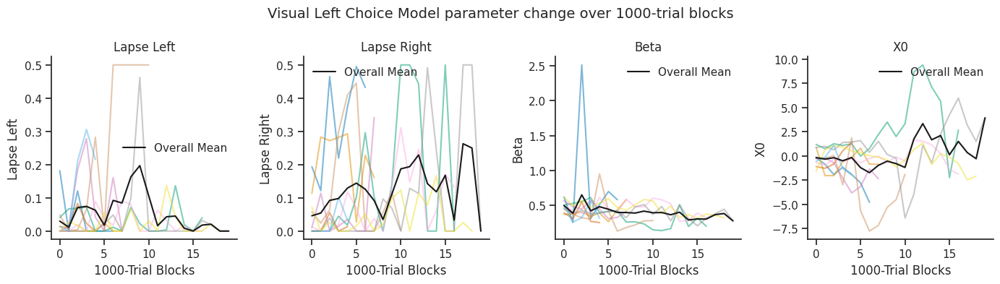

In [ ]:
plot_model_param_evolution(
    df_dic=df_dic_hard_vis,
    x_col="visual_stimulus_ratio",
    y_col="first_choice_numeric",
    title="Visual Left Choice Model parameter change over 1000-trial blocks"
)


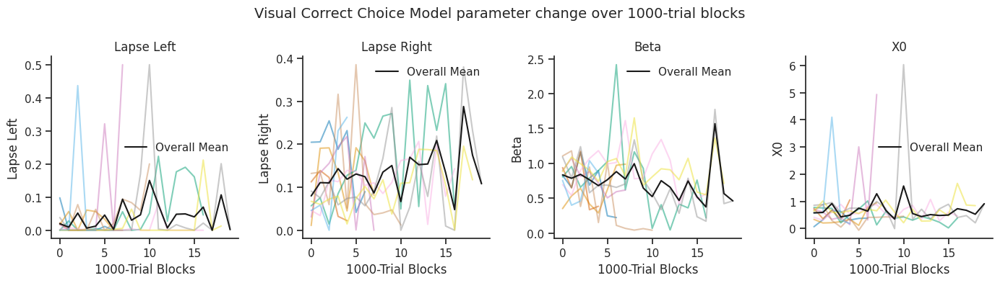

In [ ]:
plot_model_param_evolution(
    df_dic=df_dic_hard_vis,
    x_col="abs_visual_stimulus_ratio",
    y_col="correct_numeric",
    title="Visual Correct Choice Model parameter change over 1000-trial blocks"
)

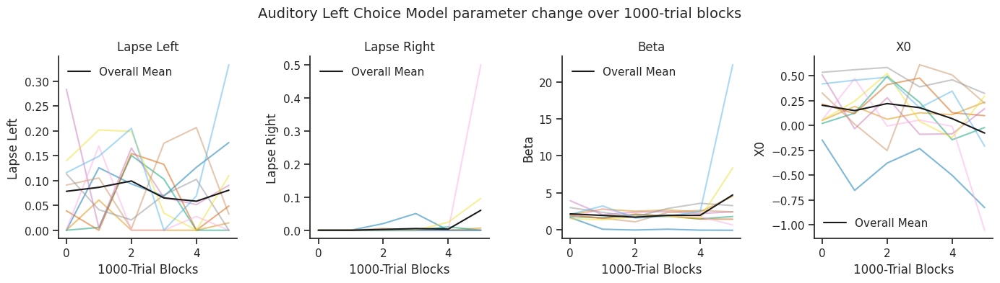

In [ ]:
plot_model_param_evolution(
    df_dic=df_dic_hard_aud,
    x_col="total_evidence_strength",
    y_col="first_choice_numeric",
    title="Auditory Left Choice Model parameter change over 1000-trial blocks"
)

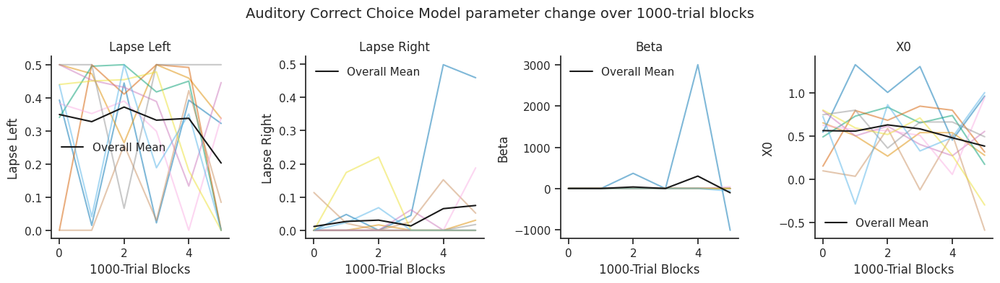

In [396]:
plot_model_param_evolution(
    df_dic=df_dic_hard_aud,
    x_col="abs_total_evidence_strength",
    y_col="correct_numeric",
    title="Auditory Correct Choice Model parameter change over 1000-trial blocks"
)

# timebin evidence of auditory task

In [ ]:
sound_properties_for_cot_mat = {
    "duration": .5,
    "high_amplitude_mean": 70,
    "low_amplitude_mean": 70,
    "amplitude_std": 2,
    "subduration": 0.03,
    "suboverlap": 0.01,
    "ambiguous_beginning_time": 0.05,
}

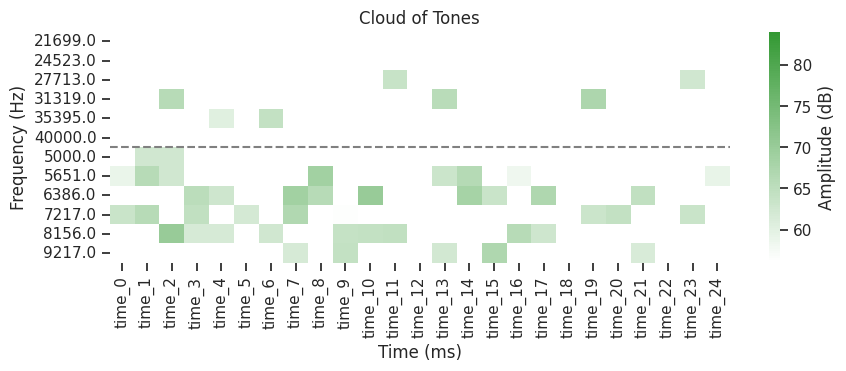

In [418]:
# auditory stimuli plot
aud_stim_sample = df_dic_hard_aud['ACV001']['auditory_stimulus'][67103]
high_mat = pd.DataFrame(eval(aud_stim_sample)['high_tones'])[::-1]
low_mat = pd.DataFrame(eval(aud_stim_sample)['low_tones'])[::-1]

colors = [(1, 1, 1), (0.2, 0.6, 0.2)]  # White to seagreen
n_bins = 100  # Discretize the interpolation into bins
cmap_name = 'white_to_seagreen'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)
plt.figure(figsize=(10, 3))
mat_to_plot = pd.concat([high_mat[::-1], low_mat[::-1]])
sns.heatmap(mat_to_plot,
            cmap=cmap,
            vmin=sound_properties_for_cot_mat["low_amplitude_mean"] * .8,
            vmax=sound_properties_for_cot_mat["high_amplitude_mean"] * 1.2,
            cbar_kws={'label': 'Amplitude (dB)'})
plt.hlines(6, 0, high_mat.shape[1], colors='gray', linestyles='dashed')
plt.xlabel("Time (ms)")
plt.ylabel("Frequency (Hz)")
plt.title("Cloud of Tones")
plt.show()

In [397]:
timebin_evidence_df = pd.DataFrame()
for df_name, df, color in zip(df_dic_hard_aud.keys(), df_dic_hard_aud.values(), sns.color_palette("colorblind", len(df_dic_hard_aud))):
    X = np.array([utils.get_timebin_evidence(eval(t)) for t in df['auditory_stimulus']])
    y = df['first_choice_numeric']
    X_model = sm.add_constant(X) 
    glm = sm.Logit(y, X_model).fit()
    timebin_evidence_df[df_name] = glm.params[1:]

Optimization terminated successfully.
         Current function value: 0.681204
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.412728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.502363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.526561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.485523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533586
  

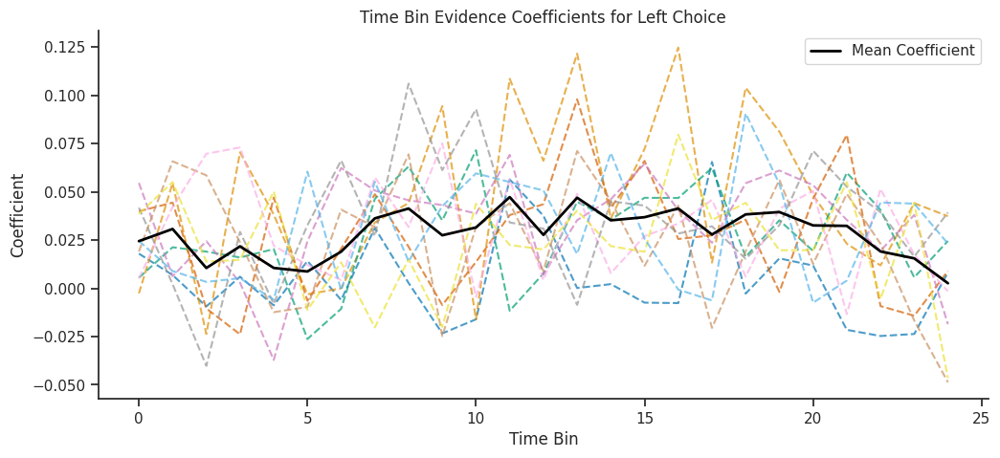

In [399]:
fig = plt.figure(figsize=(12, 5))
timebin_evidence_df.index = range(len(timebin_evidence_df))
for df_name, col, color in zip(timebin_evidence_df.columns, timebin_evidence_df, sns.color_palette("colorblind", len(timebin_evidence_df))):
    plt.plot(timebin_evidence_df[col], color=color, linestyle='--', alpha=0.7)
plt.plot(timebin_evidence_df.mean(axis=1), color='black', label='Mean Coefficient', linewidth=2)
plt.xlabel("Time Bin")
plt.ylabel("Coefficient")
plt.title("Time Bin Evidence Coefficients for Left Choice")
plt.legend()

In [402]:
timebin_evidence_df = pd.DataFrame()
for df_name, df, color in zip(df_dic_hard_aud.keys(), df_dic_hard_aud.values(), sns.color_palette("colorblind", len(df_dic_hard_aud))):
    X = np.abs(np.array([utils.get_timebin_evidence(eval(t)) for t in df['auditory_stimulus']]))
    y = df['correct_numeric']
    X_model = sm.add_constant(X) 
    glm = sm.Logit(y, X_model).fit()
    timebin_evidence_df[df_name] = glm.params[1:]

Optimization terminated successfully.
         Current function value: 0.685675
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.418709
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544947
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.503711
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.529333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539185
  

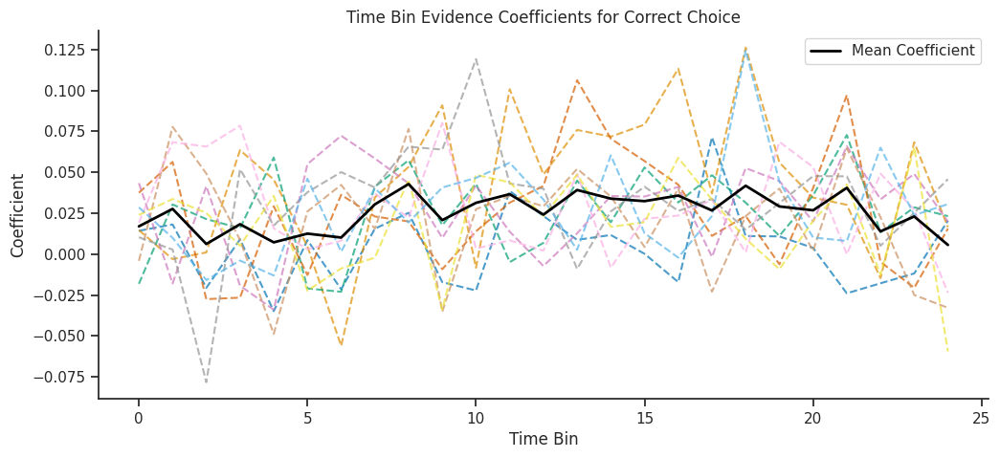

In [404]:
fig = plt.figure(figsize=(12, 5))
timebin_evidence_df.index = range(len(timebin_evidence_df))
for df_name, col, color in zip(timebin_evidence_df.columns, timebin_evidence_df, sns.color_palette("colorblind", len(timebin_evidence_df))):
    plt.plot(timebin_evidence_df[col], color=color, linestyle='--', alpha=0.7)
plt.plot(timebin_evidence_df.mean(axis=1), color='black', label='Mean Coefficient', linewidth=2)
plt.xlabel("Time Bin")
plt.ylabel("Coefficient")
plt.title("Time Bin Evidence Coefficients for Correct Choice")
plt.legend()